In [1]:
import numpy as np
import pandas as panda
from matplotlib import pyplot as plot
import seaborn as sns

import pandas as panda
import numpy as np
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE

from sklearn.preprocessing import StandardScaler, MinMaxScaler,RobustScaler,label_binarize

from sklearn.model_selection import train_test_split,KFold,StratifiedKFold,GridSearchCV,RepeatedStratifiedKFold,learning_curve

from sklearn.metrics import f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve, \
        classification_report,confusion_matrix,average_precision_score
from sklearn.linear_model import Perceptron, LogisticRegression,RidgeClassifier,SGDClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from matplotlib import pyplot as plot
from itertools import cycle
import numpy as np 
from scipy import interp
import seaborn as sns
import itertools, time, datetime
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from numpy import bincount, linspace, mean, std, arange, squeeze

import warnings

warnings.simplefilter('ignore')
%matplotlib inline


In [2]:
train_data = panda.read_csv('data/train.csv')


In [3]:
train_data.target.value_counts()

1.0    160
0.0     90
Name: target, dtype: int64

In [4]:
train_data['target'] = train_data.target.astype(np.int64)

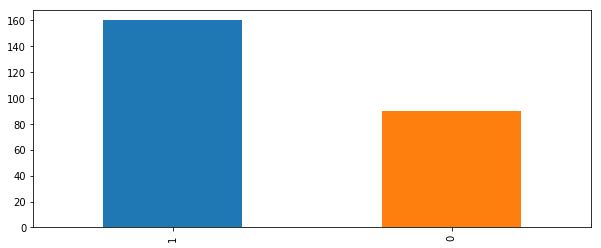

In [5]:
plot.figure(figsize=(10,4))
train_data.target.value_counts().plot(kind='bar')
plot.show()

In [6]:
train_data[[i for i in train_data.columns.tolist() if i not in ['target','id']]].describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
0,250.0,0.023292,0.998354,-2.319,-0.64475,-0.0155,0.67700,2.567
1,250.0,-0.026872,1.009314,-2.931,-0.73975,0.0570,0.62075,2.419
2,250.0,0.167404,1.021709,-2.477,-0.42525,0.1840,0.80500,3.392
3,250.0,0.001904,1.011751,-2.359,-0.68650,-0.0165,0.72000,2.771
4,250.0,0.001588,1.035411,-2.566,-0.65900,-0.0230,0.73500,2.901
5,250.0,-0.007304,0.955700,-2.845,-0.64375,0.0375,0.66050,2.793
6,250.0,0.032052,1.006657,-2.976,-0.67500,0.0605,0.78325,2.546
7,250.0,0.078412,0.939731,-3.444,-0.55075,0.1835,0.76625,2.846
8,250.0,-0.036920,0.963688,-2.768,-0.68950,-0.0125,0.63500,2.512
9,250.0,0.035448,1.019689,-2.361,-0.64350,0.0520,0.73300,2.959


In [7]:
data_type = train_data.dtypes.to_frame().reset_index()
data_type.columns  = ['col_name','col_type']
data_type[data_type.col_type==np.object].head()

,col_name,col_type


In [8]:
train_data.isnull().any().sum()

0

In [9]:
col_names = [i for i in train_data.columns if i not in ['target','id']]

In [10]:
def draw_relevant_plots(table, columns):
    
    
    fig, axes = plot.subplots(1, 5, figsize=(10, 7), sharex=True)
    count = 0
    for col in columns:
        
        ax = axes[count]
        sns.distplot(table[col], ax = axes[count])
        
        count+= 1
    plot.show()  
    
    plot.figure(figsize = (10,4))
    data = table[columns]
    data = panda.concat([data,table['target']], axis = 1)
    correlation_map = np.corrcoef(data.values.T)
    sns.heatmap(correlation_map,
                cbar = True,
                annot=True,
                square = True,
                fmt = '.2f',
                annot_kws = {'size':15},
                yticklabels = data.columns.tolist(),
                xticklabels = data.columns.tolist(),
               )
    plot.show()
        

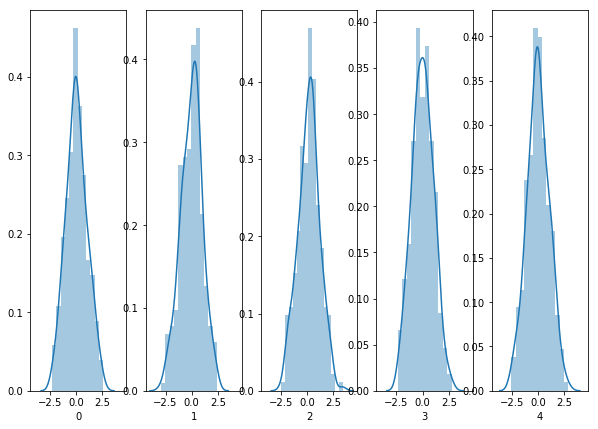

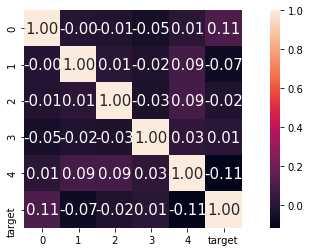

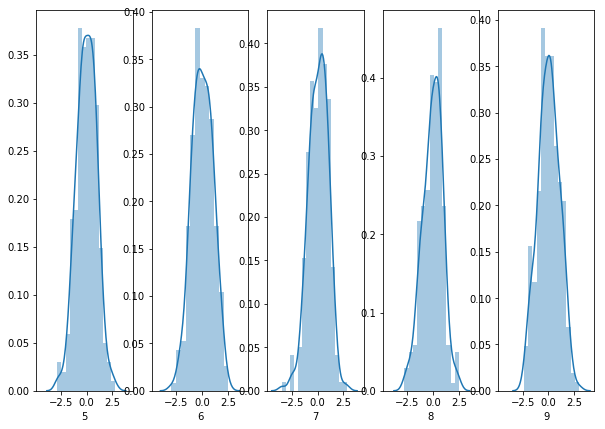

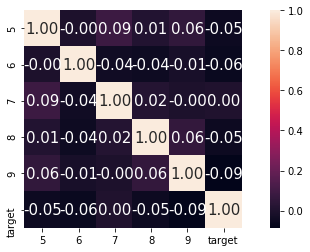

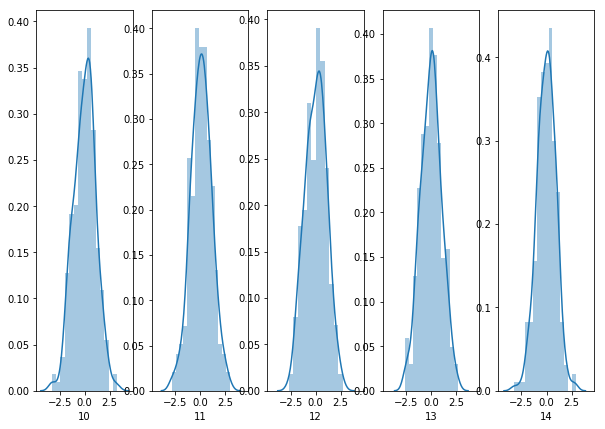

...

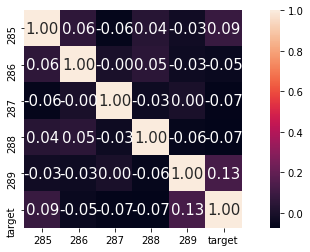

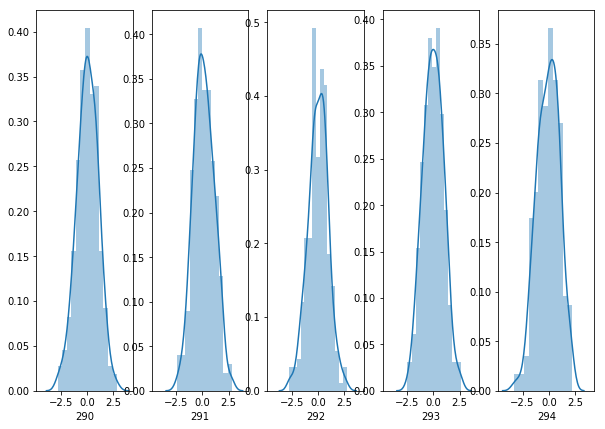

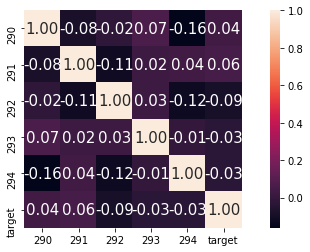

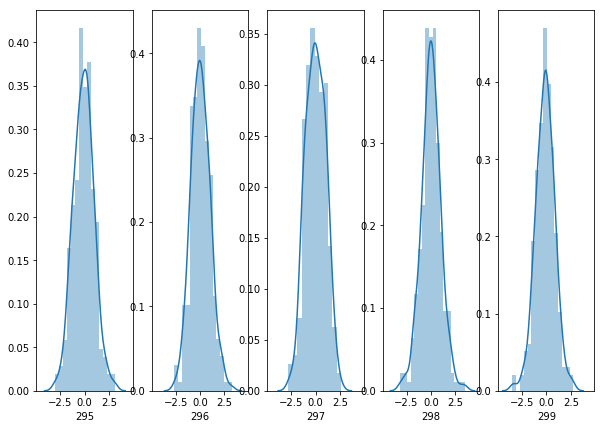

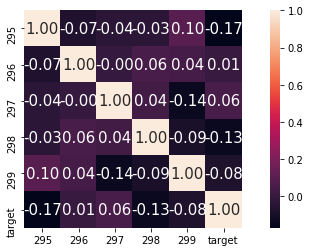

In [11]:
col_chunks = [col_names[i:i+5] for i in range(0,len(col_names),5)]

for item in col_chunks:
    draw_relevant_plots(train_data, item)

In [12]:
from scipy import stats
def calculateCorrelationCoefficientsAndpValues(x_data, y_data, xlabel):
    
    pearson_coef, p_value = stats.pearsonr(x_data, y_data)
    print("The Pearson Correlation Coefficient for %s is %s with a P-value of P = %s" %(xlabel,pearson_coef, p_value))
    
    return (pearson_coef,p_value)

In [13]:
pearson_coeff = []
p_value = []
col_name = []

for col in [i for i in train_data.columns.tolist() if i not in ['id','target']]:
    
    x,y = calculateCorrelationCoefficientsAndpValues(train_data[col], train_data['target'], col)
    pearson_coeff.append(x)
    p_value.append(y)
    col_name.append(col)
    
pearson_table = panda.DataFrame({'column_name':col_name , 'pearson_coeff':pearson_coeff, 'p_value': p_value})
pearson_table.head()

The Pearson Correlation Coefficient for 0 is 0.10896613295780612 with a P-value of P = 0.0855425108978631
The Pearson Correlation Coefficient for 1 is -0.07331927684495224 with a P-value of P = 0.2480801859987947
The Pearson Correlation Coefficient for 2 is -0.015140943820013032 with a P-value of P = 0.8117157095966047
The Pearson Correlation Coefficient for 3 is 0.011549011379043529 with a P-value of P = 0.8558206568804985
The Pearson Correlation Coefficient for 4 is -0.11472596336421398 with a P-value of P = 0.07016102972091894
The Pearson Correlation Coefficient for 5 is -0.05032883942137733 with a P-value of P = 0.42819565779211044
The Pearson Correlation Coefficient for 6 is -0.05706281139477776 with a P-value of P = 0.36894411376906777
The Pearson Correlation Coefficient for 7 is 0.0042391278386217585 with a P-value of P = 0.9468277872565647
The Pearson Correlation Coefficient for 8 is -0.04844250987759829 with a P-value of P = 0.44573026468867594
The Pearson Correlation Coeffici

,column_name,pearson_coeff,p_value
0,0,0.108966,0.085543
1,1,-0.073319,0.248080
2,2,-0.015141,0.811716
3,3,0.011549,0.855821
4,4,-0.114726,0.070161


In [27]:
pearson_table[(pearson_table.pearson_coeff>0.1) | (pearson_table.pearson_coeff<-0.1)]

,column_name,pearson_coeff,p_value
0,0,0.108966,8.554251e-02
4,4,-0.114726,7.016103e-02
13,13,0.107828,8.888181e-02
16,16,-0.144267,2.251444e-02
17,17,0.110998,7.983294e-02
24,24,0.173096,6.071028e-03
30,30,0.132705,3.599201e-02
33,33,0.373608,1.060808e-09
39,39,-0.142915,2.382252e-02
43,43,-0.121413,5.521489e-02


There are a couple of observations that we can make out of the above diagrams:

1. ALmost all independent variables are distributed within -2.5 and 2.5
2. Almost all have near normal distributions
3. Almost none have any significant outliers
4. Pearsons correlation coeff for each indedepent variable with target variable is pretty low
5. There are no categorical data

#### Based on above data analysis, we are going to attempt 3 things

1. create a baseline model out of gridsearch for the data using the usual suspects of classifiers. 


2. Plot learning curve and auc/roc scores for each


3. try SMOTE and run on the same model created in point 1 and compare scores


4. try dimensionality reduction techniques such as PCA,LDA and t-SNE and run on baseline models created in step 1.


5. try dimensionality reduction techniques such as PCA,LDA and t-SNE and run on baseline models created in step 3.


In [12]:
class CodeTimer:
    
    """
        Utility custom contextual class for calculating the time 
        taken for a certain code block to execute
    
    """
    def __init__(self, name=None):
        self.name = " '"  + name + "'" if name else ''

    def __enter__(self):
        self.start = time.clock()

    def __exit__(self, exc_type, exc_value, traceback):
        self.took = (time.clock() - self.start) * 1000.0
        time_taken = datetime.timedelta(milliseconds = self.took)
        print('Code block' + self.name + ' took(HH:MM:SS): ' + str(time_taken))
        
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plot.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plot.imshow(cm, interpolation='nearest', cmap=cmap)
    plot.title(title)
    plot.colorbar()
    tick_marks = arange(len(classes))
    plot.xticks(tick_marks, classes, rotation=45)
    plot.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plot.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plot.ylabel('True label')
    plot.xlabel('Predicted label')
#     plot.tight_layout()
    plot.show()

In [13]:

def plotLearningCurve(_x_train, _y_train, learning_model_pipeline,  model_name, k_fold = 10, training_sample_sizes = linspace(0.1,1.0,10), jobsInParallel = 1):
    
    training_size, training_score, testing_score = learning_curve(estimator = learning_model_pipeline, \
                                                                X = _x_train, \
                                                                y = _y_train, \
                                                                train_sizes = training_sample_sizes, \
                                                                cv = k_fold, \
                                                                n_jobs = jobsInParallel) 


    training_mean = mean(training_score, axis = 1)
    training_std_deviation = std(training_score, axis = 1)
    testing_std_deviation = std(testing_score, axis = 1)
    testing_mean = mean(testing_score, axis = 1 )

    ## we have got the estimator in this case the perceptron running in 10 fold validation with 
    ## equal division of sizes betwwen .1 and 1. After execution, we get the number of training sizes used, 
    ## the training scores for those sizes and the test scores for those sizes. we will plot a scatter plot 
    ## to see the accuracy results and check for bias vs variance

    # training_size : essentially 10 sets of say a1, a2, a3,,...a10 sizes (this comes from train_size parameter, here we have given linespace for equal distribution betwwen 0.1 and 1 for 10 such values)
    # training_score : training score for the a1 samples, a2 samples...a10 samples, each samples run 10 times since cv value is 10
    # testing_score : testing score for the a1 samples, a2 samples...a10 samples, each samples run 10 times since cv value is 10
    ## the mean and std deviation for each are calculated simply to show ranges in the graph

    plot.plot(training_size, training_mean, label= "Training Data", marker= '+', color = 'blue', markersize = 8)
    plot.fill_between(training_size, training_mean+ training_std_deviation, training_mean-training_std_deviation, color='blue', alpha =0.12 )

    plot.plot(training_size, testing_mean, label= "Testing/Validation Data", marker= '*', color = 'green', markersize = 8)
    plot.fill_between(training_size, testing_mean+ training_std_deviation, testing_mean-training_std_deviation, color='green', alpha =0.14 )

    plot.title("Scoring of our training and testing data vs sample sizes for model:"+model_name)
    plot.xlabel("Number of Samples")
    plot.ylabel("Accuracy")
    plot.legend(loc= 'best')
    plot.show()
    
def plot_roc_auc_curve(false_positive_rate, true_positive_rate, model_name):
        
    plot.figure(figsize=(10,3))
    plot.plot(list(false_positive_rate), list(true_positive_rate),  label = "ROC Curve for model: "+model_name)     
    plot.plot([0, 1], [0, 1], 'k--', label = 'Random Guessing')
    plot.plot([0, 0, 1], [0,1, 1], ':', label = 'Perfect Score')
    plot.title('ROC Curve for model: %s'%model_name)
    plot.xlabel('False Positive Rate')
    plot.ylabel('True Positive Rate')
    plot.legend(loc='best')
    plot.show()
    
    
def plot_precision_recall_curve(precision, recall, model_name):
    
    plot.figure(figsize=(10,3))
    plot.plot(list(recall), list(precision),  label = "Precision/Recall Curve for model: "+model_name)     
#     plot.plot([0, 1], [0, 1], 'k--', label = 'Random Guessing') #
    plot.title('Precision Recall Curve for model: %s'%model_name)
    plot.xlabel('Recall')
    plot.ylabel('Precision')
    plot.legend(loc='best')
    plot.show()


    


In [14]:
def runGridSearchAndPredict(pipeline,model_name, x_train, y_train, x_test, y_test, param_grid, n_jobs = 1, cv = 10, score = 'accuracy'):
#     pass

    response =  {}
    training_timer       = CodeTimer('training')
    testing_timer        = CodeTimer('testing')
    learning_curve_timer = CodeTimer('learning_curve')
    predict_proba_timer  = CodeTimer('predict_proba')
    
    with training_timer:
        
        gridsearch = GridSearchCV(estimator = pipeline, param_grid = param_grid, cv = cv, n_jobs = n_jobs, scoring = score)

        search = gridsearch.fit(x_train,y_train)

        print("Grid Search Best parameters ", search.best_params_)
        print("Grid Search Best score ", search.best_score_)

    with testing_timer:
        y_prediction = gridsearch.predict(x_test)
            
    print("F1 score %s" %f1_score(y_test,y_prediction, average ='weighted'))
    print("Classification report  \n %s" %(classification_report(y_test, y_prediction)))
    
    with learning_curve_timer:
        plotLearningCurve(x_train, y_train, search.best_estimator_, model_name)
#         _matrix = confusion_matrix(y_true = _y_test ,y_pred = y_prediction, labels = list(range(_y_test.shape[1])))
        _matrix = confusion_matrix(y_true = y_test ,y_pred = y_prediction, labels = list(set(y_test)))
        classes = list(set(y_test))
        plot_confusion_matrix(_matrix, classes, title = "Confusion matrix for model:"+model_name)
        
    with predict_proba_timer:

        if hasattr(gridsearch.best_estimator_, 'predict_proba'):
            
            print('inside decision function')
            y_probability = gridsearch.predict_proba(x_test)
            number_of_classes = len(np.unique(y_train))
            false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_probability[:, 1])
            response['roc_auc_score'] = roc_auc_score(y_test, y_probability[:,1])
            response['roc_curve'] = (false_positive_rate, true_positive_rate)            
            precision, recall, _ = precision_recall_curve(y_test, y_probability[:,1])
            plot_roc_auc_curve(false_positive_rate, true_positive_rate, model_name)
            plot_precision_recall_curve(precision, recall, model_name)
            
        else: ## eg SVM, Perceptron doesnt have predict_proba method
            
            response['roc_auc_score'] = 0
            response['roc_curve'] = 0
    
    response['learning_curve_time'] = learning_curve_timer.took
    response['testing_time'] = testing_timer.took
    response['_y_prediction'] = y_prediction
#     response['accuracy_score'] = accuracy_score(y_test,y_prediction)
    response['training_time'] = training_timer.took
    response['f1_score']  = f1_score(y_test, y_prediction, average ='weighted')
    response['f1_score_micro']  = f1_score(y_test, y_prediction, average ='micro')
    response['f1_score_macro']  = f1_score(y_test, y_prediction, average ='macro')
    response['best_estimator'] = search.best_estimator_
    response['confusion_matrix'] = _matrix
    
    return response


def plotROCCurveAcrossModels(positive_rates_sequence, model_name):
    

    for plot_values, label_name in zip(positive_rates_sequence, model_name):
        
        plot.plot(list(plot_values[0]), list(plot_values[1]),  label = "ROC Curve for model: "+model_name)
        
    plot.plot([0, 1], [0, 1], 'k--', label = 'Random Guessing') #
    plot.title('ROC Curve across models')
    plot.xlabel('False Positive Rate')
    plot.ylabel('True Positive Rate')
    plot.legend(loc='best')
    plot.show()

In [15]:

def execute( _x_train,
             _y_train,
             _x_test,
             _y_test, 
            classifiers, 
            classifier_names, 
            classifier_param_grid,
            cv  = 10 , 
            score = 'accuracy',
            scaler = StandardScaler()
           ):
    
    '''
    This method will run your data sets against the model specified 
    Models will be fed through a pipeline where the first step would be to
    execute a scaling operation.
    
    Method will also call additional lower level methods in order to plot
    precision curve, roc curve, learning curve and will also prepare a confusion matrix
    
    :returns: dict containing execution metrics such as time taken, accuracy scores
    :returntype: dict
    
    '''

    timer = CodeTimer(name='overalltime')
    model_metrics = {}

    with timer:
        for model, model_name, model_param_grid in zip(classifiers, classifier_names, classifier_param_grid):

            pipeline_steps = [('scaler', scaler),(model_name, model)] if scaler is not None else [(model_name, model)]
            pipeline = Pipeline(pipeline_steps)

            result = runGridSearchAndPredict(pipeline, 
                                             model_name,
                                             _x_train,
                                             _y_train,
                                             _x_test,
                                             _y_test, 
                                             model_param_grid ,
                                             cv = cv,
                                             score = score)

            _y_prediction = result['_y_prediction']

            model_metrics[model_name] = {}
            model_metrics[model_name]['confusion_matrix'] = result.get('confusion_matrix')
            model_metrics[model_name]['training_time'] = result.get('training_time')
            model_metrics[model_name]['testing_time'] = result.get('testing_time')
            model_metrics[model_name]['learning_curve_time'] = result.get('learning_curve_time')
            model_metrics[model_name]['f1_score'] = result.get('f1_score')
            model_metrics[model_name]['f1_score_macro'] = result.get('f1_score_macro')
            model_metrics[model_name]['f1_score_micro'] = result.get('f1_score_micro')
            model_metrics[model_name]['roc_auc_score'] = result.get('roc_auc_score')

            model_metrics[model_name]['best_estimator'] = result.get('best_estimator')


    print(timer.took)
    
    return model_metrics


In [16]:

classifiers = [
    Perceptron(random_state = 1),
    LogisticRegression(random_state = 1),
    DecisionTreeClassifier(),
    RandomForestClassifier(random_state = 1),
    KNeighborsClassifier(metric = 'minkowski'),
    RidgeClassifier(random_state = 123), 
    SVC(kernel="linear"),
    SVC(),
    ExtraTreeClassifier(random_state = 123),
    GaussianProcessClassifier(random_state = 123),
    BernoulliNB()
]


classifier_names = [
            'perceptron',
            'logisticregression',
            'decisiontreeclassifier',
            'randomforestclassifier',
            'kneighborsclassifier',
            'ridge',
            'linear_svc',
            'gamma_svc',
            'extra_trees',
            'gaussian_process',
            'bernoulli'
]

classifier_param_grid = [
            
            {'perceptron__max_iter': [5,10,30], 'perceptron__eta0': [.1]},
            {'logisticregression__C':[100,300, 500]},
            {'decisiontreeclassifier__max_depth':[6,8,10],'decisiontreeclassifier__criterion':['gini','entropy']},
            {'randomforestclassifier__n_estimators':[6,8,12],'randomforestclassifier__criterion': ['gini','entropy']} ,
            {'kneighborsclassifier__n_neighbors':[4,6,10]},
            {'ridge__alpha':[1,1.2,0.9],'ridge__max_iter':[100,300,500]},
            {'linear_svc__C':[0.025]},
            {'gamma_svc__gamma':[2,4],'gamma_svc__C':[1,5]},
            {'extra_trees__max_depth':[6,8,12],'extra_trees__criterion': ['gini','entropy']} ,
            {'gaussian_process__max_iter_predict':[200,400]} ,
            {'bernoulli__alpha':[0.2,0.6,1.2]} ,
    
]


In [20]:
x = train_data[[i for i in train_data.columns.tolist() if i not in ['target','id']]]
y = train_data['target']

x_train,x_test,y_train,y_test = train_test_split(x,y , stratify = y, test_size = 0.3, random_state = 123)

In [18]:
cv = StratifiedKFold(n_splits = 5, shuffle= True, random_state =123)
score= 'roc_auc'

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 10}
Grid Search Best score  0.6814615818963645
Code block 'training' took(HH:MM:SS): 0:00:00.164359
Code block 'testing' took(HH:MM:SS): 0:00:00.001304
F1 score 0.6172722127900396
Classification report  
               precision    recall  f1-score   support

           0       0.47      0.52      0.49        27
           1       0.71      0.67      0.69        48

   micro avg       0.61      0.61      0.61        75
   macro avg       0.59      0.59      0.59        75
weighted avg       0.62      0.61      0.62        75



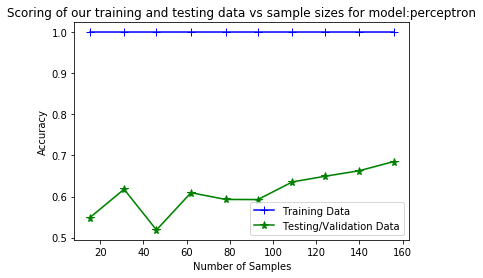

Confusion matrix, without normalization
[[14 13]
 [16 32]]


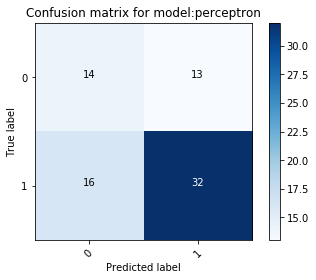

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.820234
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000019
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.7190563060128278
Code block 'training' took(HH:MM:SS): 0:00:00.209779
Code block 'testing' took(HH:MM:SS): 0:00:00.001024
F1 score 0.657751124437781
Classification report  
               precision    recall  f1-score   support

           0       0.52      0.59      0.55        27
           1       0.75      0.69      0.72        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.63      0.64      0.63        75
weighted avg       0.67      0.65      0.66        75



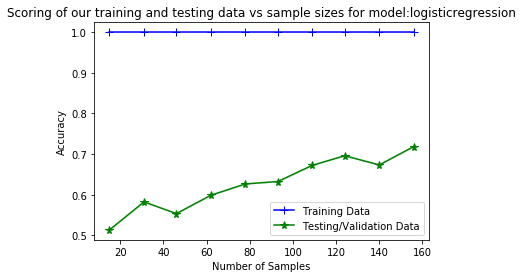

Confusion matrix, without normalization
[[16 11]
 [15 33]]


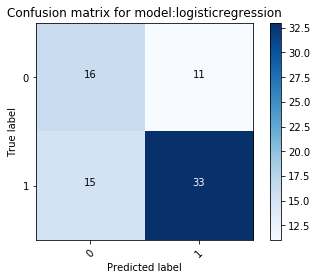

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.121277
inside decision function


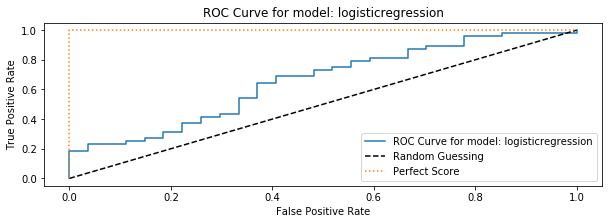

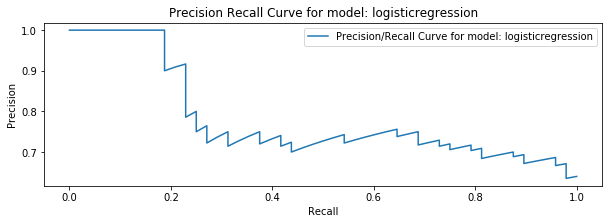

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.253314
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 8}
Grid Search Best score  0.6255128929041973
Code block 'training' took(HH:MM:SS): 0:00:00.770459
Code block 'testing' took(HH:MM:SS): 0:00:00.001469
F1 score 0.555307917888563
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.52      0.45        27
           1       0.68      0.56      0.61        48

   micro avg       0.55      0.55      0.55        75
   macro avg       0.54      0.54      0.53        75
weighted avg       0.58      0.55      0.56        75



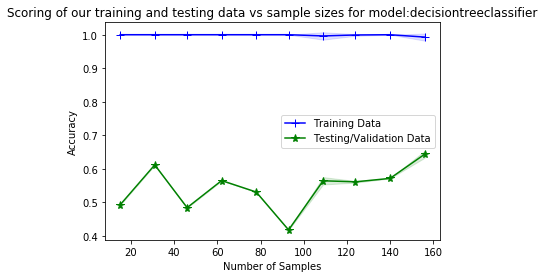

Confusion matrix, without normalization
[[14 13]
 [21 27]]


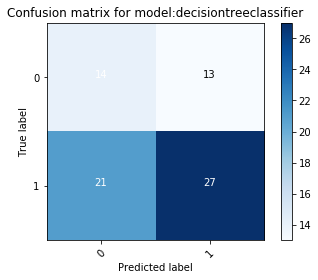

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.963821
inside decision function


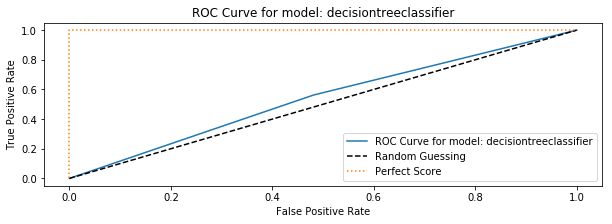

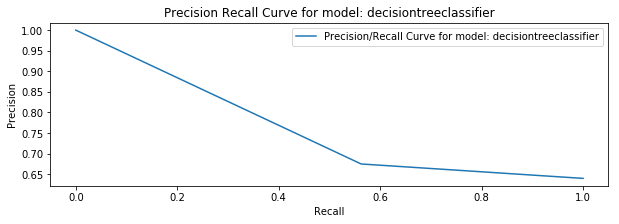

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.221747
Grid Search Best parameters  {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 12}
Grid Search Best score  0.5676403306838089
Code block 'training' took(HH:MM:SS): 0:00:00.621736
Code block 'testing' took(HH:MM:SS): 0:00:00.003187
F1 score 0.4402173440556401
Classification report  
               precision    recall  f1-score   support

           0       0.12      0.07      0.09        27
           1       0.58      0.71      0.64        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.35      0.39      0.36        75
weighted avg       0.41      0.48      0.44        75



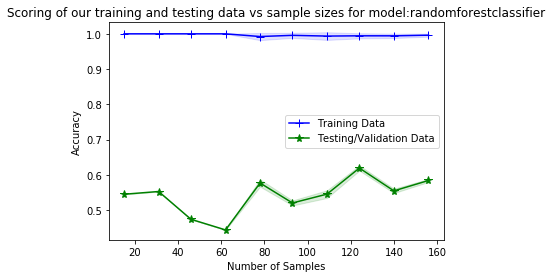

Confusion matrix, without normalization
[[ 2 25]
 [14 34]]


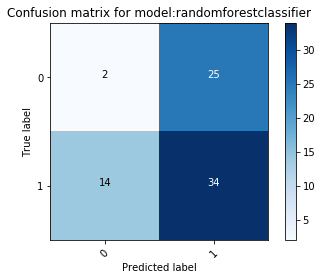

Code block 'learning_curve' took(HH:MM:SS): 0:00:02.333107
inside decision function


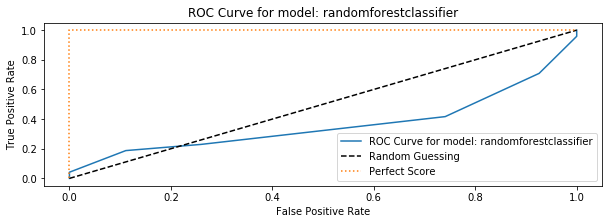

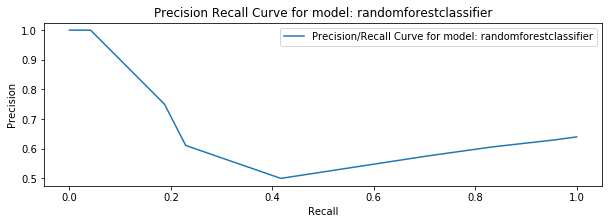

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.223809
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 10}
Grid Search Best score  0.5789101478231913
Code block 'training' took(HH:MM:SS): 0:00:00.330987
Code block 'testing' took(HH:MM:SS): 0:00:00.009229
F1 score 0.5928254796051406
Classification report  
               precision    recall  f1-score   support

           0       0.44      0.52      0.47        27
           1       0.70      0.62      0.66        48

   micro avg       0.59      0.59      0.59        75
   macro avg       0.57      0.57      0.57        75
weighted avg       0.60      0.59      0.59        75



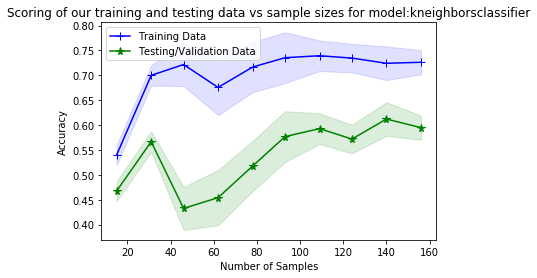

Confusion matrix, without normalization
[[14 13]
 [18 30]]


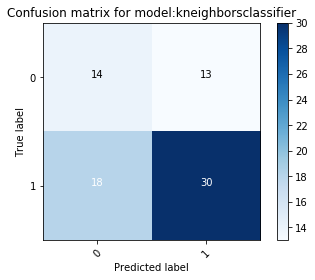

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.629775
inside decision function


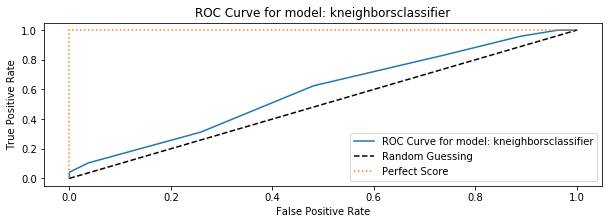

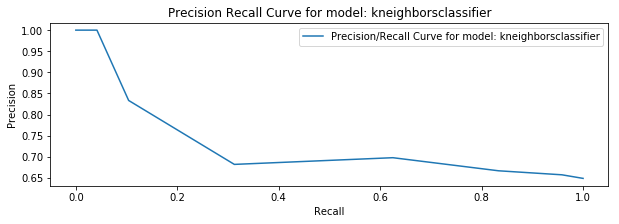

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.236874
Grid Search Best parameters  {'ridge__alpha': 1.2, 'ridge__max_iter': 100}
Grid Search Best score  0.6970543948804818
Code block 'training' took(HH:MM:SS): 0:00:00.416687
Code block 'testing' took(HH:MM:SS): 0:00:00.001052
F1 score 0.607624633431085
Classification report  
               precision    recall  f1-score   support

           0       0.46      0.59      0.52        27
           1       0.72      0.60      0.66        48

   micro avg       0.60      0.60      0.60        75
   macro avg       0.59      0.60      0.59        75
weighted avg       0.63      0.60      0.61        75



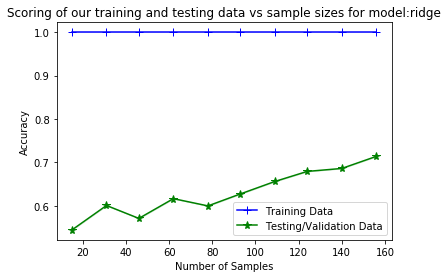

Confusion matrix, without normalization
[[16 11]
 [19 29]]


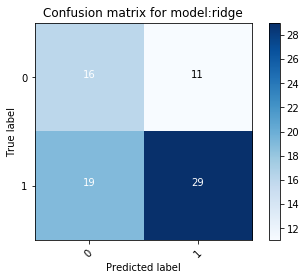

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.029719
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000013
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.7189378737204823
Code block 'training' took(HH:MM:SS): 0:00:00.128567
Code block 'testing' took(HH:MM:SS): 0:00:00.005711
F1 score 0.631424287856072
Classification report  
               precision    recall  f1-score   support

           0       0.48      0.56      0.52        27
           1       0.73      0.67      0.70        48

   micro avg       0.63      0.63      0.63        75
   macro avg       0.61      0.61      0.61        75
weighted avg       0.64      0.63      0.63        75



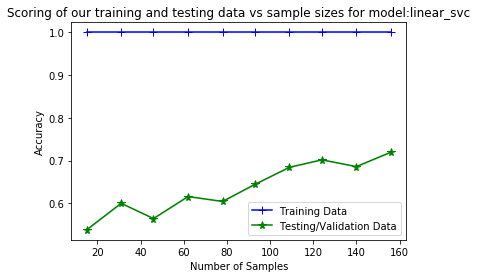

Confusion matrix, without normalization
[[15 12]
 [16 32]]


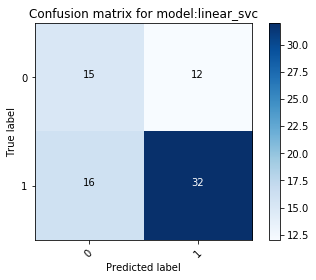

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.457859
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000028
Grid Search Best parameters  {'gamma_svc__C': 1, 'gamma_svc__gamma': 2}
Grid Search Best score  0.5
Code block 'training' took(HH:MM:SS): 0:00:00.558027
Code block 'testing' took(HH:MM:SS): 0:00:00.006651
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



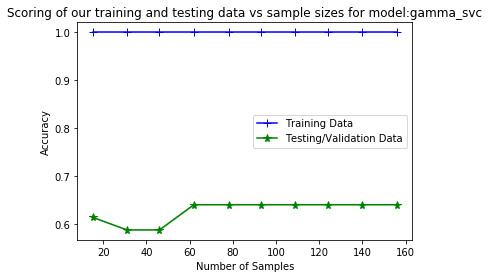

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


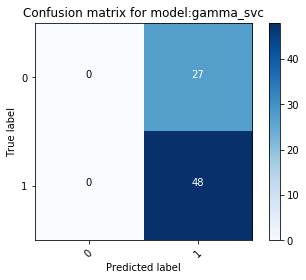

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.704874
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000033
Grid Search Best parameters  {'extra_trees__criterion': 'entropy', 'extra_trees__max_depth': 6}
Grid Search Best score  0.5468032691945736
Code block 'training' took(HH:MM:SS): 0:00:00.208880
Code block 'testing' took(HH:MM:SS): 0:00:00.000926
F1 score 0.48199043062200947
Classification report  
               precision    recall  f1-score   support

           0       0.29      0.30      0.29        27
           1       0.60      0.58      0.59        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.44      0.44      0.44        75
weighted avg       0.48      0.48      0.48        75



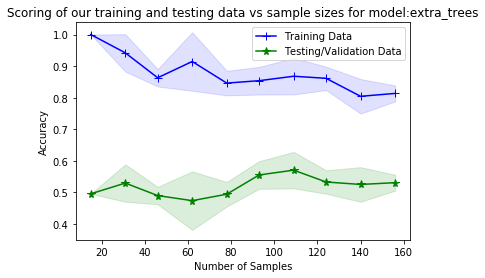

Confusion matrix, without normalization
[[ 8 19]
 [20 28]]


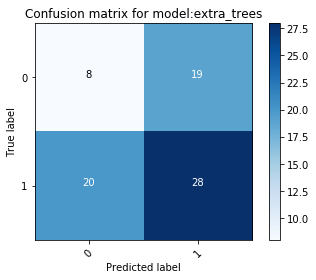

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.679987
inside decision function


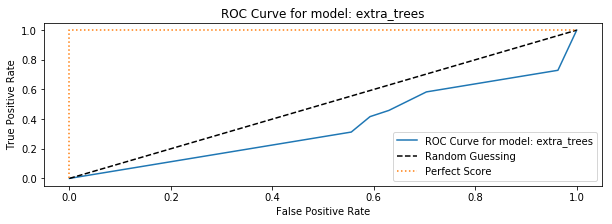

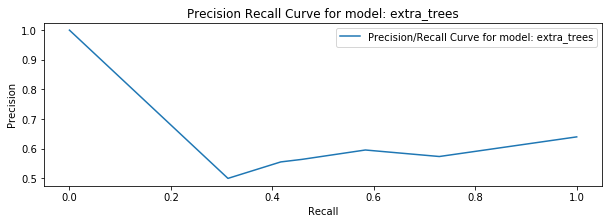

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.207130
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.5
Code block 'training' took(HH:MM:SS): 0:00:00.414773
Code block 'testing' took(HH:MM:SS): 0:00:00.006790
F1 score 0.5687601809954752
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.59      0.49        27
           1       0.70      0.54      0.61        48

   micro avg       0.56      0.56      0.56        75
   macro avg       0.56      0.57      0.55        75
weighted avg       0.60      0.56      0.57        75



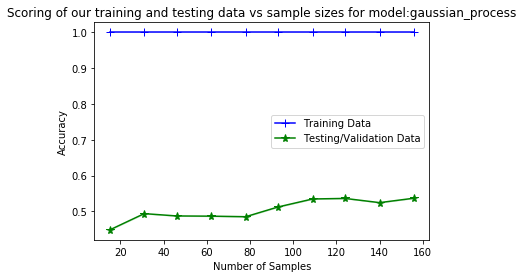

Confusion matrix, without normalization
[[16 11]
 [22 26]]


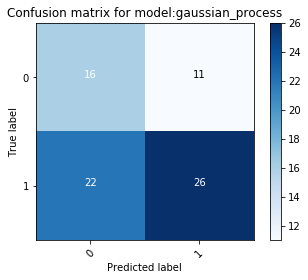

Code block 'learning_curve' took(HH:MM:SS): 0:00:02.001860
inside decision function


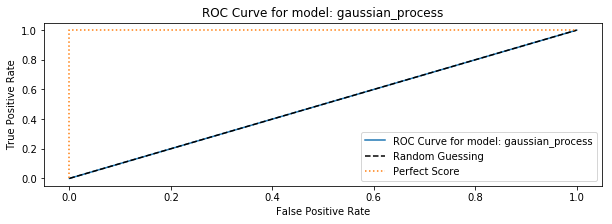

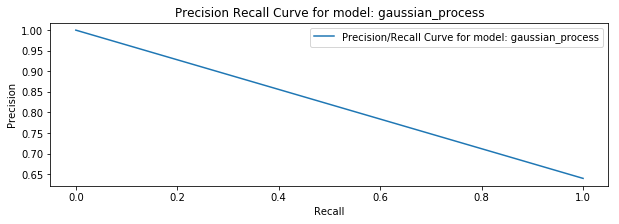

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.229007
Grid Search Best parameters  {'bernoulli__alpha': 0.2}
Grid Search Best score  0.6412833543268326
Code block 'training' took(HH:MM:SS): 0:00:00.134639
Code block 'testing' took(HH:MM:SS): 0:00:00.001066
F1 score 0.6
Classification report  
               precision    recall  f1-score   support

           0       0.44      0.44      0.44        27
           1       0.69      0.69      0.69        48

   micro avg       0.60      0.60      0.60        75
   macro avg       0.57      0.57      0.57        75
weighted avg       0.60      0.60      0.60        75



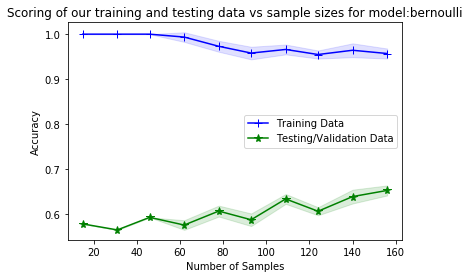

Confusion matrix, without normalization
[[12 15]
 [15 33]]


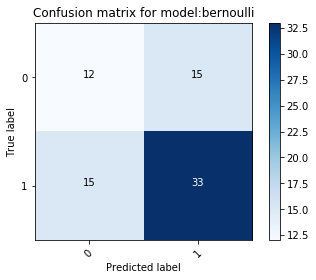

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.881955
inside decision function


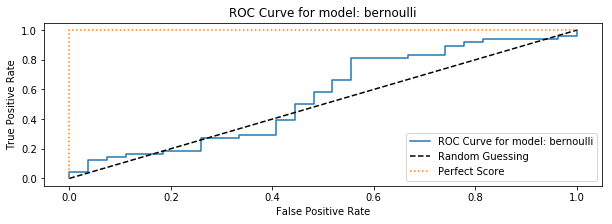

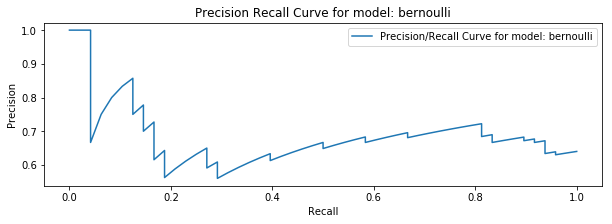

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.227935
Code block 'overalltime' took(HH:MM:SS): 0:00:21.309606
21309.606135802762


In [19]:
response = execute(
        x_train,
        y_train,
        x_test,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=StandardScaler())

In [21]:
results = panda.DataFrame(response).transpose()
results.head()
results[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
logisticregression,0.657751,0.634558,0.653333,1121.28,0.654321,1.024,209.779
kneighborsclassifier,0.592825,0.566958,0.586667,1629.78,0.584491,9.22908,330.987
bernoulli,0.6,0.565972,0.6,881.955,0.552469,1.06553,134.639
decisiontreeclassifier,0.555308,0.532625,0.546667,1963.82,0.540509,1.46944,770.459
gaussian_process,0.56876,0.552036,0.56,2001.86,0.5,6.79025,414.773
randomforestclassifier,0.440217,0.364269,0.48,2333.11,0.364969,3.18748,621.736
extra_trees,0.48199,0.440191,0.48,679.987,0.357253,0.925581,208.88
perceptron,0.617272,0.5897,0.613333,820.234,0,1.30389,164.359
ridge,0.607625,0.58761,0.6,1029.72,0,1.05187,416.687
linear_svc,0.631424,0.606447,0.626667,1457.86,0,5.7105,128.567


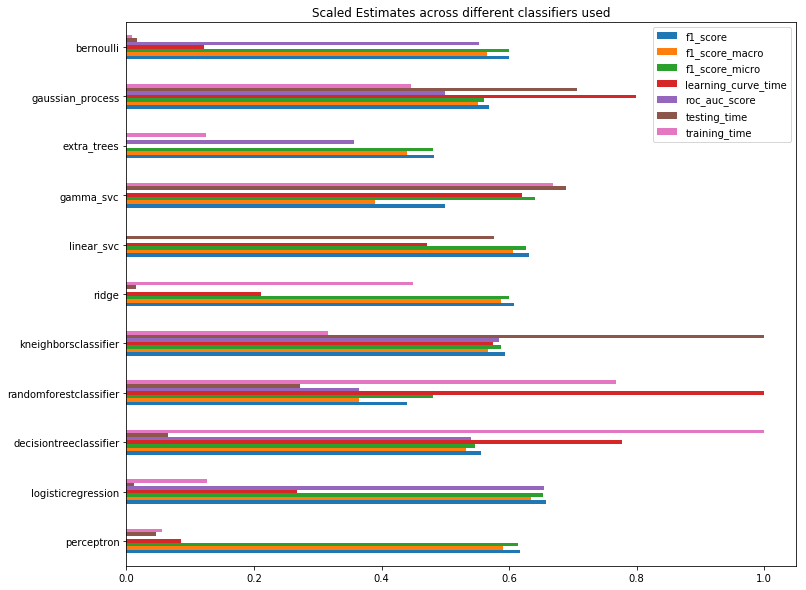

In [22]:
results['learning_curve_time'] = results['learning_curve_time'].astype('float64')
results['testing_time'] = results['testing_time'].astype('float64')
results['training_time'] = results['training_time'].astype('float64')
results['f1_score'] = results['f1_score'].astype('float64')
results['f1_score_micro'] = results['f1_score_micro'].astype('float64')
results['f1_score_macro'] = results['f1_score_macro'].astype('float64')
results['roc_auc_score'] = results['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results['learning_curve_time'] = (results['learning_curve_time']- results['learning_curve_time'].min())/(results['learning_curve_time'].max()- results['learning_curve_time'].min())
results['testing_time'] = (results['testing_time']- results['testing_time'].min())/(results['testing_time'].max()- results['testing_time'].min())
results['training_time'] = (results['training_time']- results['training_time'].min())/(results['training_time'].max()- results['training_time'].min())

results.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

#### Conclusions:

##### 1. almost all our models are performing very poorly.
##### 2. almost all our models are overfitting.
##### 3. ROC-AUC score are barely above the random guessing line , with many models performing as badly as random guessing
##### 4. If we still have to select one, out of the higher performing logistic regression and kneighborclassifier, we will select kneighbor classifier since overfitting trend is less 


<br>

#### Lets try dimensionality reduction techniques one by one and apply the same models as above

### PCA

In [23]:
def plot_variance_scree_plot(variance, cumulative_variance,n_components_ , title = 'Principal Component vs Explained Ratio'):
    with plot.style.context('seaborn-whitegrid'):
        plot.figure(figsize=(10, 5))

        plot.bar(range(1,n_components_ ), variance, alpha=0.8, align='center',
                label='individual explained variance', color = 'teal') ## since there are 13 dimenison
        plot.step(range(1,n_components_ ), cumulative_variance, where='mid',
                 label='cumulative explained variance', color ='red')
        plot.plot(variance, color = 'black', label = 'Scree')
        plot.ylabel('Explained variance ratio')
        plot.xlabel('Principal components')
        plot.legend(loc='best')
        plot.tight_layout()
        plot.title(title)
        plot.show()

In [24]:
scaler = StandardScaler()
x_train_std = scaler.fit_transform(x_train)
x_test_std = scaler.fit_transform(x_test)


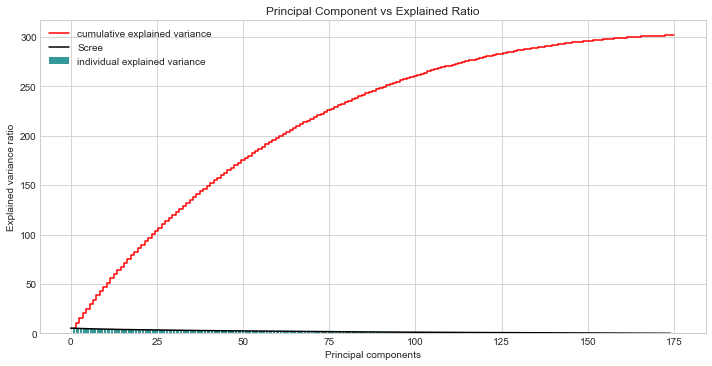

In [25]:

pca = PCA()
x_train_pca1 = pca.fit_transform(x_train_std)

x_test_pca1 = pca.transform(x_test_std)

plot_variance_scree_plot(pca.explained_variance_ ,np.cumsum(pca.explained_variance_),pca.n_components_ +1 )


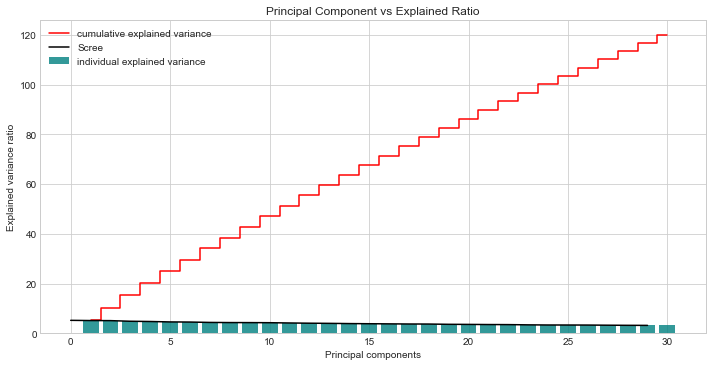

In [26]:

pca = PCA(n_components=30)
x_train_pca1 = pca.fit_transform(x_train_std)

x_test_pca1 = pca.transform(x_test_std)

plot_variance_scree_plot(pca.explained_variance_ ,np.cumsum(pca.explained_variance_),pca.n_components_ +1 )


Hardly any axis defines variance more than 10% which is disappointing. Still lets go ahead and compare our model

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 30}
Grid Search Best score  0.6630120604033648
Code block 'training' took(HH:MM:SS): 0:00:00.071948
Code block 'testing' took(HH:MM:SS): 0:00:00.000539
F1 score 0.565100485100485
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.19      0.26        27
           1       0.65      0.85      0.74        48

   micro avg       0.61      0.61      0.61        75
   macro avg       0.53      0.52      0.50        75
weighted avg       0.57      0.61      0.57        75



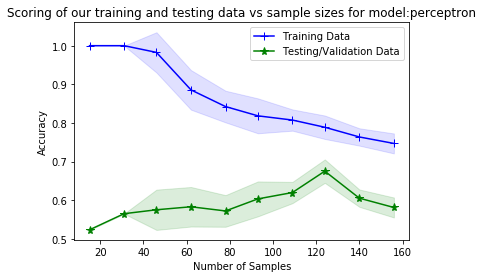

Confusion matrix, without normalization
[[ 5 22]
 [ 7 41]]


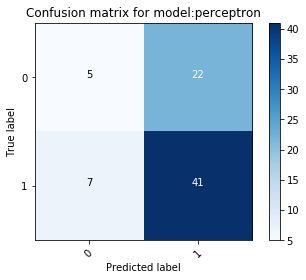

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.456535
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000018
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.6768509751118447
Code block 'training' took(HH:MM:SS): 0:00:00.083307
Code block 'testing' took(HH:MM:SS): 0:00:00.000352
F1 score 0.5747368421052632
Classification report  
               precision    recall  f1-score   support

           0       0.45      0.19      0.26        27
           1       0.66      0.88      0.75        48

   micro avg       0.63      0.63      0.63        75
   macro avg       0.56      0.53      0.51        75
weighted avg       0.58      0.63      0.57        75



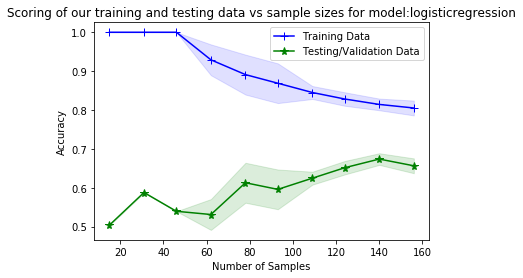

Confusion matrix, without normalization
[[ 5 22]
 [ 6 42]]


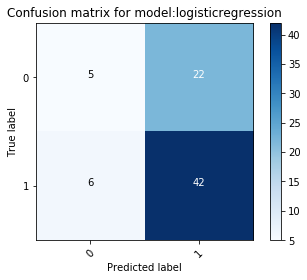

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.510562
inside decision function


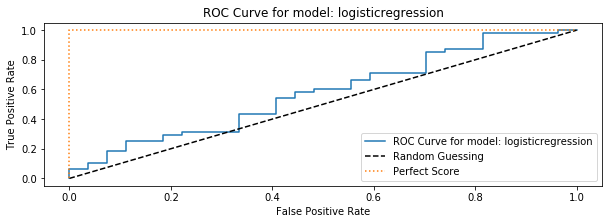

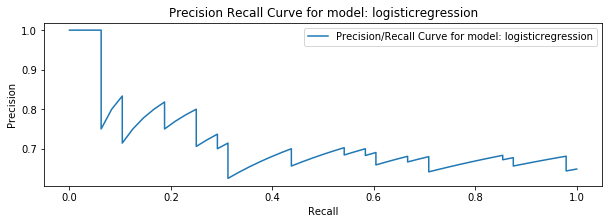

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.236530
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 6}
Grid Search Best score  0.567406578928318
Code block 'training' took(HH:MM:SS): 0:00:00.160016
Code block 'testing' took(HH:MM:SS): 0:00:00.000716
F1 score 0.5806020066889632
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.30      0.35        27
           1       0.66      0.77      0.71        48

   micro avg       0.60      0.60      0.60        75
   macro avg       0.54      0.53      0.53        75
weighted avg       0.57      0.60      0.58        75



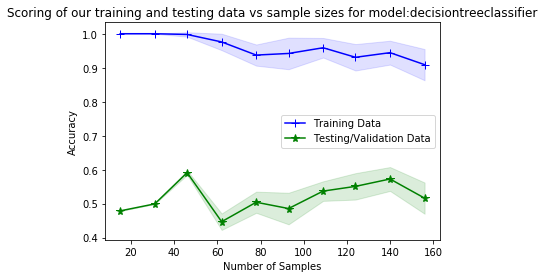

Confusion matrix, without normalization
[[ 8 19]
 [11 37]]


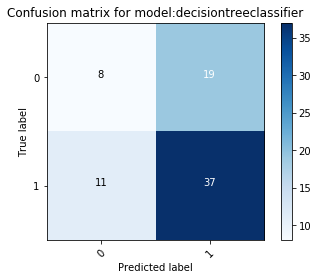

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.549368
inside decision function


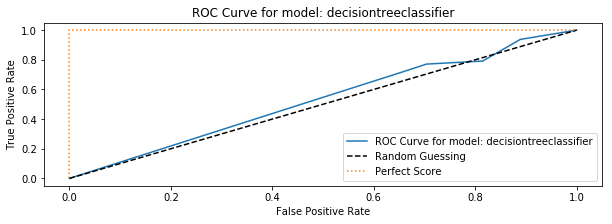

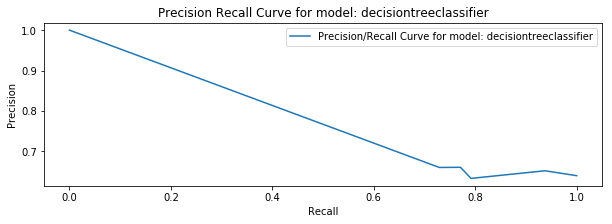

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.273701
Grid Search Best parameters  {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 12}
Grid Search Best score  0.5985665783491869
Code block 'training' took(HH:MM:SS): 0:00:00.358906
Code block 'testing' took(HH:MM:SS): 0:00:00.002091
F1 score 0.551025641025641
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.70      0.53        27
           1       0.73      0.46      0.56        48

   micro avg       0.55      0.55      0.55        75
   macro avg       0.58      0.58      0.55        75
weighted avg       0.62      0.55      0.55        75



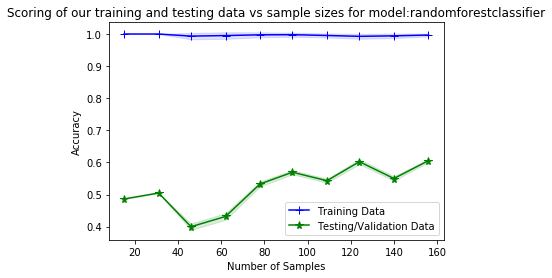

Confusion matrix, without normalization
[[19  8]
 [26 22]]


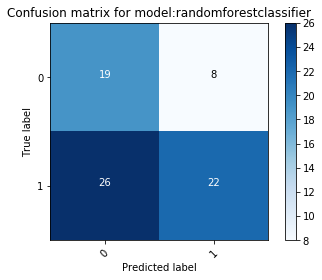

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.493397
inside decision function


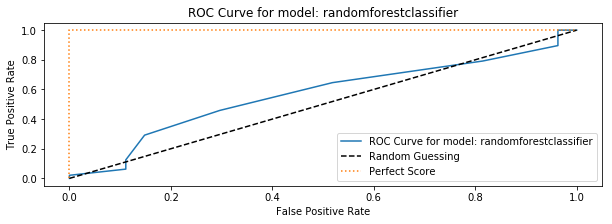

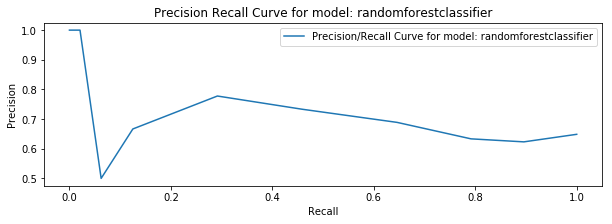

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.233842
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 4}
Grid Search Best score  0.5756933646064081
Code block 'training' took(HH:MM:SS): 0:00:00.096561
Code block 'testing' took(HH:MM:SS): 0:00:00.001529
F1 score 0.3507413695529146
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.93      0.54        27
           1       0.78      0.15      0.25        48

   micro avg       0.43      0.43      0.43        75
   macro avg       0.58      0.54      0.39        75
weighted avg       0.63      0.43      0.35        75



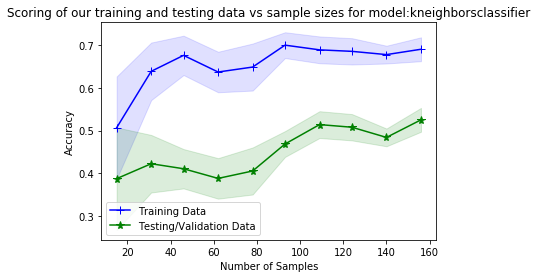

Confusion matrix, without normalization
[[25  2]
 [41  7]]


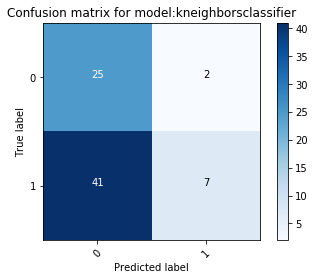

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.623279
inside decision function


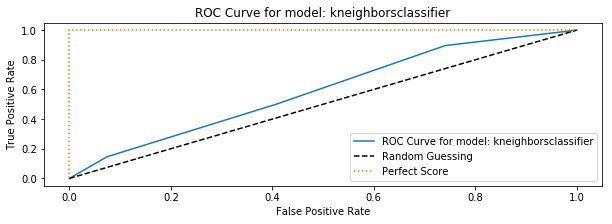

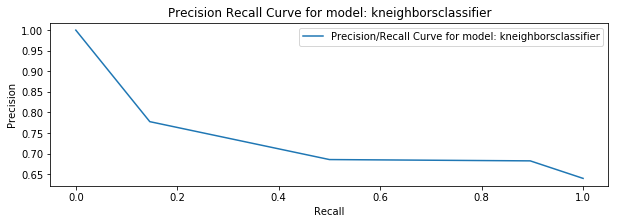

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.254004
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.6769242351851048
Code block 'training' took(HH:MM:SS): 0:00:00.192736
Code block 'testing' took(HH:MM:SS): 0:00:00.000189
F1 score 0.5843769433149965
Classification report  
               precision    recall  f1-score   support

           0       0.50      0.19      0.27        27
           1       0.66      0.90      0.76        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.58      0.54      0.52        75
weighted avg       0.60      0.64      0.58        75



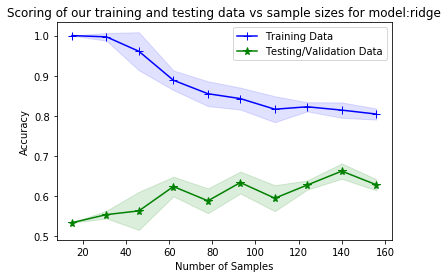

Confusion matrix, without normalization
[[ 5 22]
 [ 5 43]]


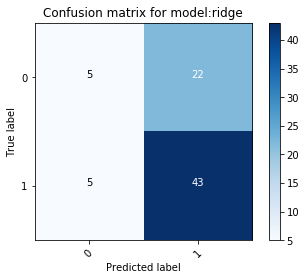

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.523666
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000018
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.6838974069408852
Code block 'training' took(HH:MM:SS): 0:00:00.033234
Code block 'testing' took(HH:MM:SS): 0:00:00.000475
F1 score 0.5493333333333333
Classification report  
               precision    recall  f1-score   support

           0       0.67      0.07      0.13        27
           1       0.65      0.98      0.78        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.66      0.53      0.46        75
weighted avg       0.66      0.65      0.55        75



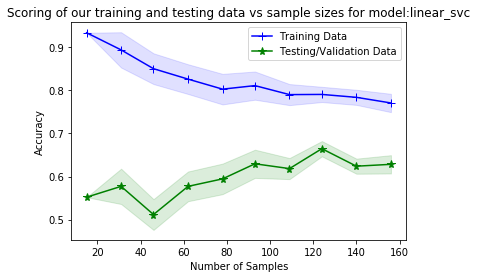

Confusion matrix, without normalization
[[ 2 25]
 [ 1 47]]


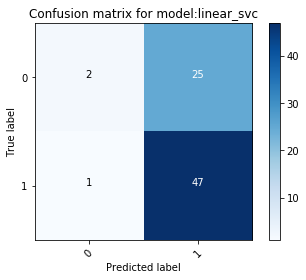

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.441276
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000031
Grid Search Best parameters  {'gamma_svc__C': 1, 'gamma_svc__gamma': 2}
Grid Search Best score  0.5
Code block 'training' took(HH:MM:SS): 0:00:00.119154
Code block 'testing' took(HH:MM:SS): 0:00:00.001360
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



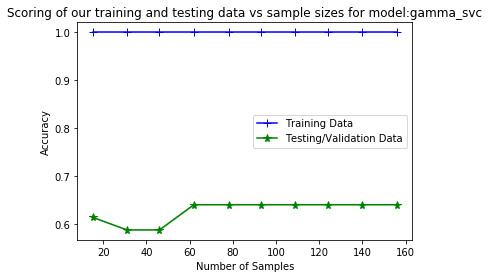

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


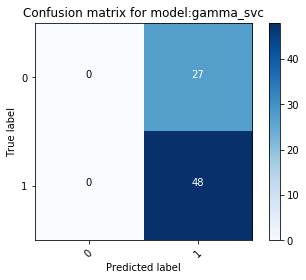

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.501005
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000040
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 6}
Grid Search Best score  0.5558124484211441
Code block 'training' took(HH:MM:SS): 0:00:00.107476
Code block 'testing' took(HH:MM:SS): 0:00:00.000572
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



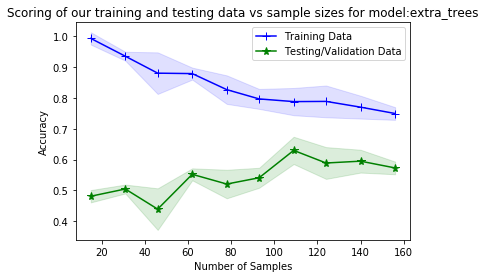

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


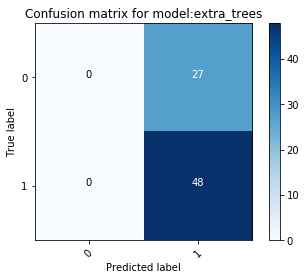

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.409868
inside decision function


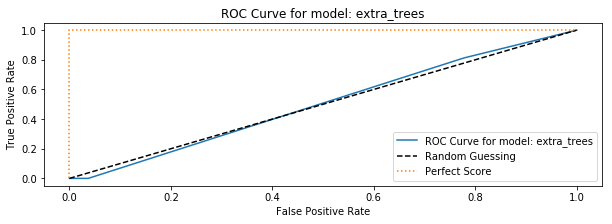

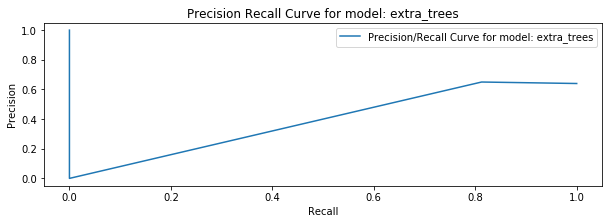

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.216480
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.5316169337908468
Code block 'training' took(HH:MM:SS): 0:00:00.150183
Code block 'testing' took(HH:MM:SS): 0:00:00.000936
F1 score 0.4203156384505021
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.74      0.49        27
           1       0.65      0.27      0.38        48

   micro avg       0.44      0.44      0.44        75
   macro avg       0.51      0.51      0.44        75
weighted avg       0.55      0.44      0.42        75



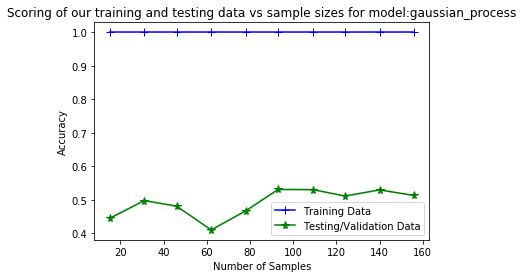

Confusion matrix, without normalization
[[20  7]
 [35 13]]


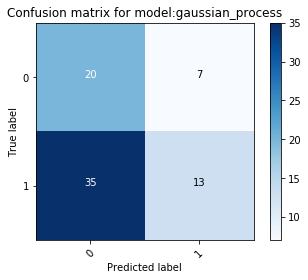

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.983421
inside decision function


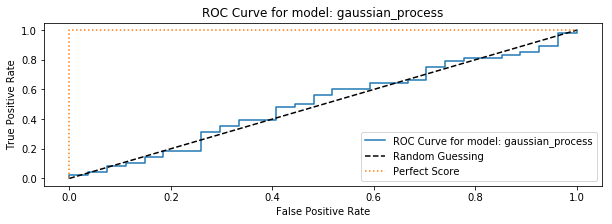

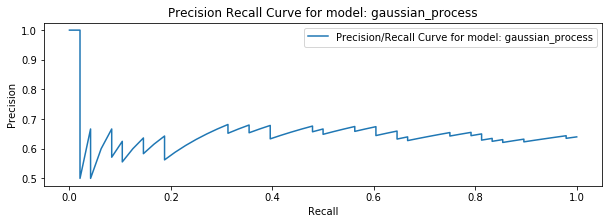

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.268522
Grid Search Best parameters  {'bernoulli__alpha': 0.6}
Grid Search Best score  0.5784603801995106
Code block 'training' took(HH:MM:SS): 0:00:00.069243
Code block 'testing' took(HH:MM:SS): 0:00:00.000507
F1 score 0.6302915951972556
Classification report  
               precision    recall  f1-score   support

           0       0.53      0.33      0.41        27
           1       0.69      0.83      0.75        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.61      0.58      0.58        75
weighted avg       0.63      0.65      0.63        75



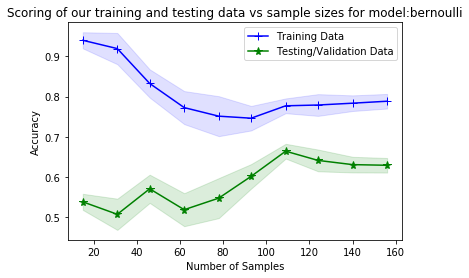

Confusion matrix, without normalization
[[ 9 18]
 [ 8 40]]


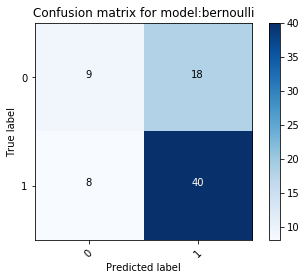

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.431615
inside decision function


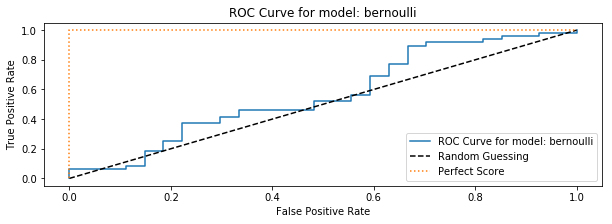

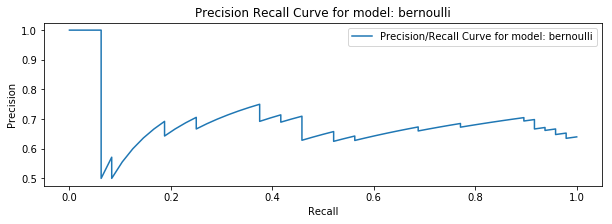

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.213934
Code block 'overalltime' took(HH:MM:SS): 0:00:10.141824
10141.823878976964


In [27]:
response = execute(
        x_train_pca1,
        y_train,
        x_test_pca1,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=StandardScaler())

In [28]:
results = panda.DataFrame(response).transpose()
results.head()
results[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
kneighborsclassifier,0.350741,0.391624,0.426667,623.279,0.591435,1.5286,96.5608
logisticregression,0.574737,0.506579,0.626667,510.562,0.577932,0.351573,83.3074
randomforestclassifier,0.551026,0.54594,0.546667,1493.4,0.565586,2.09066,358.906
bernoulli,0.630292,0.581904,0.653333,431.615,0.564043,0.507448,69.2428
decisiontreeclassifier,0.580602,0.529682,0.6,549.368,0.529321,0.71623,160.016
gaussian_process,0.420316,0.435079,0.44,983.421,0.506173,0.93639,150.183
extra_trees,0.499512,0.390244,0.64,409.868,0.502315,0.571733,107.476
perceptron,0.5651,0.497574,0.613333,456.535,0,0.538737,71.9485
ridge,0.584377,0.515666,0.64,523.666,0,0.18944,192.736
linear_svc,0.549333,0.458333,0.653333,441.276,0,0.475022,33.2345


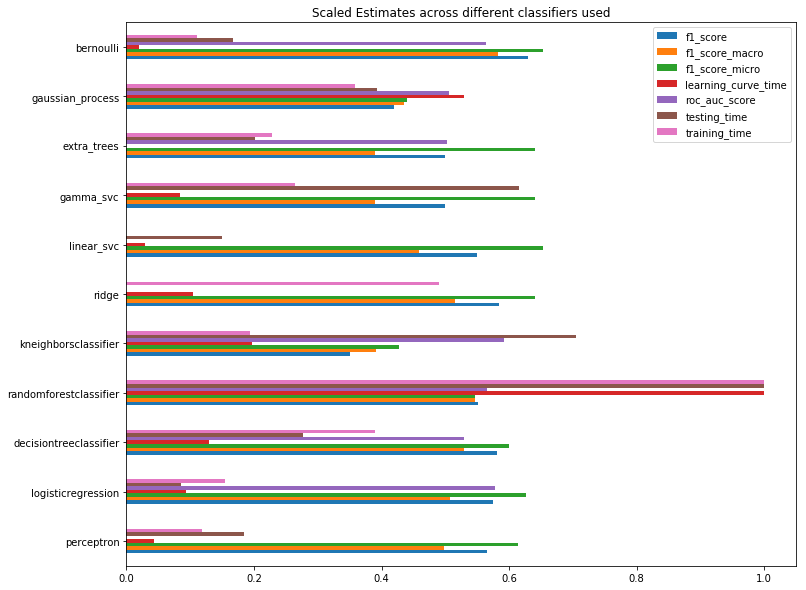

In [29]:
results['learning_curve_time'] = results['learning_curve_time'].astype('float64')
results['testing_time'] = results['testing_time'].astype('float64')
results['training_time'] = results['training_time'].astype('float64')
results['f1_score'] = results['f1_score'].astype('float64')
results['f1_score_micro'] = results['f1_score_micro'].astype('float64')
results['f1_score_macro'] = results['f1_score_macro'].astype('float64')
results['roc_auc_score'] = results['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results['learning_curve_time'] = (results['learning_curve_time']- results['learning_curve_time'].min())/(results['learning_curve_time'].max()- results['learning_curve_time'].min())
results['testing_time'] = (results['testing_time']- results['testing_time'].min())/(results['testing_time'].max()- results['testing_time'].min())
results['training_time'] = (results['training_time']- results['training_time'].min())/(results['training_time'].max()- results['training_time'].min())

results.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

### LDA

In [30]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train_std, y_train)
x_train_lda = lda.transform(x_train_std)
x_test_lda = lda.transform(x_test_std)


Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 5}
Grid Search Best score  0.9711744776962167
Code block 'training' took(HH:MM:SS): 0:00:00.076380
Code block 'testing' took(HH:MM:SS): 0:00:00.000181
F1 score 0.5293506493506493
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.56      0.45        27
           1       0.67      0.50      0.57        48

   micro avg       0.52      0.52      0.52        75
   macro avg       0.53      0.53      0.51        75
weighted avg       0.57      0.52      0.53        75



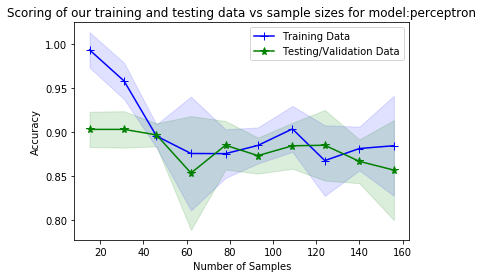

Confusion matrix, without normalization
[[15 12]
 [24 24]]


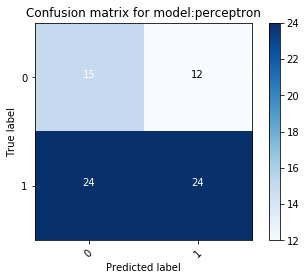

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.438124
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000026
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.9711744776962167
Code block 'training' took(HH:MM:SS): 0:00:00.051461
Code block 'testing' took(HH:MM:SS): 0:00:00.000175
F1 score 0.558117097840887
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.37      0.38        27
           1       0.65      0.67      0.66        48

   micro avg       0.56      0.56      0.56        75
   macro avg       0.52      0.52      0.52        75
weighted avg       0.56      0.56      0.56        75



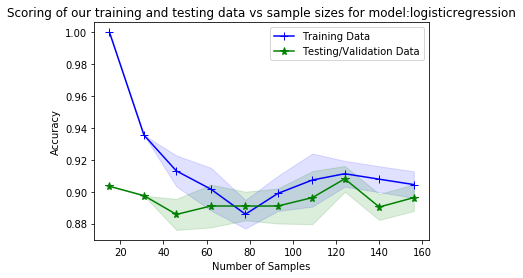

Confusion matrix, without normalization
[[10 17]
 [16 32]]


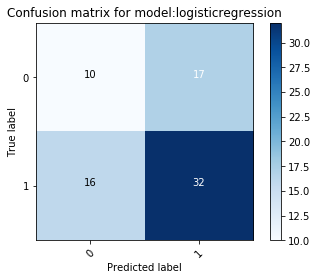

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.465800
inside decision function


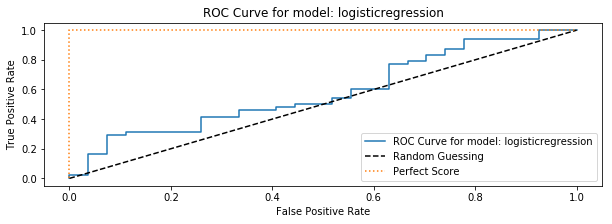

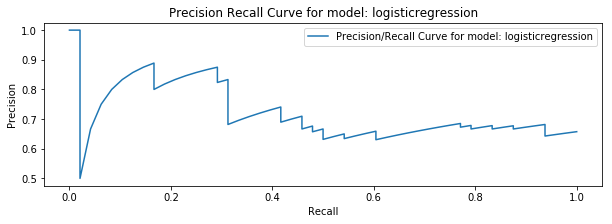

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.239718
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 6}
Grid Search Best score  0.9039768202811682
Code block 'training' took(HH:MM:SS): 0:00:00.096374
Code block 'testing' took(HH:MM:SS): 0:00:00.000154
F1 score 0.5976781656682504
Classification report  
               precision    recall  f1-score   support

           0       0.45      0.33      0.38        27
           1       0.67      0.77      0.72        48

   micro avg       0.61      0.61      0.61        75
   macro avg       0.56      0.55      0.55        75
weighted avg       0.59      0.61      0.60        75



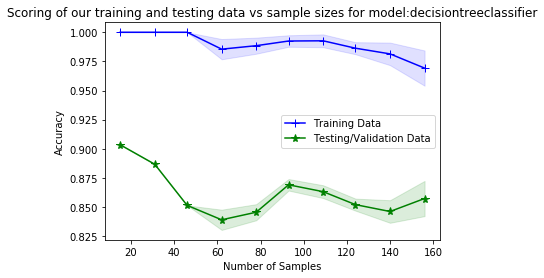

Confusion matrix, without normalization
[[ 9 18]
 [11 37]]


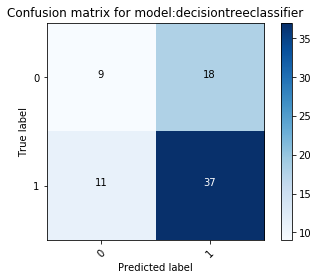

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.403682
inside decision function


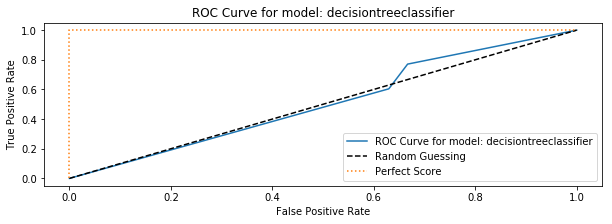

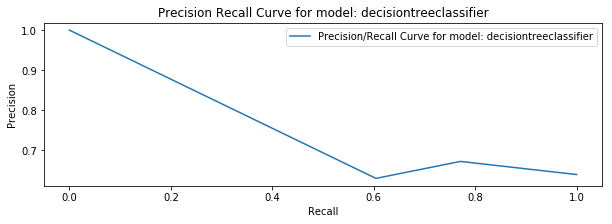

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.216981
Grid Search Best parameters  {'randomforestclassifier__criterion': 'gini', 'randomforestclassifier__n_estimators': 8}
Grid Search Best score  0.9345044810262201
Code block 'training' took(HH:MM:SS): 0:00:00.296335
Code block 'testing' took(HH:MM:SS): 0:00:00.000829
F1 score 0.5648
Classification report  
               precision    recall  f1-score   support

           0       0.39      0.33      0.36        27
           1       0.65      0.71      0.68        48

   micro avg       0.57      0.57      0.57        75
   macro avg       0.52      0.52      0.52        75
weighted avg       0.56      0.57      0.56        75



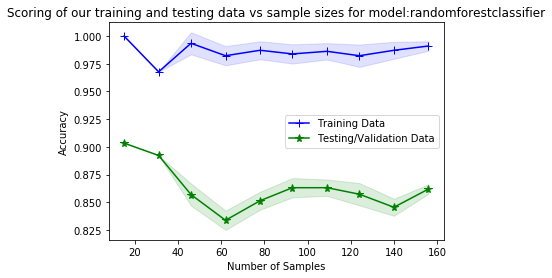

Confusion matrix, without normalization
[[ 9 18]
 [14 34]]


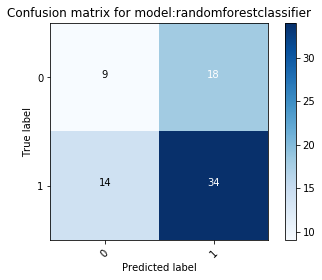

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.014950
inside decision function


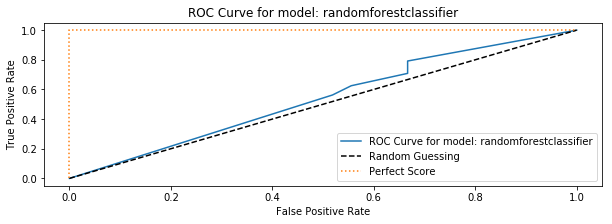

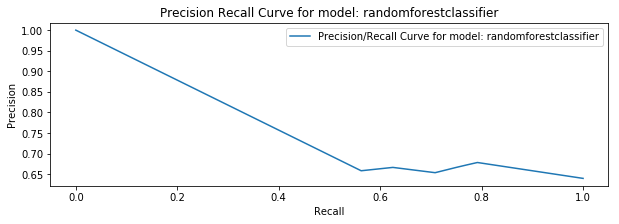

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.259843
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 6}
Grid Search Best score  0.959375479592871
Code block 'training' took(HH:MM:SS): 0:00:00.069110
Code block 'testing' took(HH:MM:SS): 0:00:00.000975
F1 score 0.6
Classification report  
               precision    recall  f1-score   support

           0       0.44      0.44      0.44        27
           1       0.69      0.69      0.69        48

   micro avg       0.60      0.60      0.60        75
   macro avg       0.57      0.57      0.57        75
weighted avg       0.60      0.60      0.60        75



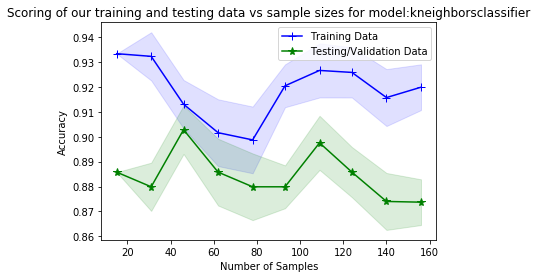

Confusion matrix, without normalization
[[12 15]
 [15 33]]


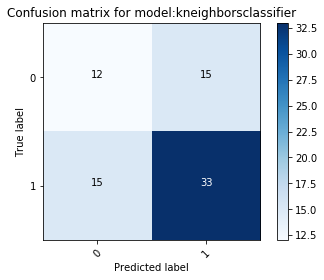

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.544546
inside decision function


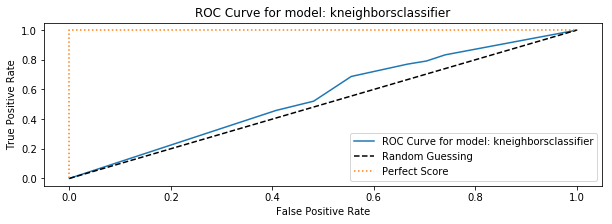

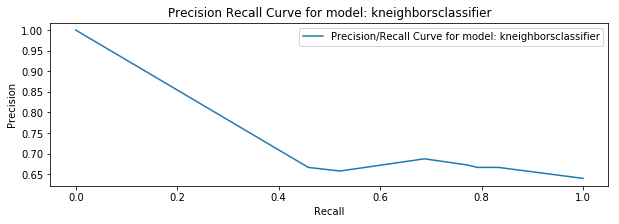

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.230337
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.9711744776962167
Code block 'training' took(HH:MM:SS): 0:00:00.161316
Code block 'testing' took(HH:MM:SS): 0:00:00.000146
F1 score 0.558117097840887
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.37      0.38        27
           1       0.65      0.67      0.66        48

   micro avg       0.56      0.56      0.56        75
   macro avg       0.52      0.52      0.52        75
weighted avg       0.56      0.56      0.56        75



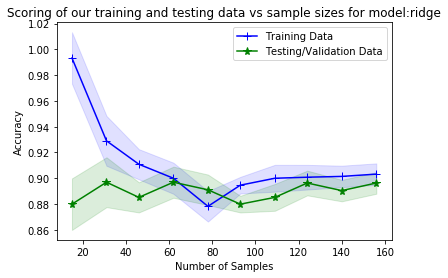

Confusion matrix, without normalization
[[10 17]
 [16 32]]


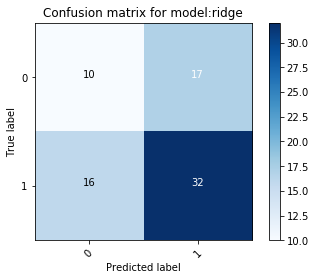

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.450164
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000021
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.9711744776962167
Code block 'training' took(HH:MM:SS): 0:00:00.027096
Code block 'testing' took(HH:MM:SS): 0:00:00.000573
F1 score 0.5919999999999999
Classification report  
               precision    recall  f1-score   support

           0       0.43      0.37      0.40        27
           1       0.67      0.73      0.70        48

   micro avg       0.60      0.60      0.60        75
   macro avg       0.55      0.55      0.55        75
weighted avg       0.59      0.60      0.59        75



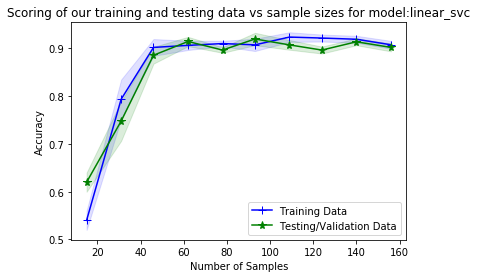

Confusion matrix, without normalization
[[10 17]
 [13 35]]


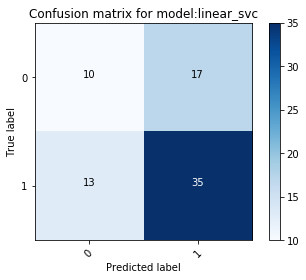

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.392538
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000017
Grid Search Best parameters  {'gamma_svc__C': 5, 'gamma_svc__gamma': 2}
Grid Search Best score  0.9421993948080906
Code block 'training' took(HH:MM:SS): 0:00:00.082096
Code block 'testing' took(HH:MM:SS): 0:00:00.000349
F1 score 0.5807724301841949
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.37      0.39        27
           1       0.67      0.71      0.69        48

   micro avg       0.59      0.59      0.59        75
   macro avg       0.54      0.54      0.54        75
weighted avg       0.58      0.59      0.58        75



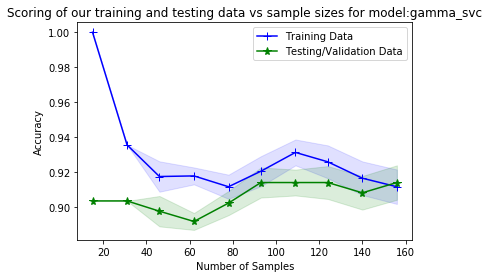

Confusion matrix, without normalization
[[10 17]
 [14 34]]


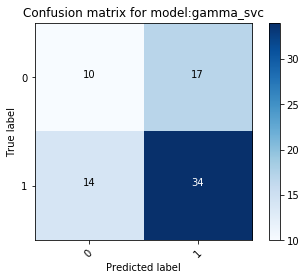

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.397981
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000020
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 6}
Grid Search Best score  0.9290227164140208
Code block 'training' took(HH:MM:SS): 0:00:00.101980
Code block 'testing' took(HH:MM:SS): 0:00:00.000216
F1 score 0.5848978797899241
Classification report  
               precision    recall  f1-score   support

           0       0.42      0.41      0.42        27
           1       0.67      0.69      0.68        48

   micro avg       0.59      0.59      0.59        75
   macro avg       0.55      0.55      0.55        75
weighted avg       0.58      0.59      0.58        75



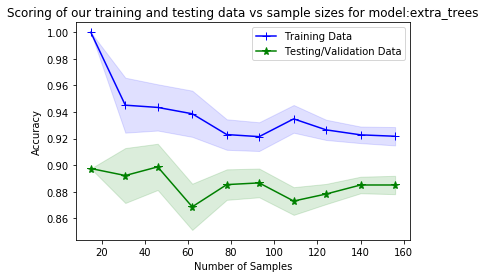

Confusion matrix, without normalization
[[11 16]
 [15 33]]


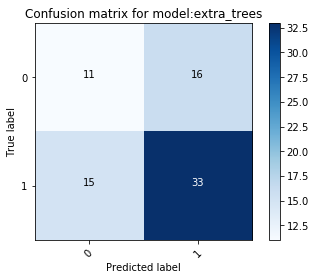

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.387701
inside decision function


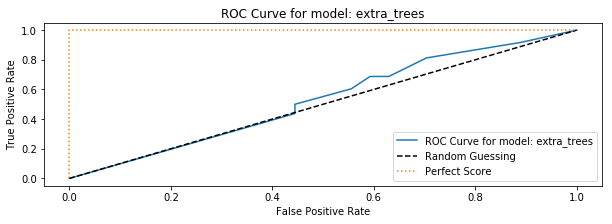

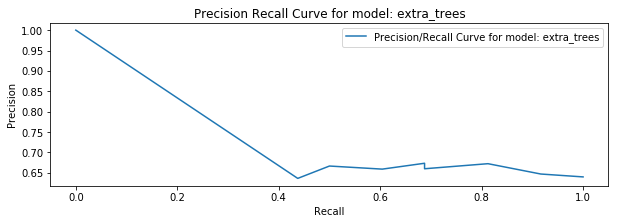

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.280021
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.9704864700516875
Code block 'training' took(HH:MM:SS): 0:00:00.158324
Code block 'testing' took(HH:MM:SS): 0:00:00.000381
F1 score 0.558117097840887
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.37      0.38        27
           1       0.65      0.67      0.66        48

   micro avg       0.56      0.56      0.56        75
   macro avg       0.52      0.52      0.52        75
weighted avg       0.56      0.56      0.56        75



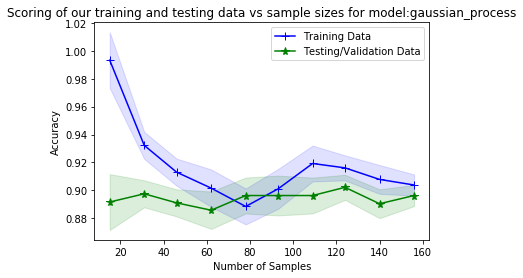

Confusion matrix, without normalization
[[10 17]
 [16 32]]


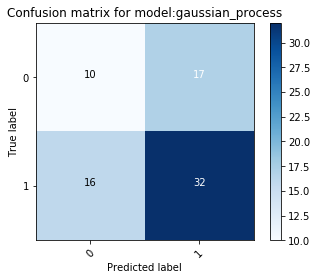

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.909769
inside decision function


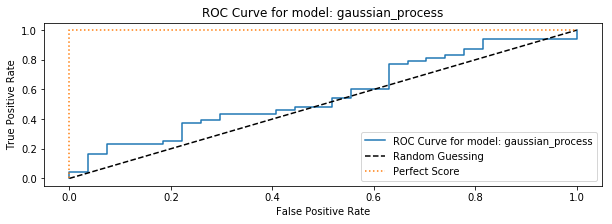

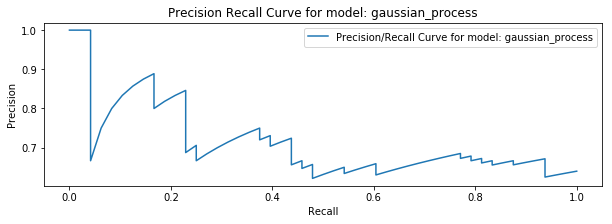

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.253117
Grid Search Best parameters  {'bernoulli__alpha': 0.2}
Grid Search Best score  0.8865242004372439
Code block 'training' took(HH:MM:SS): 0:00:00.063525
Code block 'testing' took(HH:MM:SS): 0:00:00.000254
F1 score 0.5293506493506493
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.56      0.45        27
           1       0.67      0.50      0.57        48

   micro avg       0.52      0.52      0.52        75
   macro avg       0.53      0.53      0.51        75
weighted avg       0.57      0.52      0.53        75



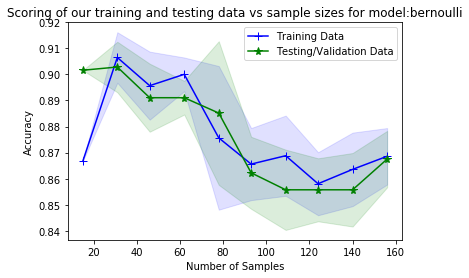

Confusion matrix, without normalization
[[15 12]
 [24 24]]


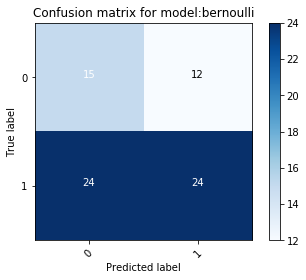

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.479081
inside decision function


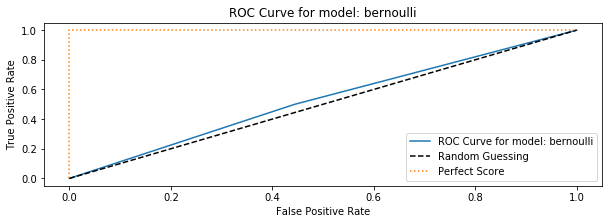

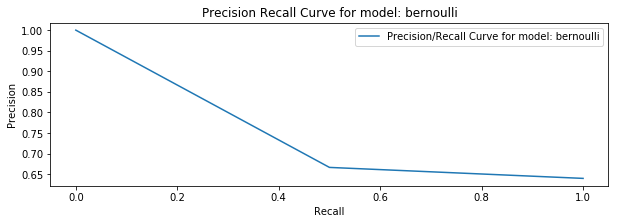

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.227134
Code block 'overalltime' took(HH:MM:SS): 0:00:08.846825
8846.825090709217


In [31]:
response = execute(
        x_train_lda,
        y_train,
        x_test_lda,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=StandardScaler())

In [32]:
results = panda.DataFrame(response).transpose()
results.head()
results[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
logisticregression,0.558117,0.518576,0.56,465.8,0.582562,0.174649,51.4611
gaussian_process,0.558117,0.518576,0.56,909.769,0.561728,0.381155,158.324
kneighborsclassifier,0.6,0.565972,0.6,544.546,0.552083,0.975075,69.1097
randomforestclassifier,0.5648,0.52,0.573333,1014.95,0.540509,0.829439,296.335
extra_trees,0.584898,0.547753,0.586667,387.701,0.530093,0.215609,101.98
bernoulli,0.529351,0.512987,0.52,479.081,0.527778,0.253724,63.5249
decisiontreeclassifier,0.597678,0.550713,0.613333,403.682,0.510802,0.1536,96.3737
perceptron,0.529351,0.512987,0.52,438.124,0,0.180907,76.3795
ridge,0.558117,0.518576,0.56,450.164,0,0.146204,161.316
linear_svc,0.592,0.55,0.6,392.538,0,0.57344,27.0962


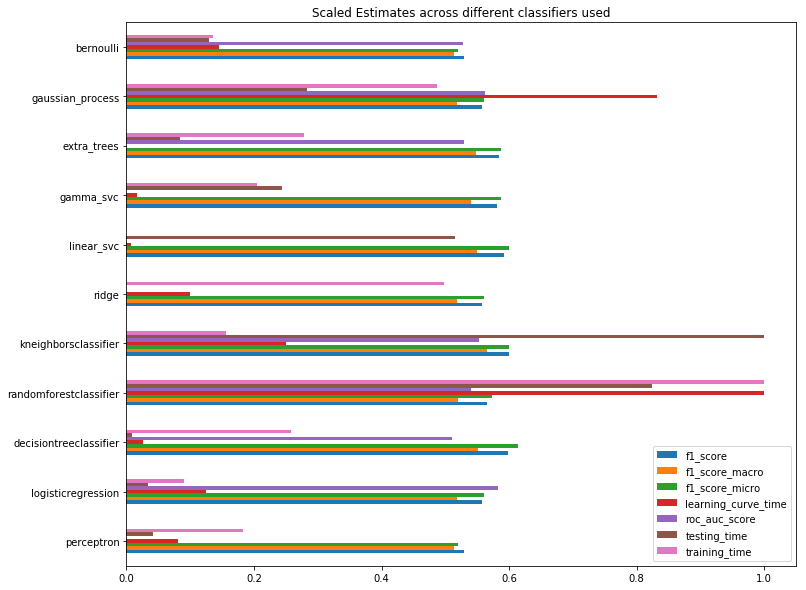

In [35]:
results['learning_curve_time'] = results['learning_curve_time'].astype('float64')
results['testing_time'] = results['testing_time'].astype('float64')
results['training_time'] = results['training_time'].astype('float64')
results['f1_score'] = results['f1_score'].astype('float64')
results['f1_score_micro'] = results['f1_score_micro'].astype('float64')
results['f1_score_macro'] = results['f1_score_macro'].astype('float64')
results['roc_auc_score'] = results['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results['learning_curve_time'] = (results['learning_curve_time']- results['learning_curve_time'].min())/(results['learning_curve_time'].max()- results['learning_curve_time'].min())
results['testing_time'] = (results['testing_time']- results['testing_time'].min())/(results['testing_time'].max()- results['testing_time'].min())
results['training_time'] = (results['training_time']- results['training_time'].min())/(results['training_time'].max()- results['training_time'].min())

results.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

<br><br>

### t-SNE

In [68]:
tsne = TSNE()
x_train_tsne = tsne.fit_transform(x_train_std)
x_test_tsne = tsne.fit_transform(x_test_std)


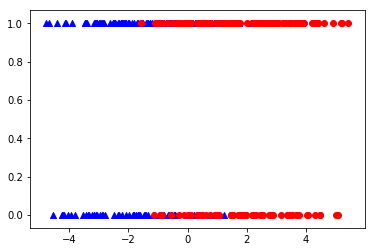

In [69]:
# plot.scatter(x_train_tsne[:,0]x_train_tsne[:,0], x_train_tsne[:,1])
plot.scatter(x_train_tsne[:,0], y_train,  marker='^', c='blue')
plot.scatter(x_train_tsne[:,1], y_train,  marker='o', c='red')
plot.show()
# x_train_tsne[:,1].shape, y_train.shape

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 5}
Grid Search Best score  0.5674445844011061
Code block 'training' took(HH:MM:SS): 0:00:00.066050
Code block 'testing' took(HH:MM:SS): 0:00:00.000468
F1 score 0.44984218077474897
Classification report  
               precision    recall  f1-score   support

           0       0.32      0.48      0.38        27
           1       0.59      0.42      0.49        48

   micro avg       0.44      0.44      0.44        75
   macro avg       0.45      0.45      0.44        75
weighted avg       0.49      0.44      0.45        75



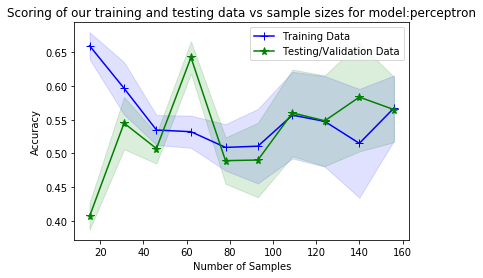

Confusion matrix, without normalization
[[13 14]
 [28 20]]


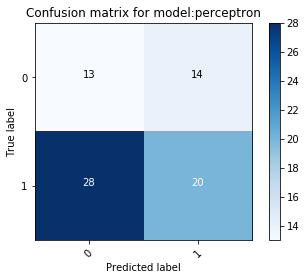

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.407418
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000019
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.5622106878628618
Code block 'training' took(HH:MM:SS): 0:00:00.057540
Code block 'testing' took(HH:MM:SS): 0:00:00.000355
F1 score 0.5032034632034632
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.52      0.42        27
           1       0.64      0.48      0.55        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.50      0.50      0.49        75
weighted avg       0.54      0.49      0.50        75



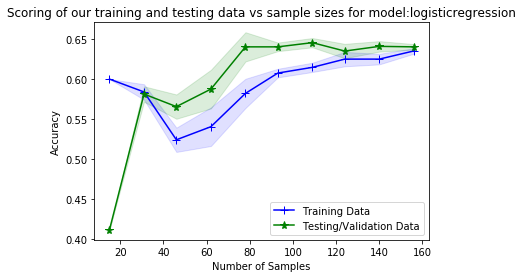

Confusion matrix, without normalization
[[14 13]
 [25 23]]


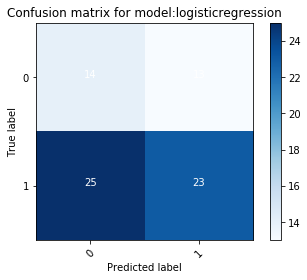

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.425681
inside decision function


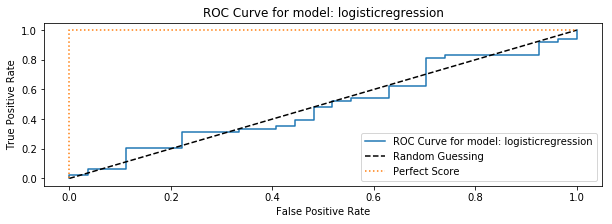

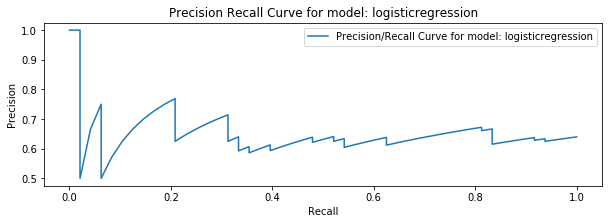

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.291013
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Grid Search Best score  0.5415392578436057
Code block 'training' took(HH:MM:SS): 0:00:00.102921
Code block 'testing' took(HH:MM:SS): 0:00:00.000172
F1 score 0.5293208430913349
Classification report  
               precision    recall  f1-score   support

           0       1.00      0.04      0.07        27
           1       0.65      1.00      0.79        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.82      0.52      0.43        75
weighted avg       0.78      0.65      0.53        75



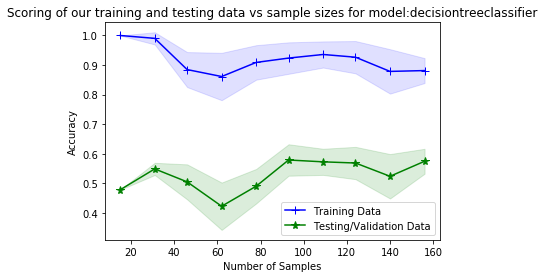

Confusion matrix, without normalization
[[ 1 26]
 [ 0 48]]


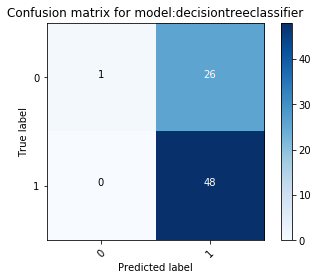

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.395135
inside decision function


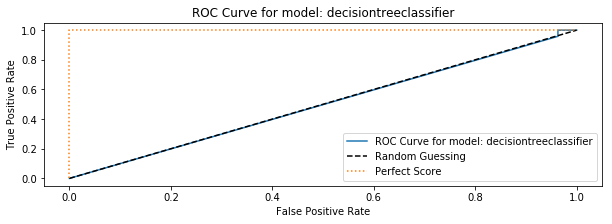

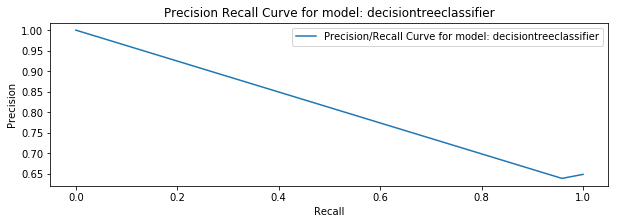

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.227245
Grid Search Best parameters  {'randomforestclassifier__criterion': 'gini', 'randomforestclassifier__n_estimators': 12}
Grid Search Best score  0.5542944736422998
Code block 'training' took(HH:MM:SS): 0:00:00.316425
Code block 'testing' took(HH:MM:SS): 0:00:00.001423
F1 score 0.5032034632034632
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.52      0.42        27
           1       0.64      0.48      0.55        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.50      0.50      0.49        75
weighted avg       0.54      0.49      0.50        75



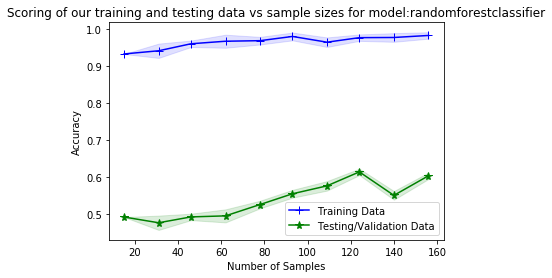

Confusion matrix, without normalization
[[14 13]
 [25 23]]


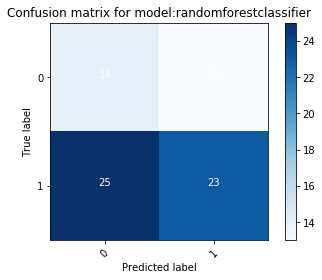

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.233796
inside decision function


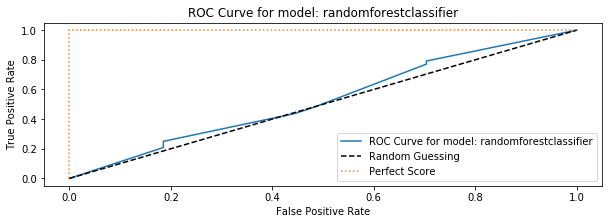

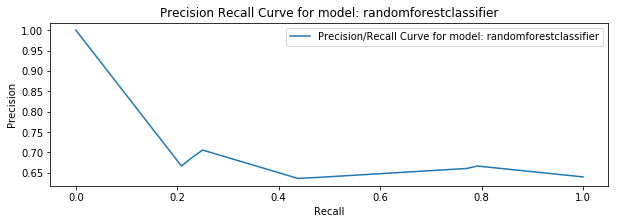

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.230628
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 4}
Grid Search Best score  0.5280054727880815
Code block 'training' took(HH:MM:SS): 0:00:00.065524
Code block 'testing' took(HH:MM:SS): 0:00:00.000897
F1 score 0.49035294117647055
Classification report  
               precision    recall  f1-score   support

           0       0.34      0.48      0.40        27
           1       0.62      0.48      0.54        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.48      0.48      0.47        75
weighted avg       0.52      0.48      0.49        75



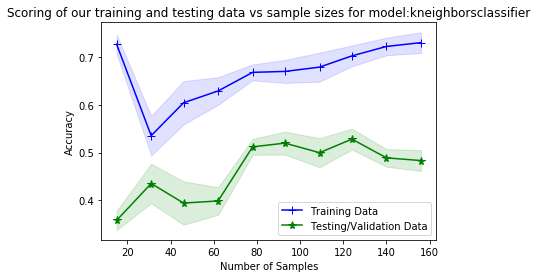

Confusion matrix, without normalization
[[13 14]
 [25 23]]


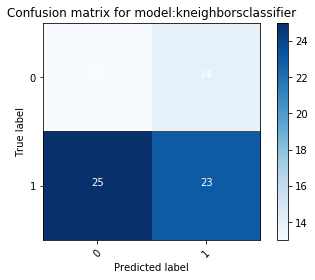

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.482780
inside decision function


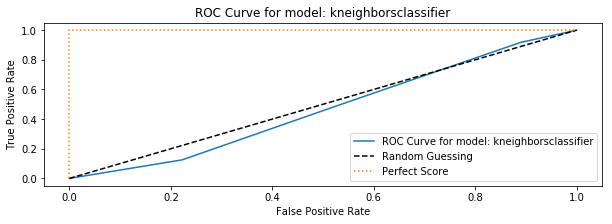

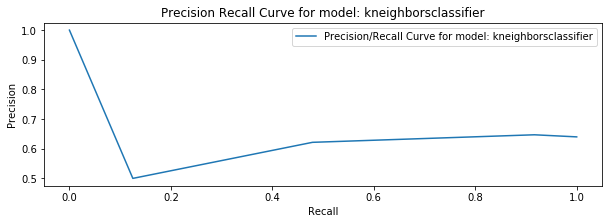

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.281987
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.5622106878628618
Code block 'training' took(HH:MM:SS): 0:00:00.187250
Code block 'testing' took(HH:MM:SS): 0:00:00.000204
F1 score 0.5032034632034632
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.52      0.42        27
           1       0.64      0.48      0.55        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.50      0.50      0.49        75
weighted avg       0.54      0.49      0.50        75



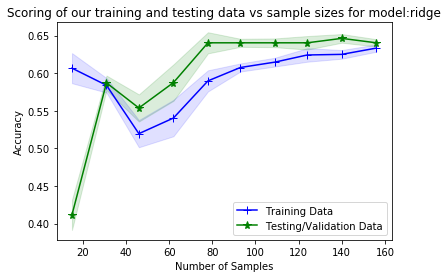

Confusion matrix, without normalization
[[14 13]
 [25 23]]


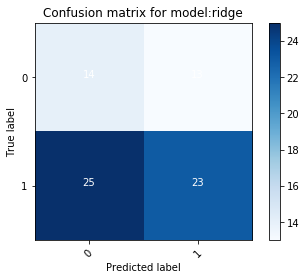

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.517380
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000016
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.5980771402510533
Code block 'training' took(HH:MM:SS): 0:00:00.027674
Code block 'testing' took(HH:MM:SS): 0:00:00.000374
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



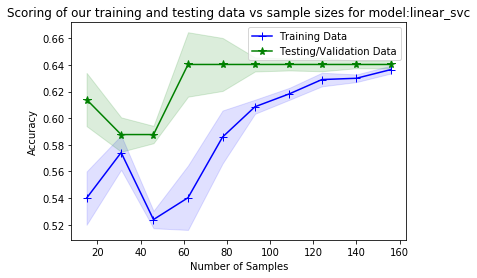

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


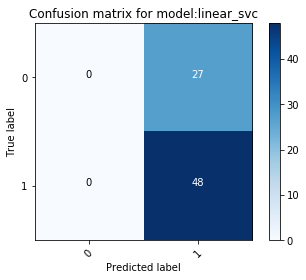

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.410819
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000027
Grid Search Best parameters  {'gamma_svc__C': 5, 'gamma_svc__gamma': 4}
Grid Search Best score  0.5257666970710448
Code block 'training' took(HH:MM:SS): 0:00:00.092765
Code block 'testing' took(HH:MM:SS): 0:00:00.000753
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



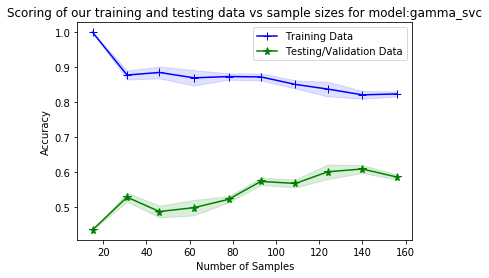

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


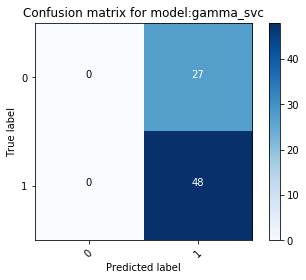

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.437014
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000018
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 8}
Grid Search Best score  0.5593911885216233
Code block 'training' took(HH:MM:SS): 0:00:00.104641
Code block 'testing' took(HH:MM:SS): 0:00:00.000159
F1 score 0.5493333333333333
Classification report  
               precision    recall  f1-score   support

           0       0.67      0.07      0.13        27
           1       0.65      0.98      0.78        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.66      0.53      0.46        75
weighted avg       0.66      0.65      0.55        75



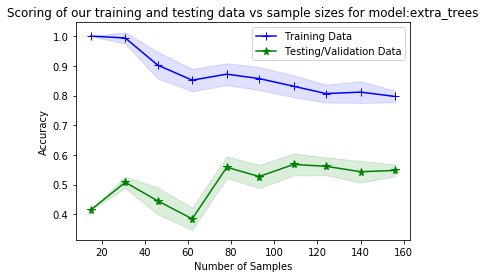

Confusion matrix, without normalization
[[ 2 25]
 [ 1 47]]


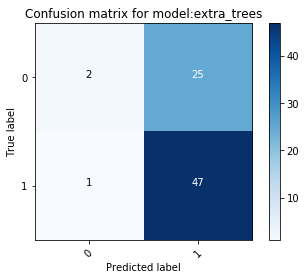

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.378938
inside decision function


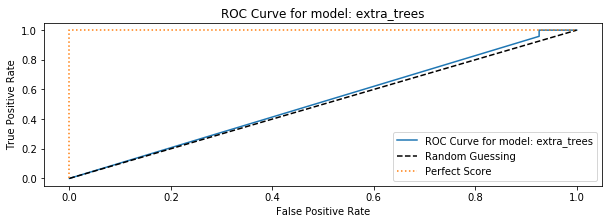

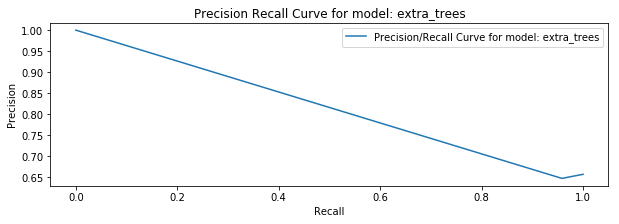

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.225355
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.4779041248606466
Code block 'training' took(HH:MM:SS): 0:00:00.144560
Code block 'testing' took(HH:MM:SS): 0:00:00.003024
F1 score 0.3566502463054187
Classification report  
               precision    recall  f1-score   support

           0       0.35      0.78      0.48        27
           1       0.60      0.19      0.29        48

   micro avg       0.40      0.40      0.40        75
   macro avg       0.47      0.48      0.38        75
weighted avg       0.51      0.40      0.36        75



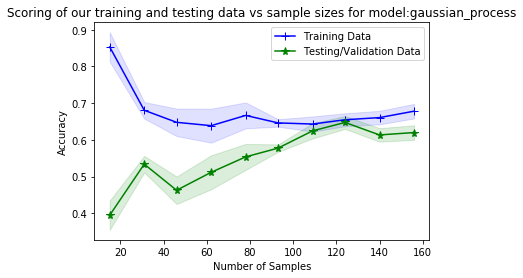

Confusion matrix, without normalization
[[21  6]
 [39  9]]


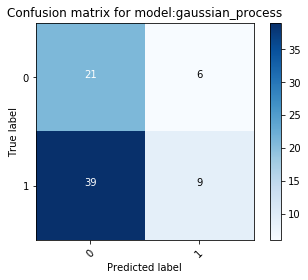

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.839049
inside decision function


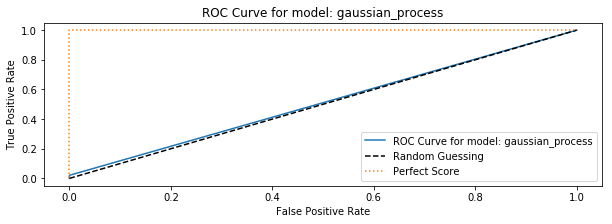

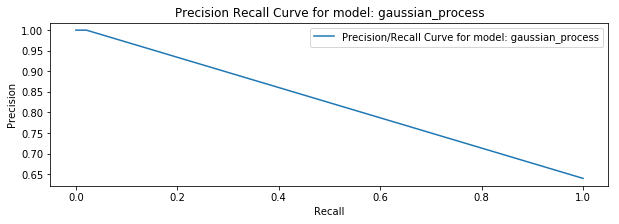

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.291867
Grid Search Best parameters  {'bernoulli__alpha': 0.6}
Grid Search Best score  0.5693153947501775
Code block 'training' took(HH:MM:SS): 0:00:00.059214
Code block 'testing' took(HH:MM:SS): 0:00:00.000207
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



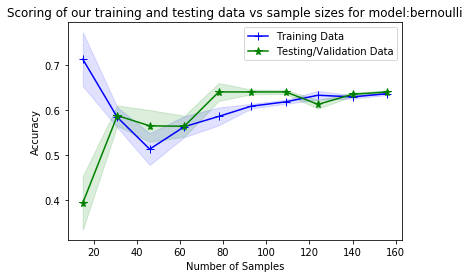

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


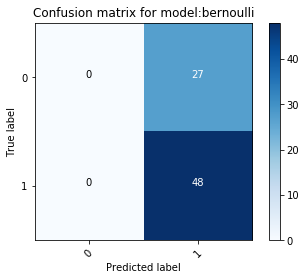

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.395664
inside decision function


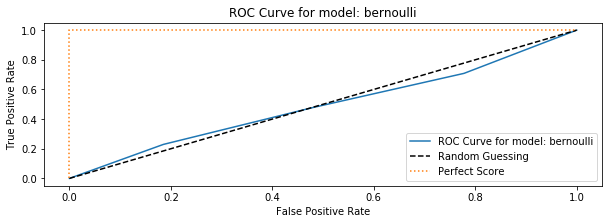

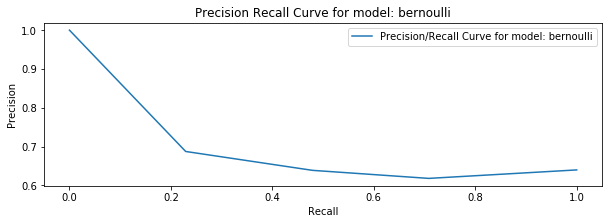

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.217284
Code block 'overalltime' took(HH:MM:SS): 0:00:08.991611
8991.610602714445


In [70]:
response = execute(
        x_train_tsne,
        y_train,
        x_test_tsne,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=StandardScaler())

In [71]:
results = panda.DataFrame(response).transpose()
results.head()
results[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
randomforestclassifier,0.503203,0.485931,0.493333,1233.8,0.529707,1.42279,316.425
extra_trees,0.549333,0.458333,0.653333,378.938,0.517747,0.15872,104.641
gaussian_process,0.35665,0.384236,0.4,839.049,0.510417,3.02421,144.56
decisiontreeclassifier,0.529321,0.429157,0.653333,395.135,0.498457,0.171804,102.921
logisticregression,0.503203,0.485931,0.493333,425.681,0.492284,0.354986,57.5402
bernoulli,0.499512,0.390244,0.64,395.664,0.491898,0.206506,59.2145
kneighborsclassifier,0.490353,0.470588,0.48,482.78,0.468364,0.896568,65.524
perceptron,0.449842,0.435079,0.44,407.418,0,0.468195,66.0497
ridge,0.503203,0.485931,0.493333,517.38,0,0.204231,187.25
linear_svc,0.499512,0.390244,0.64,410.819,0,0.374329,27.6736


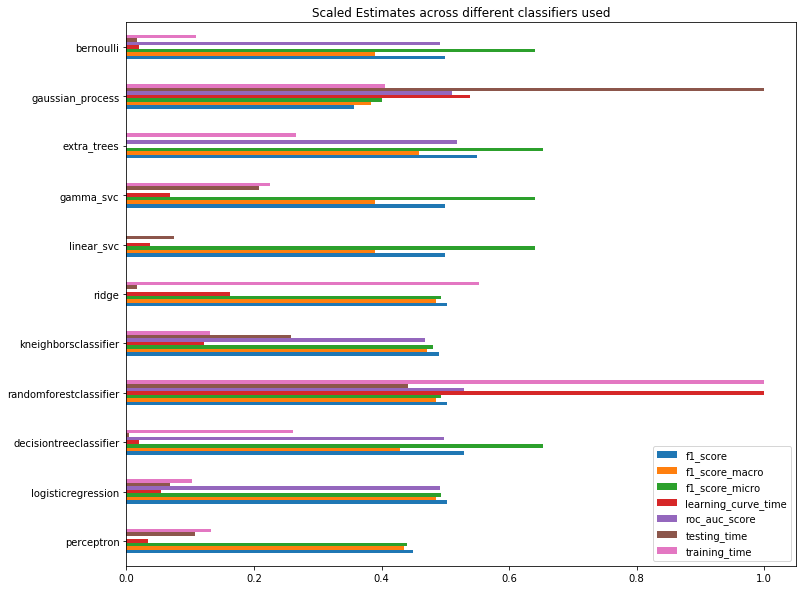

In [73]:
results['learning_curve_time'] = results['learning_curve_time'].astype('float64')
results['testing_time'] = results['testing_time'].astype('float64')
results['training_time'] = results['training_time'].astype('float64')
results['f1_score'] = results['f1_score'].astype('float64')
results['f1_score_micro'] = results['f1_score_micro'].astype('float64')
results['f1_score_macro'] = results['f1_score_macro'].astype('float64')
results['roc_auc_score'] = results['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results['learning_curve_time'] = (results['learning_curve_time']- results['learning_curve_time'].min())/(results['learning_curve_time'].max()- results['learning_curve_time'].min())
results['testing_time'] = (results['testing_time']- results['testing_time'].min())/(results['testing_time'].max()- results['testing_time'].min())
results['training_time'] = (results['training_time']- results['training_time'].min())/(results['training_time'].max()- results['training_time'].min())

results.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

### Conclusions:

#### 1. out of all our models, we can see that post t-SNE reduction, bernoulli transformation works best
#### 2. However model still has difficulty detecting lower balanced class 1 .

### Next Steps:

#### 1. SMOTE technique to oversample minority class. Run the t-SNE technique to verify scores .
#### 2. Add industry level classifiers such as XGBClassifier and LGBMClassifier to models under test



In [74]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

from imblearn.combine import SMOTETomek

In [75]:

tl = TomekLinks(return_indices=True, ratio='majority')
_x_train_tomek, _y_train_tomek, id_tl = tl.fit_sample(x_train, y_train)

smt = SMOTETomek(ratio='auto')
_x_train_smt, _y_train_smt = smt.fit_sample(x_train, y_train)

smote = SMOTE(ratio='minority')
x_train_smote, y_train_smote = smote.fit_sample(x_train,y_train)

tsne = TSNE()
x_train_tomek_tsne = tsne.fit_transform(scaler.fit_transform(_x_train_tomek))
x_test_tsne = tsne.fit_transform(x_test_std)

tsne = TSNE()
x_train_smote_auto_tsne = tsne.fit_transform(scaler.fit_transform(_x_train_smt))
x_test_tsne = tsne.fit_transform(x_test_std)

tsne = TSNE()
x_train_smote_tsne = tsne.fit_transform(scaler.fit_transform(x_train_smote))
x_test_tsne = tsne.fit_transform(x_test_std)



In [76]:
x_train_smote_tsne.shape,x_train_smote_auto_tsne.shape,x_train_tomek_tsne.shape,x_test_tsne.shape

((224, 2), (224, 2), (171, 2), (75, 2))

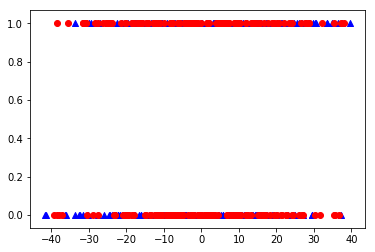

In [78]:
# plot.scatter(x_train_tsne[:,0]x_train_tsne[:,0], x_train_tsne[:,1])
plot.scatter(x_train_smote_tsne[:,0], y_train_smote,  marker='^', c='blue')
plot.scatter(x_train_smote_tsne[:,1], y_train_smote,  marker='o', c='red')
plot.show()
# x_train_tsne[:,1].shape, y_train.shape

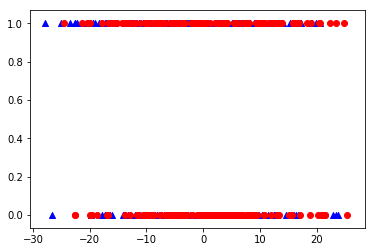

In [79]:
# plot.scatter(x_train_tsne[:,0]x_train_tsne[:,0], x_train_tsne[:,1])
plot.scatter(x_train_smote_auto_tsne[:,0], _y_train_smt,  marker='^', c='blue')
plot.scatter(x_train_smote_auto_tsne[:,1], _y_train_smt,  marker='o', c='red')
plot.show()
# x_train_tsne[:,1].shape, y_train.shape

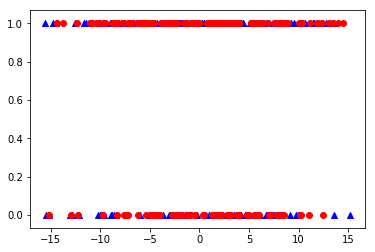

In [80]:
# plot.scatter(x_train_tsne[:,0]x_train_tsne[:,0], x_train_tsne[:,1])
plot.scatter(x_train_tomek_tsne[:,0], _y_train_tomek,  marker='^', c='blue')
plot.scatter(x_train_tomek_tsne[:,1], _y_train_tomek,  marker='o', c='red')
plot.show()
# x_train_tsne[:,1].shape, y_train.shape

In [81]:



classifiers = [
    Perceptron(random_state = 1),
    LogisticRegression(random_state = 1),
    DecisionTreeClassifier(),
    RandomForestClassifier(random_state = 1),
    KNeighborsClassifier(metric = 'minkowski'),
    RidgeClassifier(random_state = 123), 
    SVC(kernel="linear"),
    SVC(),
    ExtraTreeClassifier(random_state = 123),
    GaussianProcessClassifier(random_state = 123),
    BernoulliNB(),
    LGBMClassifier(objective = 'binary'),
    XGBClassifier(objective = 'binary:logistic')
]


classifier_names = [
            'perceptron',
            'logisticregression',
            'decisiontreeclassifier',
            'randomforestclassifier',
            'kneighborsclassifier',
            'ridge',
            'linear_svc',
            'gamma_svc',
            'extra_trees',
            'gaussian_process',
            'bernoulli',
            'lgbm_classifier',
            'xgb'
]

classifier_param_grid = [
            
            {'perceptron__max_iter': [5,10,30], 'perceptron__eta0': [.1]},
            {'logisticregression__C':[100,300, 500]},
            {'decisiontreeclassifier__max_depth':[6,8,10],'decisiontreeclassifier__criterion':['gini','entropy']},
            {'randomforestclassifier__n_estimators':[6,8,12],'randomforestclassifier__criterion': ['gini','entropy']} ,
            {'kneighborsclassifier__n_neighbors':[4,6,10]},
            {'ridge__alpha':[1,1.2,0.9],'ridge__max_iter':[100,300,500]},
            {'linear_svc__C':[0.025]},
            {'gamma_svc__gamma':[2,4],'gamma_svc__C':[1,5]},
            {'extra_trees__max_depth':[6,8,12],'extra_trees__criterion': ['gini','entropy']} ,
            {'gaussian_process__max_iter_predict':[200,400]} ,
            {'bernoulli__alpha':[0.2,0.6,1.2]} ,
            {
                 'lgbm_classifier__num_leaves':[25,], \
#                  'lgbm_classifier__min_data_in_leaf':[20],\
                 'lgbm_classifier__max_depth':[20,], \
                 'lgbm_classifier__learning_rate' : [0.01,],\
                 'lgbm_classifier__min_child_samples' :[2,], \
                 'lgbm_classifier__n_estimators' : [5000,], \
                 'lgbm_classifier__num_boost_round' : [100], \
                 'lgbm_classifier__feature_fraction' : [0.9,], \
                 'lgbm_classifier__bagging_freq' : [1,], \
                 'lgbm_classifier__bagging_seed' : [123], \
            },
             {
                'xgb__max_depth':[6,8,10],
                 'xgb__learning_rate':[0.1,0.5,1,2],
                 'xgb__n_estimators':[100,400,1000],             
                 'xgb__booster':['gbtree','dart'],
                 'xgb__subsample':[0.5, 0.2,0.8]
            },
    
]



In [82]:
x_train_tomek_tsne.shape,_y_train_tomek.shape

((171, 2), (171,))

##### Downsampling Majority

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 5}
Grid Search Best score  0.5031406215616743
Code block 'training' took(HH:MM:SS): 0:00:00.045091
Code block 'testing' took(HH:MM:SS): 0:00:00.000334
F1 score 0.5774358974358974
Classification report  
               precision    recall  f1-score   support

           0       0.44      0.74      0.56        27
           1       0.77      0.48      0.59        48

   micro avg       0.57      0.57      0.57        75
   macro avg       0.61      0.61      0.57        75
weighted avg       0.65      0.57      0.58        75



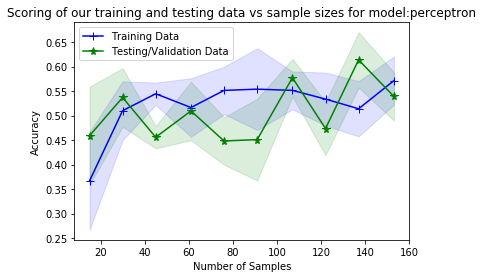

Confusion matrix, without normalization
[[20  7]
 [25 23]]


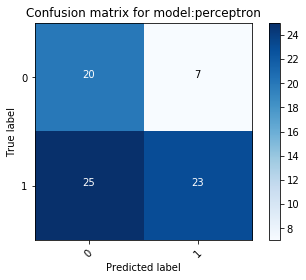

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.349005
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000024
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.4597726834568939
Code block 'training' took(HH:MM:SS): 0:00:00.040649
Code block 'testing' took(HH:MM:SS): 0:00:00.000139
F1 score 0.5293208430913349
Classification report  
               precision    recall  f1-score   support

           0       1.00      0.04      0.07        27
           1       0.65      1.00      0.79        48

   micro avg       0.65      0.65      0.65        75
   macro avg       0.82      0.52      0.43        75
weighted avg       0.78      0.65      0.53        75



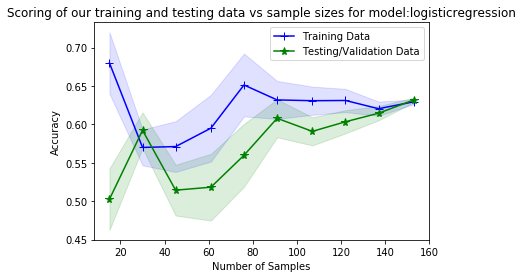

Confusion matrix, without normalization
[[ 1 26]
 [ 0 48]]


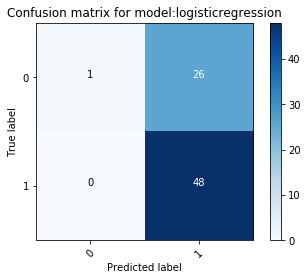

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.315284
inside decision function


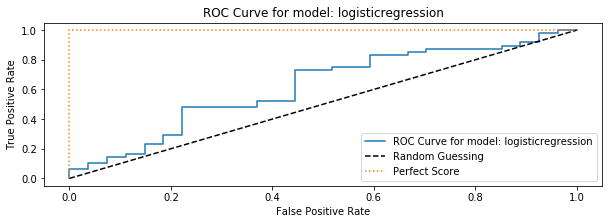

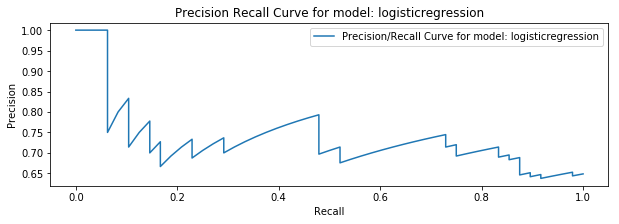

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.235489
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10}
Grid Search Best score  0.5478057517531201
Code block 'training' took(HH:MM:SS): 0:00:00.077035
Code block 'testing' took(HH:MM:SS): 0:00:00.000102
F1 score 0.46856330014224756
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.63      0.46        27
           1       0.64      0.38      0.47        48

   micro avg       0.47      0.47      0.47        75
   macro avg       0.50      0.50      0.47        75
weighted avg       0.54      0.47      0.47        75



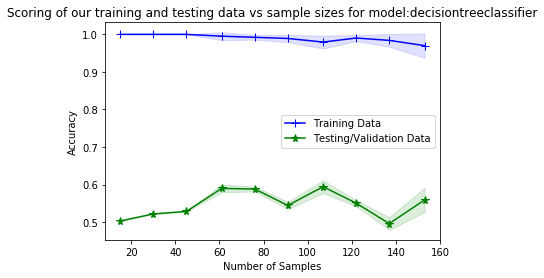

Confusion matrix, without normalization
[[17 10]
 [30 18]]


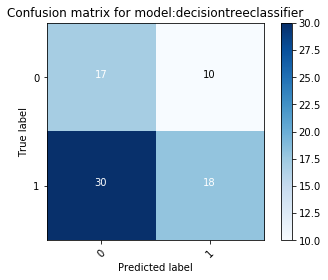

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.318207
inside decision function


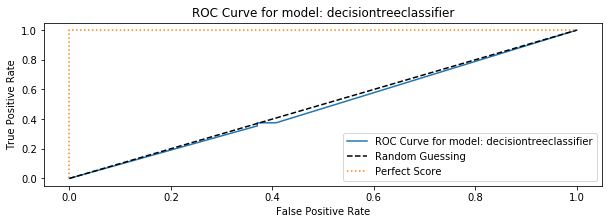

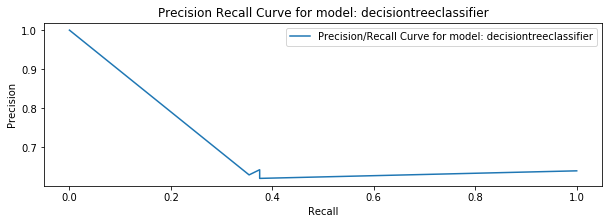

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.212947
Grid Search Best parameters  {'randomforestclassifier__criterion': 'gini', 'randomforestclassifier__n_estimators': 8}
Grid Search Best score  0.5812593838909628
Code block 'training' took(HH:MM:SS): 0:00:00.278226
Code block 'testing' took(HH:MM:SS): 0:00:00.000754
F1 score 0.47705627705627707
Classification report  
               precision    recall  f1-score   support

           0       0.33      0.48      0.39        27
           1       0.61      0.46      0.52        48

   micro avg       0.47      0.47      0.47        75
   macro avg       0.47      0.47      0.46        75
weighted avg       0.51      0.47      0.48        75



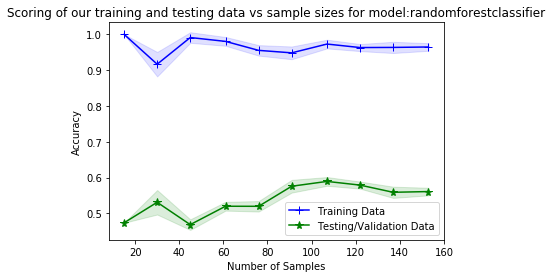

Confusion matrix, without normalization
[[13 14]
 [26 22]]


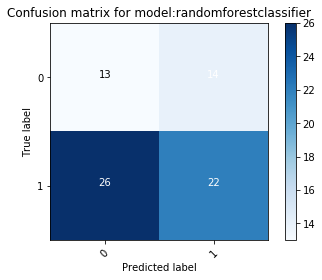

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.917560
inside decision function


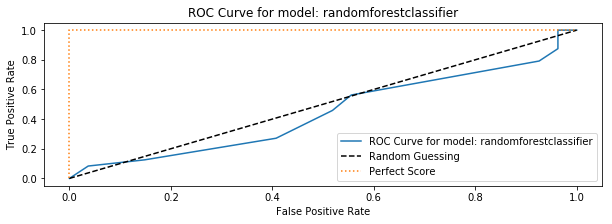

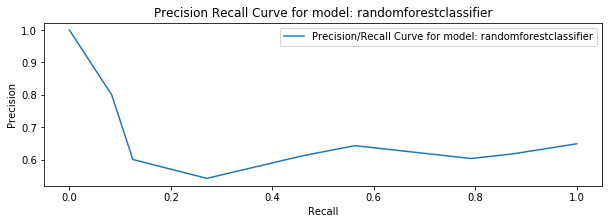

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.235176
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 6}
Grid Search Best score  0.6165476823371558
Code block 'training' took(HH:MM:SS): 0:00:00.060630
Code block 'testing' took(HH:MM:SS): 0:00:00.000849
F1 score 0.49333333333333335
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.30      0.30        27
           1       0.60      0.60      0.60        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.49      0.49        75



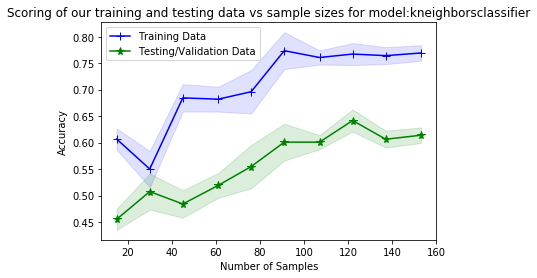

Confusion matrix, without normalization
[[ 8 19]
 [19 29]]


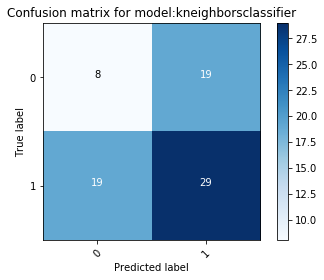

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.396887
inside decision function


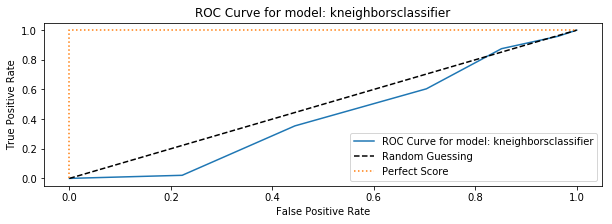

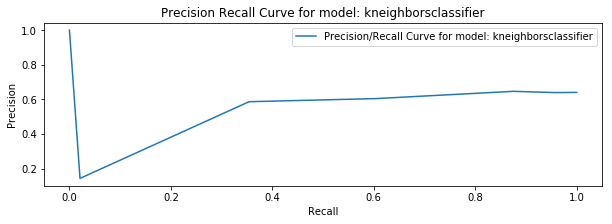

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.215378
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.4597726834568939
Code block 'training' took(HH:MM:SS): 0:00:00.157517
Code block 'testing' took(HH:MM:SS): 0:00:00.000105
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



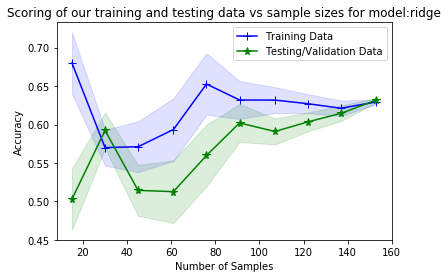

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


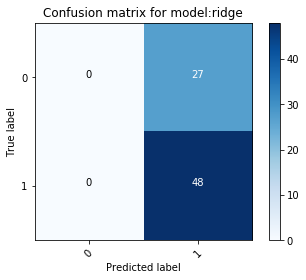

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.403213
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000018
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.42548484653747815
Code block 'training' took(HH:MM:SS): 0:00:00.019667
Code block 'testing' took(HH:MM:SS): 0:00:00.000391
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



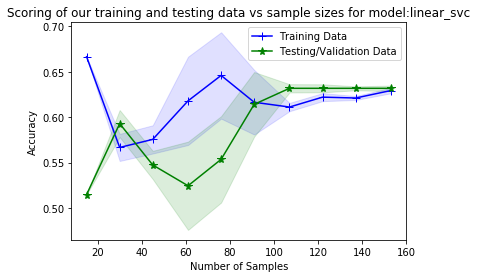

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


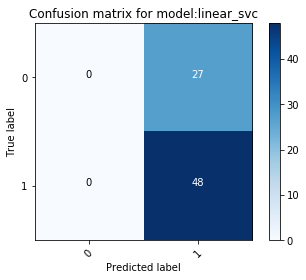

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.334946
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000017
Grid Search Best parameters  {'gamma_svc__C': 5, 'gamma_svc__gamma': 2}
Grid Search Best score  0.608237766132503
Code block 'training' took(HH:MM:SS): 0:00:00.095024
Code block 'testing' took(HH:MM:SS): 0:00:00.000624
F1 score 0.46912280701754394
Classification report  
               precision    recall  f1-score   support

           0       0.11      0.04      0.06        27
           1       0.61      0.83      0.70        48

   micro avg       0.55      0.55      0.55        75
   macro avg       0.36      0.44      0.38        75
weighted avg       0.43      0.55      0.47        75



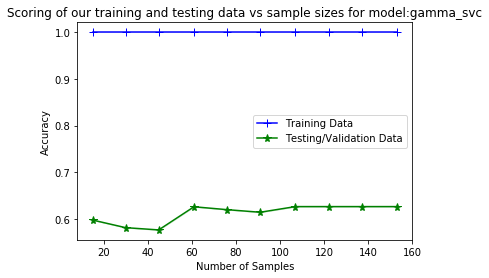

Confusion matrix, without normalization
[[ 1 26]
 [ 8 40]]


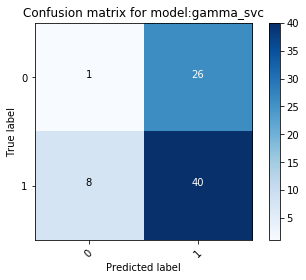

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.385432
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000016
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 12}
Grid Search Best score  0.5356439369597263
Code block 'training' took(HH:MM:SS): 0:00:00.068286
Code block 'testing' took(HH:MM:SS): 0:00:00.000104
F1 score 0.4214705882352941
Classification report  
               precision    recall  f1-score   support

           0       0.14      0.11      0.12        27
           1       0.56      0.62      0.59        48

   micro avg       0.44      0.44      0.44        75
   macro avg       0.35      0.37      0.36        75
weighted avg       0.41      0.44      0.42        75



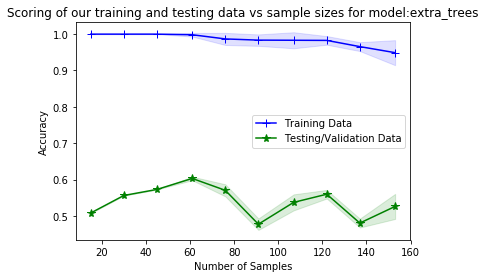

Confusion matrix, without normalization
[[ 3 24]
 [18 30]]


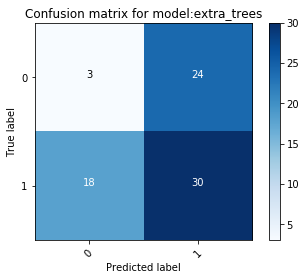

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.383737
inside decision function


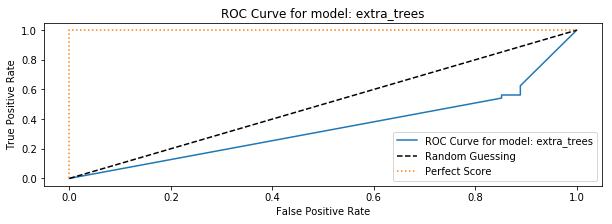

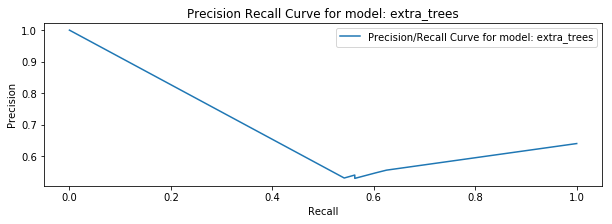

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.219673
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.6314762235814867
Code block 'training' took(HH:MM:SS): 0:00:00.131979
Code block 'testing' took(HH:MM:SS): 0:00:00.002266
F1 score 0.4893866273715234
Classification report  
               precision    recall  f1-score   support

           0       0.32      0.41      0.36        27
           1       0.61      0.52      0.56        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.47      0.46      0.46        75
weighted avg       0.51      0.48      0.49        75



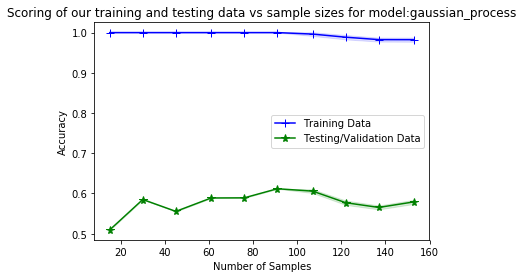

Confusion matrix, without normalization
[[11 16]
 [23 25]]


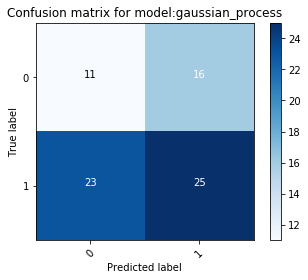

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.690342
inside decision function


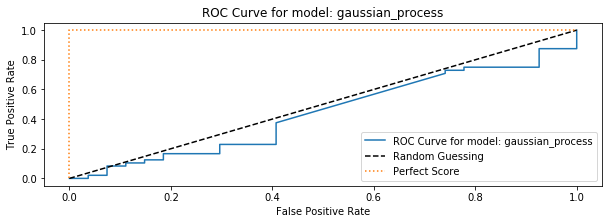

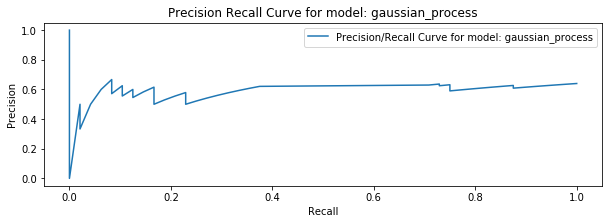

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.245779
Grid Search Best parameters  {'bernoulli__alpha': 0.6}
Grid Search Best score  0.5738291922502449
Code block 'training' took(HH:MM:SS): 0:00:00.045704
Code block 'testing' took(HH:MM:SS): 0:00:00.000155
F1 score 0.49951219512195116
Classification report  
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.64      1.00      0.78        48

   micro avg       0.64      0.64      0.64        75
   macro avg       0.32      0.50      0.39        75
weighted avg       0.41      0.64      0.50        75



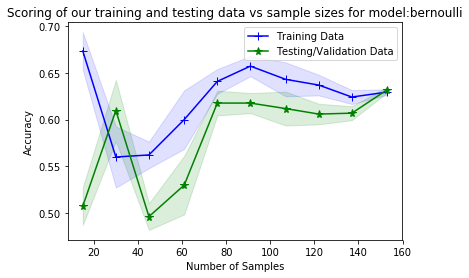

Confusion matrix, without normalization
[[ 0 27]
 [ 0 48]]


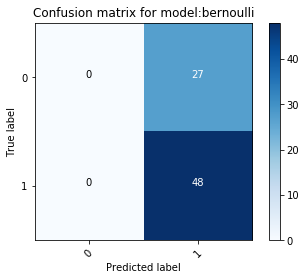

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.319808
inside decision function


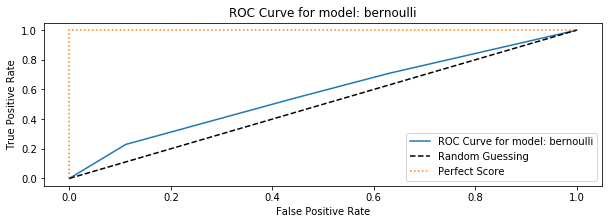

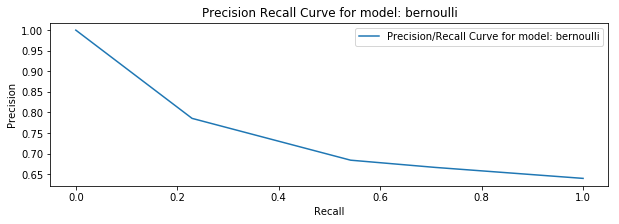

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.219370
Grid Search Best parameters  {'lgbm_classifier__bagging_freq': 1, 'lgbm_classifier__bagging_seed': 123, 'lgbm_classifier__feature_fraction': 0.9, 'lgbm_classifier__learning_rate': 0.01, 'lgbm_classifier__max_depth': 20, 'lgbm_classifier__min_child_samples': 2, 'lgbm_classifier__n_estimators': 5000, 'lgbm_classifier__num_boost_round': 100, 'lgbm_classifier__num_leaves': 25}
Grid Search Best score  0.5415174494121863
Code block 'training' took(HH:MM:SS): 0:00:00.343365
Code block 'testing' took(HH:MM:SS): 0:00:00.000786
F1 score 0.6018524871355059
Classification report  
               precision    recall  f1-score   support

           0       0.47      0.30      0.36        27
           1       0.67      0.81      0.74        48

   micro avg       0.63      0.63      0.63        75
   macro avg       0.57      0.55      0.55        75
weighted avg       0.60      0.63      0.60        75



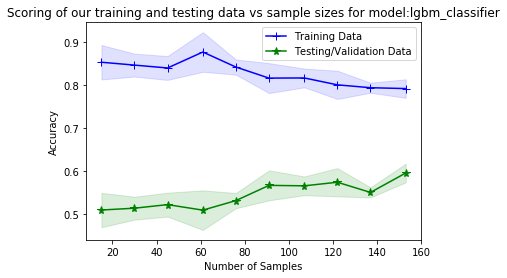

Confusion matrix, without normalization
[[ 8 19]
 [ 9 39]]


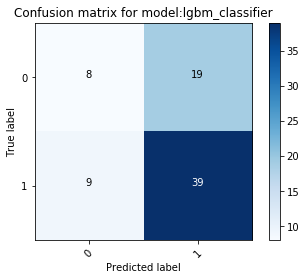

Code block 'learning_curve' took(HH:MM:SS): 0:00:04.005567
inside decision function


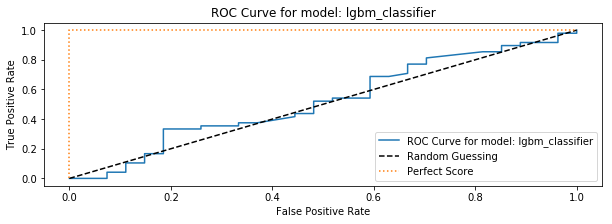

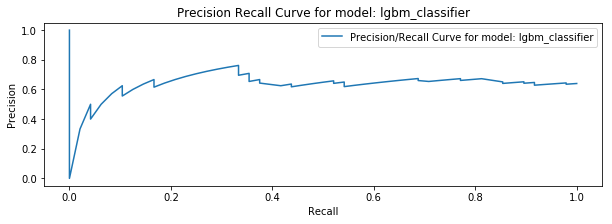

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.299543
Grid Search Best parameters  {'xgb__booster': 'dart', 'xgb__learning_rate': 1, 'xgb__max_depth': 6, 'xgb__n_estimators': 100, 'xgb__subsample': 0.5}
Grid Search Best score  0.6077957130588709
Code block 'training' took(HH:MM:SS): 0:04:41.159346
Code block 'testing' took(HH:MM:SS): 0:00:00.000614
F1 score 0.4880960548885077
Classification report  
               precision    recall  f1-score   support

           0       0.24      0.15      0.18        27
           1       0.60      0.73      0.66        48

   micro avg       0.52      0.52      0.52        75
   macro avg       0.42      0.44      0.42        75
weighted avg       0.47      0.52      0.49        75



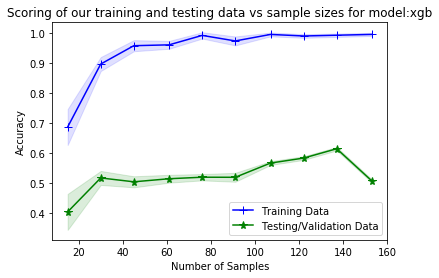

Confusion matrix, without normalization
[[ 4 23]
 [13 35]]


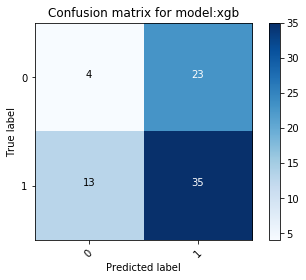

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.686760
inside decision function


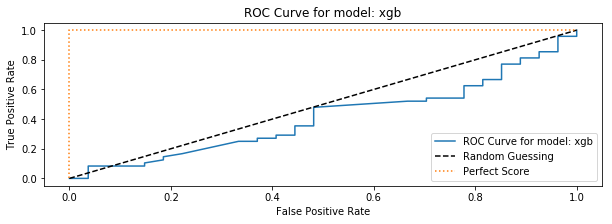

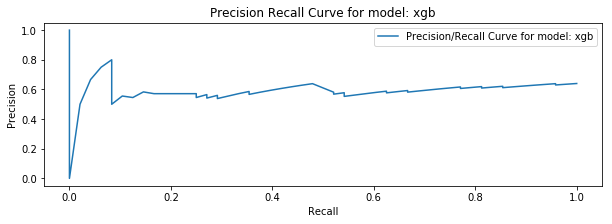

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.219365
Code block 'overalltime' took(HH:MM:SS): 0:04:55.224987
295224.9873991218


In [83]:
response2 = execute(
        x_train_tomek_tsne ,
        _y_train_tomek,
        x_test_tsne,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=None)

In [84]:
results2 = panda.DataFrame(response2).transpose()
# results.head()
results2[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
logisticregression,0.529321,0.429157,0.653333,315.284,0.619599,0.138809,40.6494
bernoulli,0.499512,0.390244,0.64,319.808,0.573302,0.155307,45.7039
lgbm_classifier,0.601852,0.549743,0.626667,4005.57,0.522762,0.785635,343.365
decisiontreeclassifier,0.468563,0.466572,0.466667,318.207,0.486883,0.1024,77.0355
randomforestclassifier,0.477056,0.458874,0.466667,917.56,0.442515,0.754346,278.226
gaussian_process,0.489387,0.461227,0.48,690.342,0.439815,2.26588,131.979
kneighborsclassifier,0.493333,0.450231,0.493333,396.887,0.415895,0.848781,60.6299
xgb,0.488096,0.421098,0.52,1686.76,0.411265,0.614399,281159
extra_trees,0.421471,0.356618,0.44,383.737,0.341821,0.103538,68.286
perceptron,0.577436,0.57265,0.573333,349.005,0,0.333937,45.0907


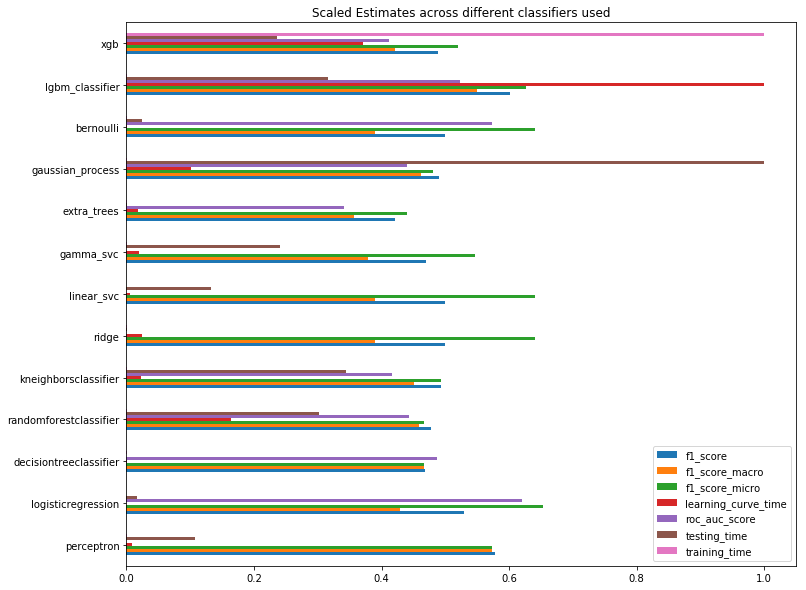

In [86]:
results2['learning_curve_time'] = results2['learning_curve_time'].astype('float64')
results2['testing_time'] = results2['testing_time'].astype('float64')
results2['training_time'] = results2['training_time'].astype('float64')
results2['f1_score'] = results2['f1_score'].astype('float64')
results2['f1_score_micro'] = results2['f1_score_micro'].astype('float64')
results2['f1_score_macro'] = results2['f1_score_macro'].astype('float64')
results2['roc_auc_score'] = results2['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results2['learning_curve_time'] = (results2['learning_curve_time']- results2['learning_curve_time'].min())/(results2['learning_curve_time'].max()- results2['learning_curve_time'].min())
results2['testing_time'] = (results2['testing_time']- results2['testing_time'].min())/(results2['testing_time'].max()- results2['testing_time'].min())
results2['training_time'] = (results2['training_time']- results2['training_time'].min())/(results2['training_time'].max()- results2['training_time'].min())

results2.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

In [147]:
x_test_tsne.shape, x_train_smote.shape

((75, 2), (224, 300))

##### SMOTE Upsampling

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 5}
Grid Search Best score  0.6102837380011293
Code block 'training' took(HH:MM:SS): 0:00:00.046685
Code block 'testing' took(HH:MM:SS): 0:00:00.000283
F1 score 0.581466275659824
Classification report  
               precision    recall  f1-score   support

           0       0.43      0.56      0.48        27
           1       0.70      0.58      0.64        48

   micro avg       0.57      0.57      0.57        75
   macro avg       0.56      0.57      0.56        75
weighted avg       0.60      0.57      0.58        75



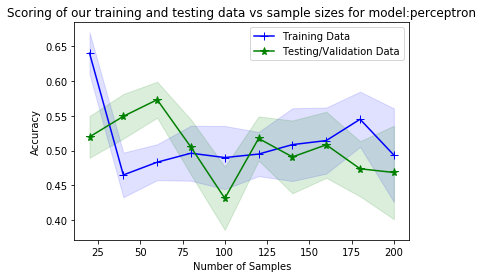

Confusion matrix, without normalization
[[15 12]
 [20 28]]


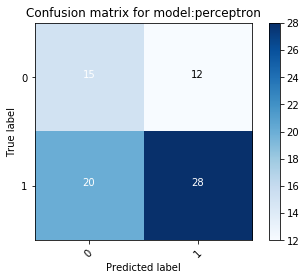

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.400753
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000020
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.589550395256917
Code block 'training' took(HH:MM:SS): 0:00:00.047180
Code block 'testing' took(HH:MM:SS): 0:00:00.000122
F1 score 0.49333333333333335
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.30      0.30        27
           1       0.60      0.60      0.60        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.49      0.49        75



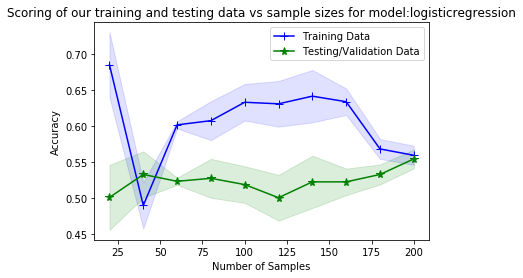

Confusion matrix, without normalization
[[ 8 19]
 [19 29]]


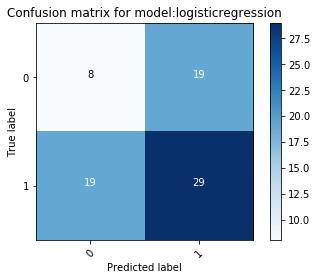

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.337682
inside decision function


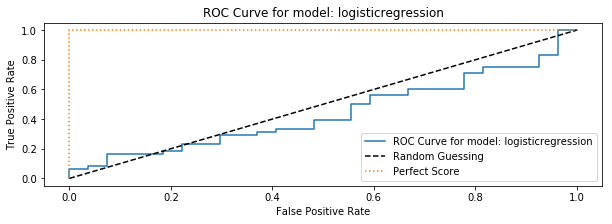

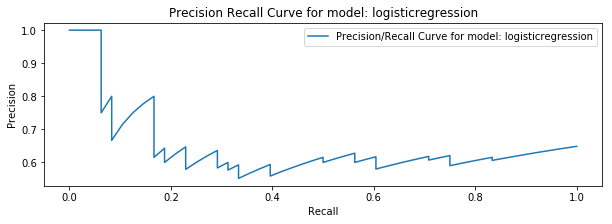

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.241852
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 6}
Grid Search Best score  0.6325698757763975
Code block 'training' took(HH:MM:SS): 0:00:00.080939
Code block 'testing' took(HH:MM:SS): 0:00:00.000103
F1 score 0.4835153887208682
Classification report  
               precision    recall  f1-score   support

           0       0.37      0.63      0.47        27
           1       0.66      0.40      0.49        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.51      0.51      0.48        75
weighted avg       0.55      0.48      0.48        75



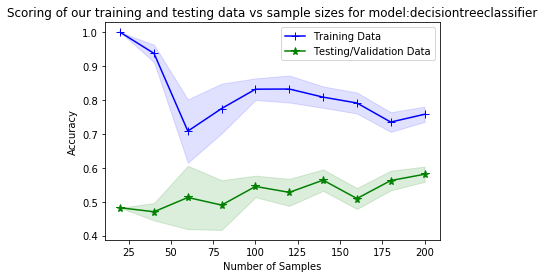

Confusion matrix, without normalization
[[17 10]
 [29 19]]


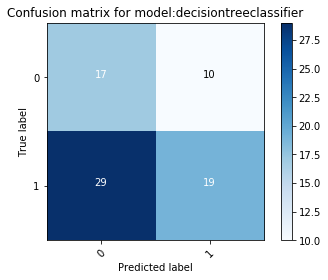

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.329835
inside decision function


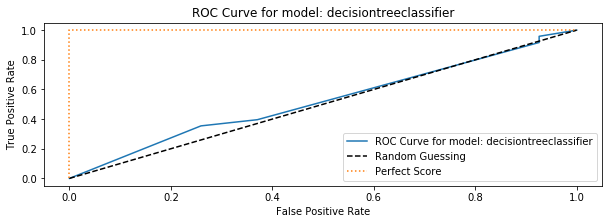

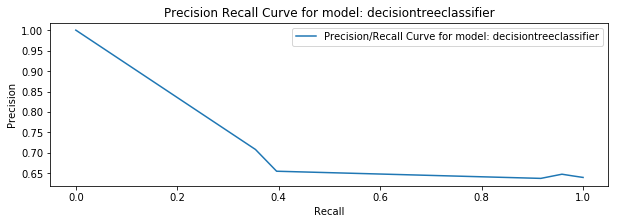

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.227346
Grid Search Best parameters  {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 12}
Grid Search Best score  0.6534884952004517
Code block 'training' took(HH:MM:SS): 0:00:00.297279
Code block 'testing' took(HH:MM:SS): 0:00:00.001152
F1 score 0.502991202346041
Classification report  
               precision    recall  f1-score   support

           0       0.34      0.44      0.39        27
           1       0.62      0.52      0.57        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.48      0.48      0.48        75
weighted avg       0.52      0.49      0.50        75



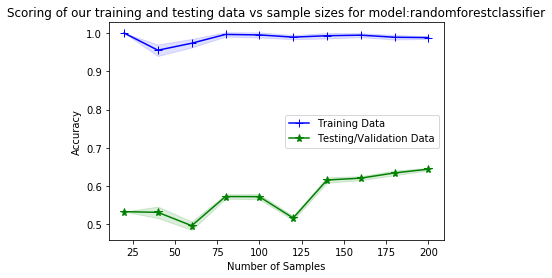

Confusion matrix, without normalization
[[12 15]
 [23 25]]


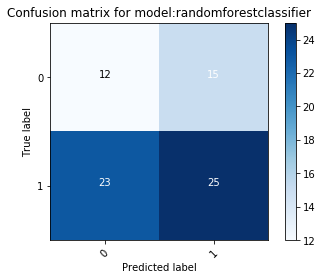

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.216517
inside decision function


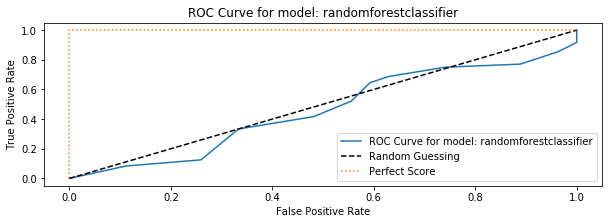

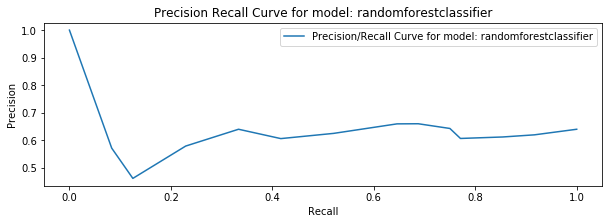

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.296446
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 4}
Grid Search Best score  0.7158385093167701
Code block 'training' took(HH:MM:SS): 0:00:00.061298
Code block 'testing' took(HH:MM:SS): 0:00:00.000684
F1 score 0.5066666666666667
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.70      0.51        27
           1       0.70      0.40      0.51        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.55      0.55      0.51        75
weighted avg       0.59      0.51      0.51        75



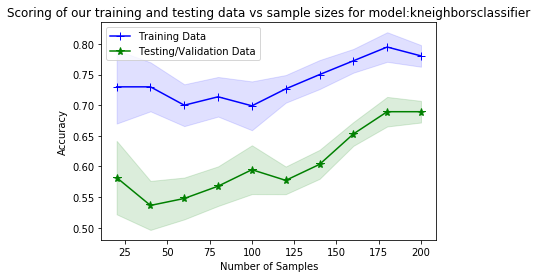

Confusion matrix, without normalization
[[19  8]
 [29 19]]


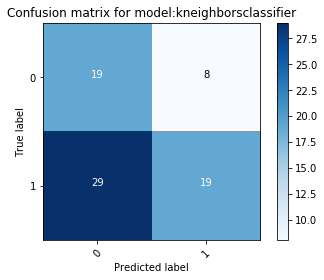

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.422295
inside decision function


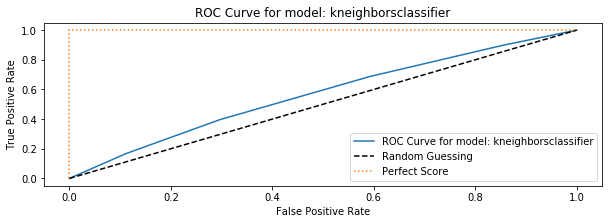

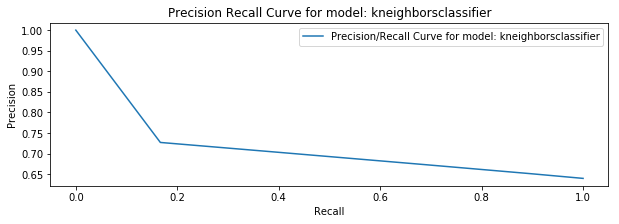

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.222430
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.5887387069452288
Code block 'training' took(HH:MM:SS): 0:00:00.129873
Code block 'testing' took(HH:MM:SS): 0:00:00.000099
F1 score 0.49333333333333335
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.30      0.30        27
           1       0.60      0.60      0.60        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.49      0.49        75



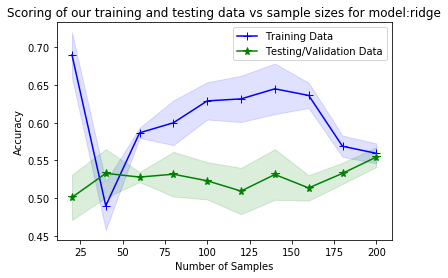

Confusion matrix, without normalization
[[ 8 19]
 [19 29]]


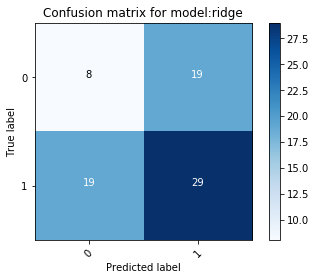

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.434276
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000015
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.5943852343308865
Code block 'training' took(HH:MM:SS): 0:00:00.027371
Code block 'testing' took(HH:MM:SS): 0:00:00.000383
F1 score 0.49333333333333335
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.30      0.30        27
           1       0.60      0.60      0.60        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.49      0.49        75



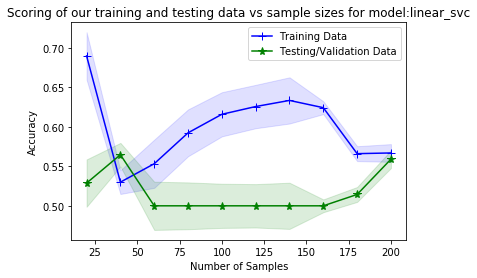

Confusion matrix, without normalization
[[ 8 19]
 [19 29]]


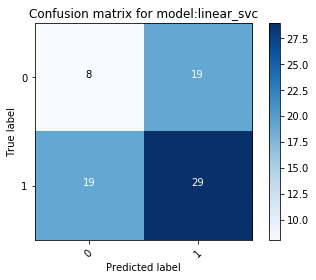

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.375379
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000021
Grid Search Best parameters  {'gamma_svc__C': 1, 'gamma_svc__gamma': 2}
Grid Search Best score  0.7760622529644269
Code block 'training' took(HH:MM:SS): 0:00:00.147765
Code block 'testing' took(HH:MM:SS): 0:00:00.000967
F1 score 0.5750906243007384
Classification report  
               precision    recall  f1-score   support

           0       0.43      0.22      0.29        27
           1       0.66      0.83      0.73        48

   micro avg       0.61      0.61      0.61        75
   macro avg       0.54      0.53      0.51        75
weighted avg       0.57      0.61      0.58        75



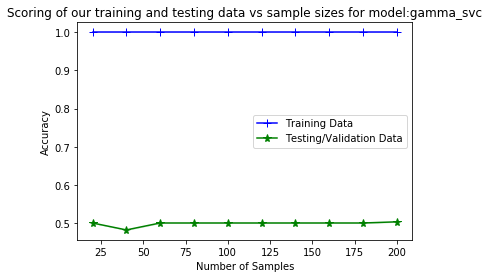

Confusion matrix, without normalization
[[ 6 21]
 [ 8 40]]


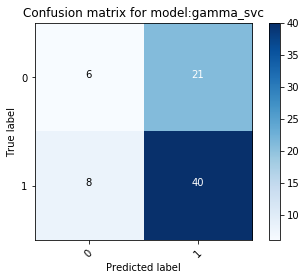

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.482505
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000018
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 8}
Grid Search Best score  0.598443675889328
Code block 'training' took(HH:MM:SS): 0:00:00.080409
Code block 'testing' took(HH:MM:SS): 0:00:00.000118
F1 score 0.4852971137521222
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.33      0.32        27
           1       0.60      0.56      0.58        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.48      0.49        75



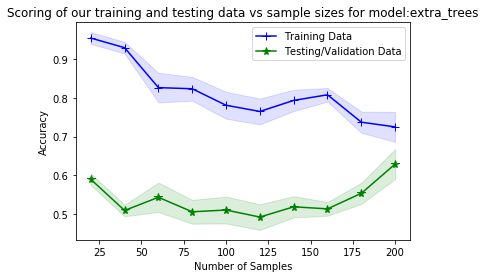

Confusion matrix, without normalization
[[ 9 18]
 [21 27]]


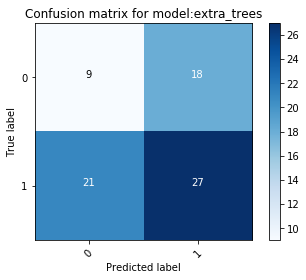

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.305632
inside decision function


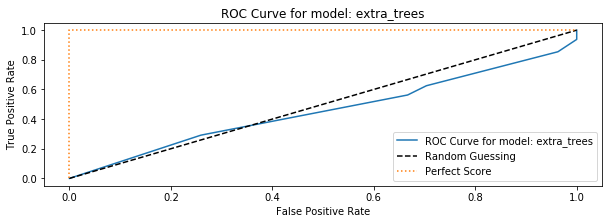

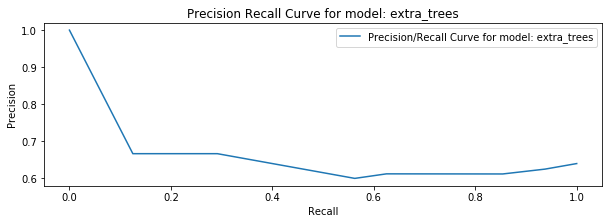

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.277636
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.78125
Code block 'training' took(HH:MM:SS): 0:00:00.228387
Code block 'testing' took(HH:MM:SS): 0:00:00.001730
F1 score 0.5116921335597057
Classification report  
               precision    recall  f1-score   support

           0       0.33      0.37      0.35        27
           1       0.62      0.58      0.60        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.48      0.48      0.48        75
weighted avg       0.52      0.51      0.51        75



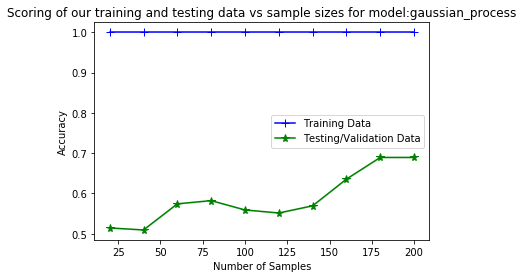

Confusion matrix, without normalization
[[10 17]
 [20 28]]


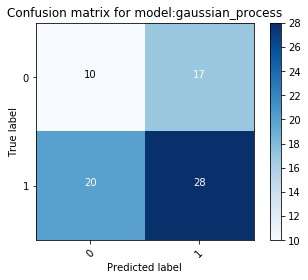

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.106812
inside decision function


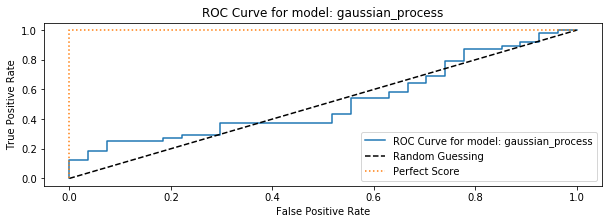

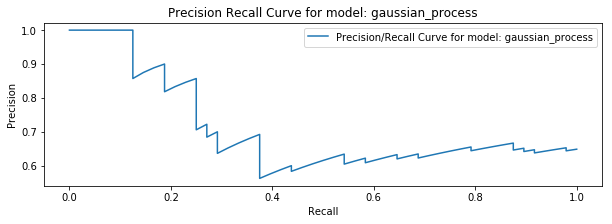

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.268641
Grid Search Best parameters  {'bernoulli__alpha': 0.2}
Grid Search Best score  0.5679788961038962
Code block 'training' took(HH:MM:SS): 0:00:00.046783
Code block 'testing' took(HH:MM:SS): 0:00:00.000181
F1 score 0.49333333333333335
Classification report  
               precision    recall  f1-score   support

           0       0.30      0.30      0.30        27
           1       0.60      0.60      0.60        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.45      0.45      0.45        75
weighted avg       0.49      0.49      0.49        75



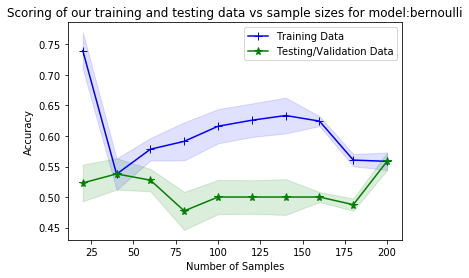

Confusion matrix, without normalization
[[ 8 19]
 [19 29]]


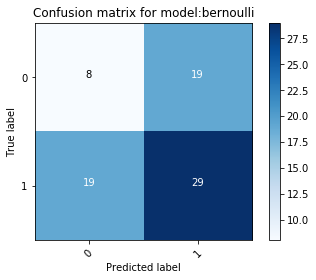

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.384900
inside decision function


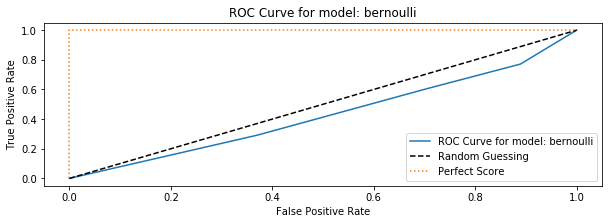

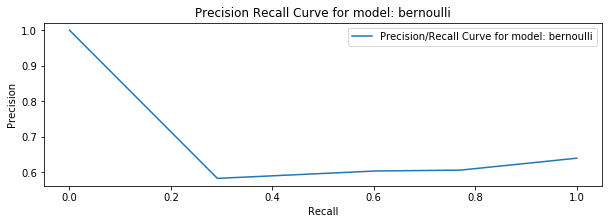

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.207655
Grid Search Best parameters  {'lgbm_classifier__bagging_freq': 1, 'lgbm_classifier__bagging_seed': 123, 'lgbm_classifier__feature_fraction': 0.9, 'lgbm_classifier__learning_rate': 0.01, 'lgbm_classifier__max_depth': 20, 'lgbm_classifier__min_child_samples': 2, 'lgbm_classifier__n_estimators': 5000, 'lgbm_classifier__num_boost_round': 100, 'lgbm_classifier__num_leaves': 25}
Grid Search Best score  0.5419254658385093
Code block 'training' took(HH:MM:SS): 0:00:00.186346
Code block 'testing' took(HH:MM:SS): 0:00:00.001713
F1 score 0.4734632683658171
Classification report  
               precision    recall  f1-score   support

           0       0.29      0.33      0.31        27
           1       0.59      0.54      0.57        48

   micro avg       0.47      0.47      0.47        75
   macro avg       0.44      0.44      0.44        75
weighted avg       0.48      0.47      0.47        75



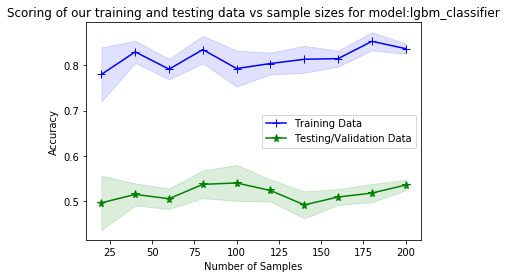

Confusion matrix, without normalization
[[ 9 18]
 [22 26]]


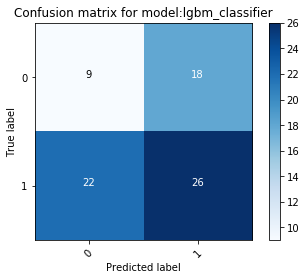

Code block 'learning_curve' took(HH:MM:SS): 0:00:02.584453
inside decision function


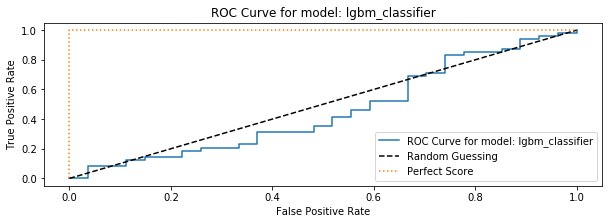

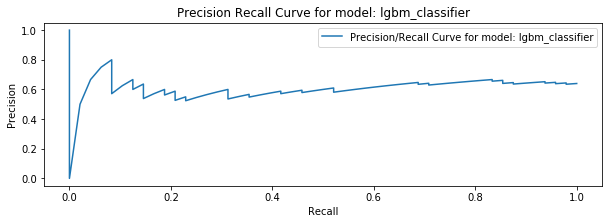

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.281136
Grid Search Best parameters  {'xgb__booster': 'gbtree', 'xgb__learning_rate': 0.5, 'xgb__max_depth': 10, 'xgb__n_estimators': 100, 'xgb__subsample': 0.8}
Grid Search Best score  0.6407926312817617
Code block 'training' took(HH:MM:SS): 0:07:05.115359
Code block 'testing' took(HH:MM:SS): 0:00:00.000629
F1 score 0.5616842105263157
Classification report  
               precision    recall  f1-score   support

           0       0.39      0.41      0.40        27
           1       0.66      0.65      0.65        48

   micro avg       0.56      0.56      0.56        75
   macro avg       0.53      0.53      0.53        75
weighted avg       0.56      0.56      0.56        75



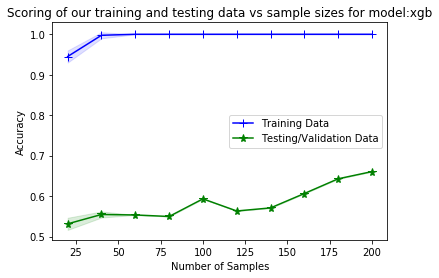

Confusion matrix, without normalization
[[11 16]
 [17 31]]


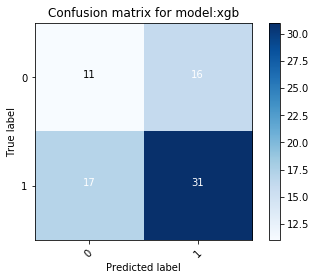

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.314541
inside decision function


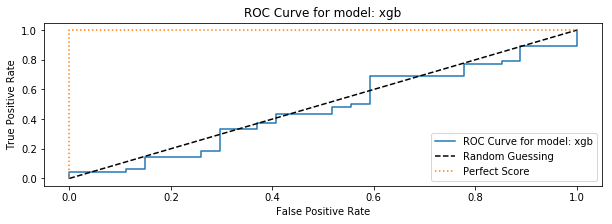

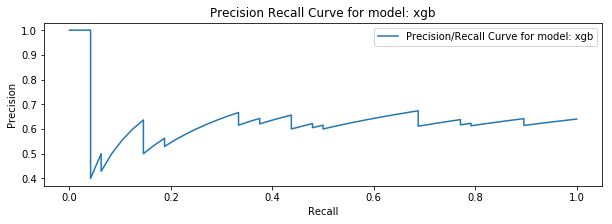

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.200183
Code block 'overalltime' took(HH:MM:SS): 0:07:18.505619
438505.6189107604


In [87]:
response1 = execute(
        x_train_smote_tsne ,
        y_train_smote ,
        x_test_tsne ,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=None)

In [88]:
results1 = panda.DataFrame(response1).transpose()
# results1.head()
results1[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
kneighborsclassifier,0.506667,0.506667,0.506667,422.295,0.567515,0.683804,61.2977
decisiontreeclassifier,0.483515,0.47963,0.48,329.835,0.524691,0.102969,80.9386
gaussian_process,0.511692,0.476514,0.506667,1106.81,0.516204,1.72999,228.387
xgb,0.561684,0.526316,0.56,1314.54,0.466821,0.629191,425115
randomforestclassifier,0.502991,0.477639,0.493333,1216.52,0.459105,1.152,297.279
extra_trees,0.485297,0.448217,0.48,305.632,0.458719,0.11776,80.409
lgbm_classifier,0.473463,0.437781,0.466667,2584.45,0.456019,1.71292,186.346
logisticregression,0.493333,0.450231,0.493333,337.682,0.439815,0.122311,47.1796
bernoulli,0.493333,0.450231,0.493333,384.9,0.429012,0.180907,46.7831
perceptron,0.581466,0.560117,0.573333,400.753,0,0.283306,46.6853


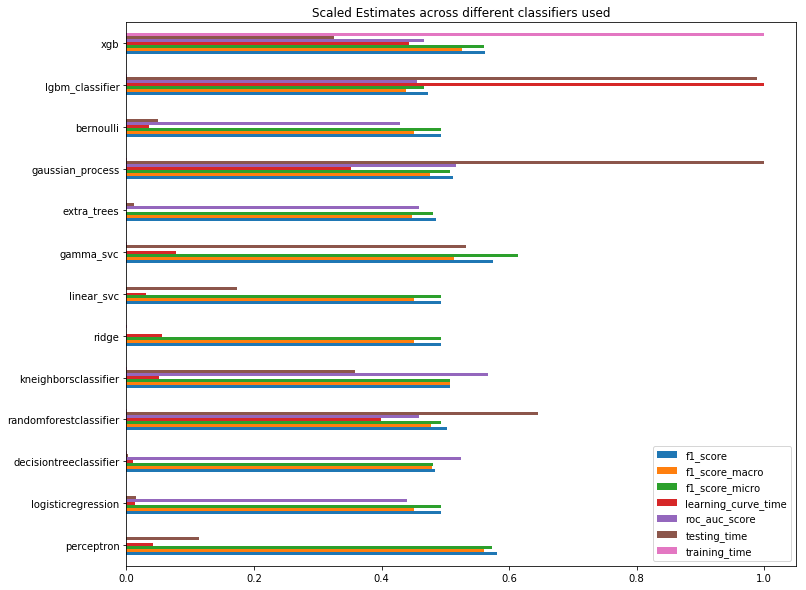

In [90]:
results1['learning_curve_time'] = results1['learning_curve_time'].astype('float64')
results1['testing_time'] = results1['testing_time'].astype('float64')
results1['training_time'] = results1['training_time'].astype('float64')
results1['f1_score'] = results1['f1_score'].astype('float64')
results1['f1_score_micro'] = results1['f1_score_micro'].astype('float64')
results1['f1_score_macro'] = results1['f1_score_macro'].astype('float64')
results1['roc_auc_score'] = results1['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results1['learning_curve_time'] = (results1['learning_curve_time']- results1['learning_curve_time'].min())/(results1['learning_curve_time'].max()- results1['learning_curve_time'].min())
results1['testing_time'] = (results1['testing_time']- results1['testing_time'].min())/(results1['testing_time'].max()- results1['testing_time'].min())
results1['training_time'] = (results1['training_time']- results1['training_time'].min())/(results1['training_time'].max()- results1['training_time'].min())

results1.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

##### SMOTE Auto

Grid Search Best parameters  {'perceptron__eta0': 0.1, 'perceptron__max_iter': 10}
Grid Search Best score  0.5231860530773574
Code block 'training' took(HH:MM:SS): 0:00:00.050757
Code block 'testing' took(HH:MM:SS): 0:00:00.000261
F1 score 0.5774358974358974
Classification report  
               precision    recall  f1-score   support

           0       0.44      0.74      0.56        27
           1       0.77      0.48      0.59        48

   micro avg       0.57      0.57      0.57        75
   macro avg       0.61      0.61      0.57        75
weighted avg       0.65      0.57      0.58        75



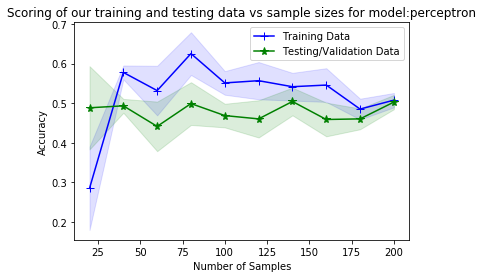

Confusion matrix, without normalization
[[20  7]
 [25 23]]


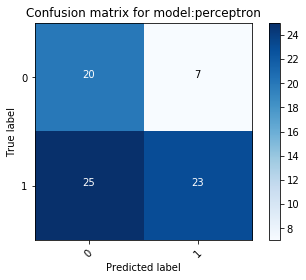

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.395681
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000023
Grid Search Best parameters  {'logisticregression__C': 100}
Grid Search Best score  0.5407785149632975
Code block 'training' took(HH:MM:SS): 0:00:00.044996
Code block 'testing' took(HH:MM:SS): 0:00:00.000118
F1 score 0.5026294253691513
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.74      0.52        27
           1       0.72      0.38      0.49        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.56      0.56      0.51        75
weighted avg       0.60      0.51      0.50        75



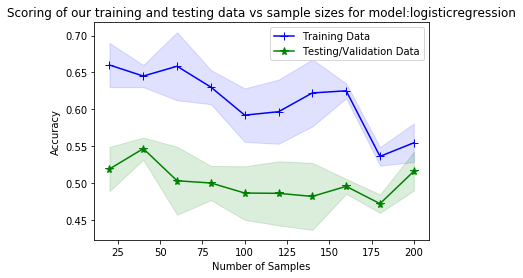

Confusion matrix, without normalization
[[20  7]
 [30 18]]


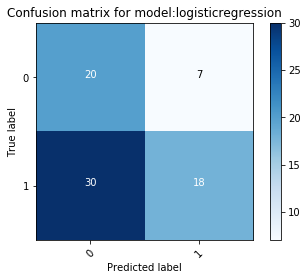

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.335301
inside decision function


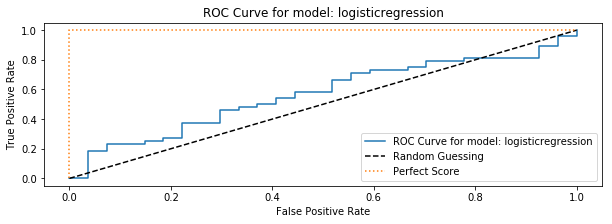

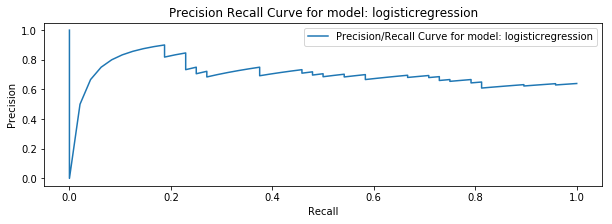

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.246858
Grid Search Best parameters  {'decisiontreeclassifier__criterion': 'entropy', 'decisiontreeclassifier__max_depth': 10}
Grid Search Best score  0.6366988989271599
Code block 'training' took(HH:MM:SS): 0:00:00.077875
Code block 'testing' took(HH:MM:SS): 0:00:00.000104
F1 score 0.38342458400429413
Classification report  
               precision    recall  f1-score   support

           0       0.26      0.41      0.32        27
           1       0.52      0.35      0.42        48

   micro avg       0.37      0.37      0.37        75
   macro avg       0.39      0.38      0.37        75
weighted avg       0.42      0.37      0.38        75



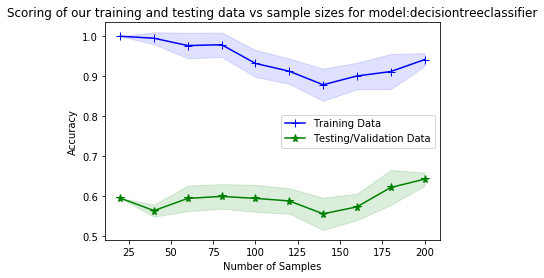

Confusion matrix, without normalization
[[11 16]
 [31 17]]


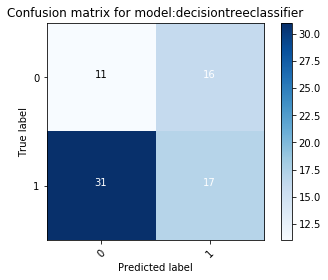

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.334154
inside decision function


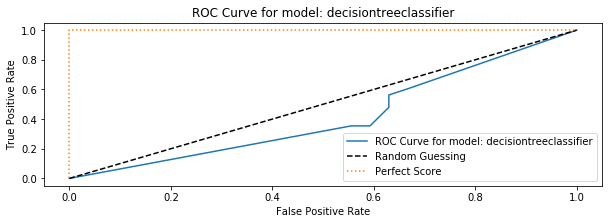

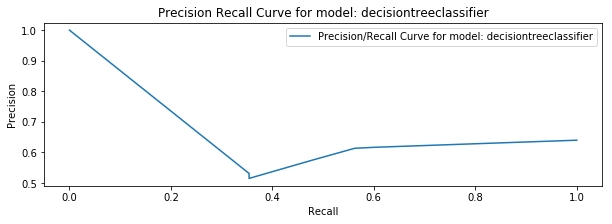

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.224614
Grid Search Best parameters  {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 12}
Grid Search Best score  0.6841385516657256
Code block 'training' took(HH:MM:SS): 0:00:00.311661
Code block 'testing' took(HH:MM:SS): 0:00:00.001442
F1 score 0.5417572296923926
Classification report  
               precision    recall  f1-score   support

           0       0.38      0.48      0.43        27
           1       0.66      0.56      0.61        48

   micro avg       0.53      0.53      0.53        75
   macro avg       0.52      0.52      0.52        75
weighted avg       0.56      0.53      0.54        75



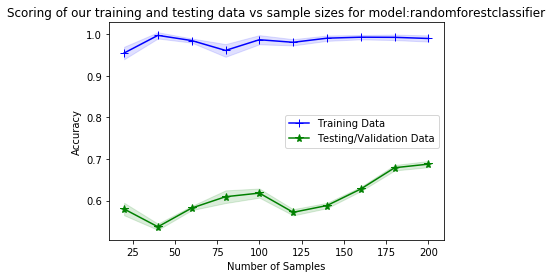

Confusion matrix, without normalization
[[13 14]
 [21 27]]


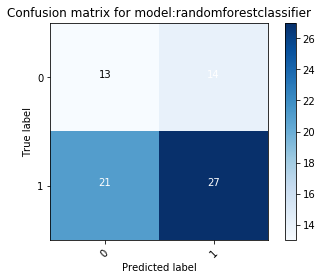

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.234536
inside decision function


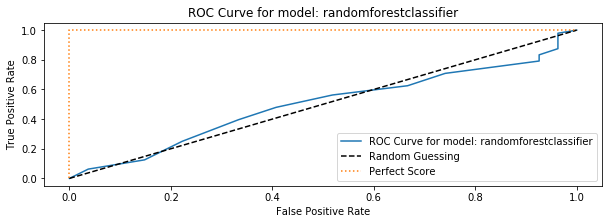

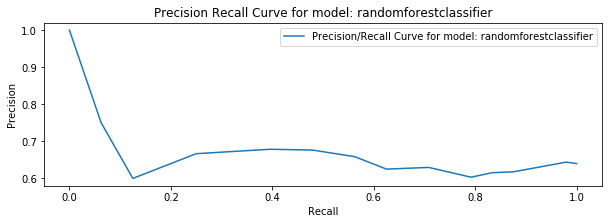

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.222485
Grid Search Best parameters  {'kneighborsclassifier__n_neighbors': 4}
Grid Search Best score  0.7085421372106155
Code block 'training' took(HH:MM:SS): 0:00:00.059695
Code block 'testing' took(HH:MM:SS): 0:00:00.001193
F1 score 0.5246153846153846
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.67      0.50        27
           1       0.70      0.44      0.54        48

   micro avg       0.52      0.52      0.52        75
   macro avg       0.55      0.55      0.52        75
weighted avg       0.59      0.52      0.52        75



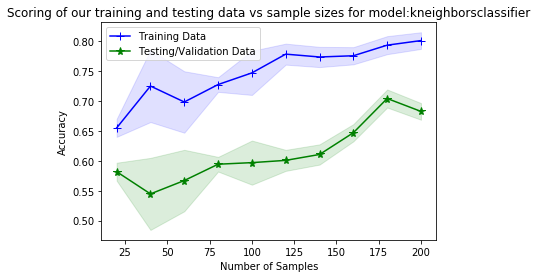

Confusion matrix, without normalization
[[18  9]
 [27 21]]


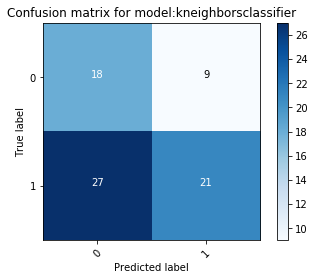

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.460951
inside decision function


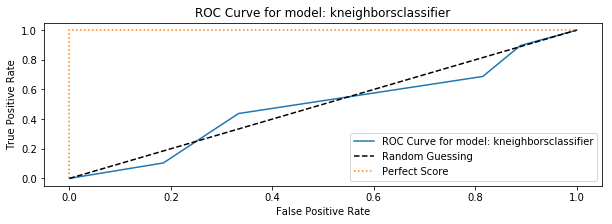

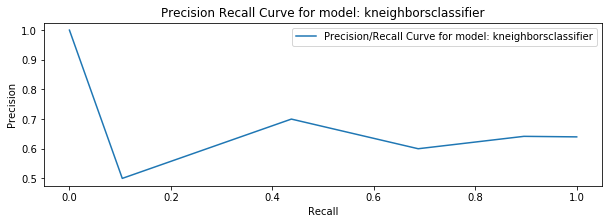

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.222912
Grid Search Best parameters  {'ridge__alpha': 1, 'ridge__max_iter': 100}
Grid Search Best score  0.5407785149632975
Code block 'training' took(HH:MM:SS): 0:00:00.139960
Code block 'testing' took(HH:MM:SS): 0:00:00.000151
F1 score 0.5026294253691513
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.74      0.52        27
           1       0.72      0.38      0.49        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.56      0.56      0.51        75
weighted avg       0.60      0.51      0.50        75



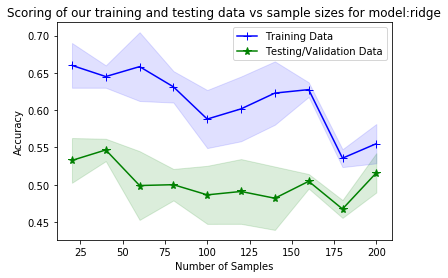

Confusion matrix, without normalization
[[20  7]
 [30 18]]


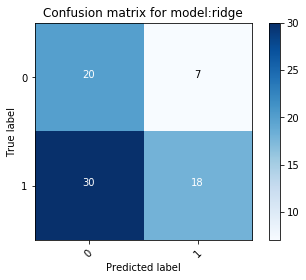

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.405704
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000017
Grid Search Best parameters  {'linear_svc__C': 0.025}
Grid Search Best score  0.541219649915302
Code block 'training' took(HH:MM:SS): 0:00:00.025383
Code block 'testing' took(HH:MM:SS): 0:00:00.000274
F1 score 0.5138461538461538
Classification report  
               precision    recall  f1-score   support

           0       0.41      0.78      0.54        27
           1       0.75      0.38      0.50        48

   micro avg       0.52      0.52      0.52        75
   macro avg       0.58      0.58      0.52        75
weighted avg       0.63      0.52      0.51        75



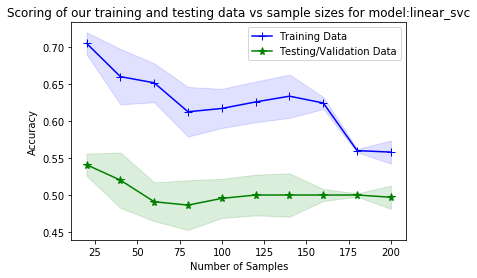

Confusion matrix, without normalization
[[21  6]
 [30 18]]


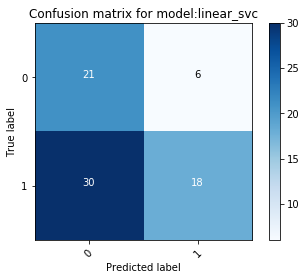

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.380019
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000019
Grid Search Best parameters  {'gamma_svc__C': 1, 'gamma_svc__gamma': 2}
Grid Search Best score  0.7987189440993789
Code block 'training' took(HH:MM:SS): 0:00:00.132751
Code block 'testing' took(HH:MM:SS): 0:00:00.000895
F1 score 0.5003508771929824
Classification report  
               precision    recall  f1-score   support

           0       0.22      0.07      0.11        27
           1       0.62      0.85      0.72        48

   micro avg       0.57      0.57      0.57        75
   macro avg       0.42      0.46      0.42        75
weighted avg       0.48      0.57      0.50        75



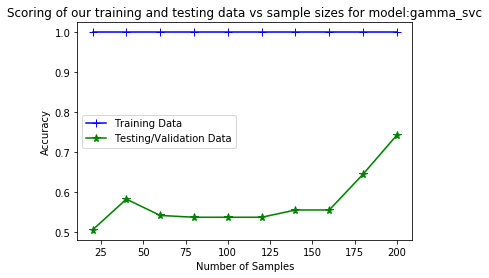

Confusion matrix, without normalization
[[ 2 25]
 [ 7 41]]


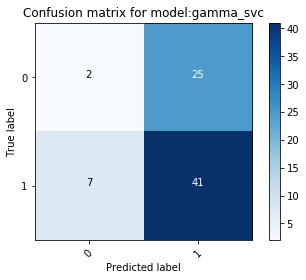

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.481385
Code block 'predict_proba' took(HH:MM:SS): 0:00:00.000024
Grid Search Best parameters  {'extra_trees__criterion': 'gini', 'extra_trees__max_depth': 6}
Grid Search Best score  0.603993153585545
Code block 'training' took(HH:MM:SS): 0:00:00.084836
Code block 'testing' took(HH:MM:SS): 0:00:00.000107
F1 score 0.49035294117647055
Classification report  
               precision    recall  f1-score   support

           0       0.34      0.48      0.40        27
           1       0.62      0.48      0.54        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.48      0.48      0.47        75
weighted avg       0.52      0.48      0.49        75



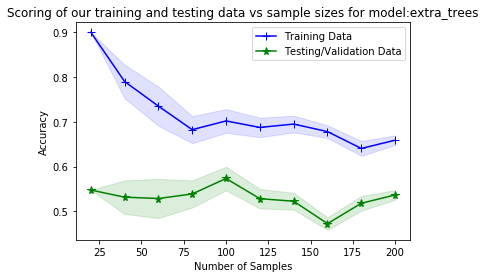

Confusion matrix, without normalization
[[13 14]
 [25 23]]


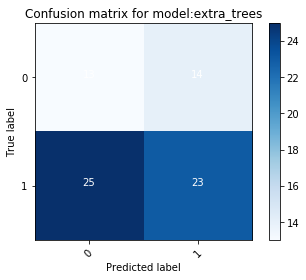

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.342227
inside decision function


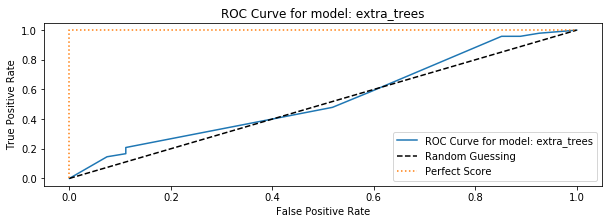

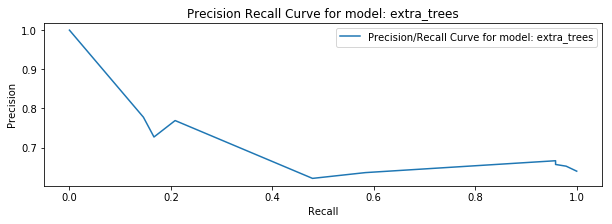

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.289577
Grid Search Best parameters  {'gaussian_process__max_iter_predict': 200}
Grid Search Best score  0.8285396668548843
Code block 'training' took(HH:MM:SS): 0:00:00.172406
Code block 'testing' took(HH:MM:SS): 0:00:00.001145
F1 score 0.4997901049475262
Classification report  
               precision    recall  f1-score   support

           0       0.32      0.37      0.34        27
           1       0.61      0.56      0.59        48

   micro avg       0.49      0.49      0.49        75
   macro avg       0.47      0.47      0.47        75
weighted avg       0.51      0.49      0.50        75



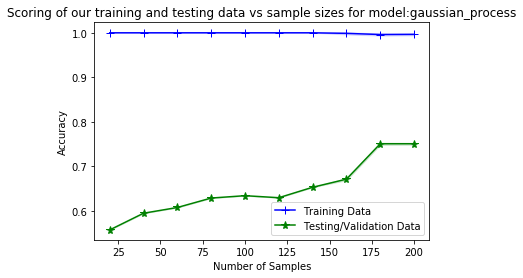

Confusion matrix, without normalization
[[10 17]
 [21 27]]


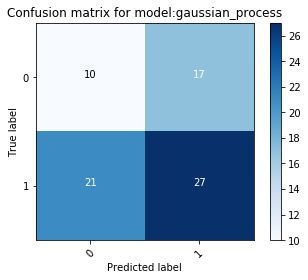

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.896310
inside decision function


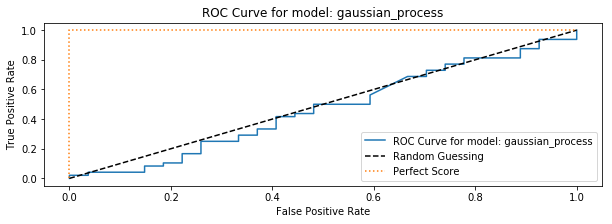

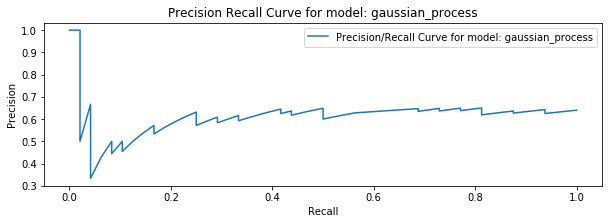

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.285233
Grid Search Best parameters  {'bernoulli__alpha': 0.2}
Grid Search Best score  0.5647762563523433
Code block 'training' took(HH:MM:SS): 0:00:00.045004
Code block 'testing' took(HH:MM:SS): 0:00:00.000173
F1 score 0.5066666666666667
Classification report  
               precision    recall  f1-score   support

           0       0.40      0.70      0.51        27
           1       0.70      0.40      0.51        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.55      0.55      0.51        75
weighted avg       0.59      0.51      0.51        75



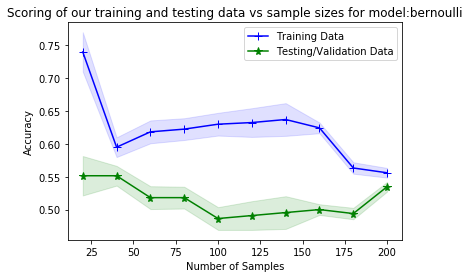

Confusion matrix, without normalization
[[19  8]
 [29 19]]


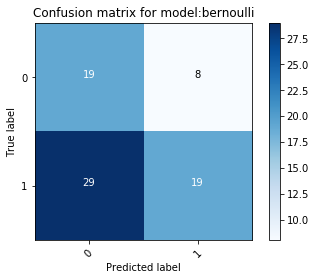

Code block 'learning_curve' took(HH:MM:SS): 0:00:00.354813
inside decision function


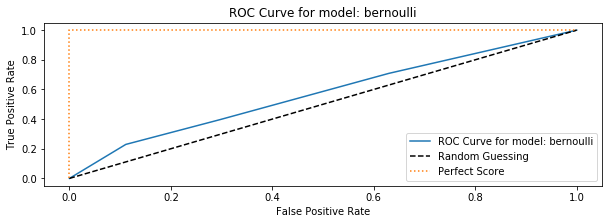

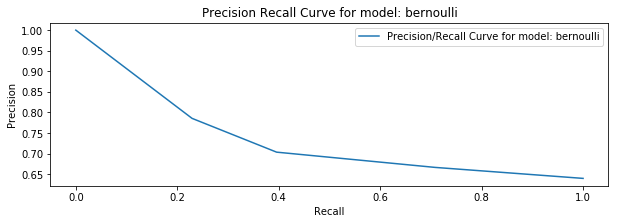

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.222862
Grid Search Best parameters  {'lgbm_classifier__bagging_freq': 1, 'lgbm_classifier__bagging_seed': 123, 'lgbm_classifier__feature_fraction': 0.9, 'lgbm_classifier__learning_rate': 0.01, 'lgbm_classifier__max_depth': 20, 'lgbm_classifier__min_child_samples': 2, 'lgbm_classifier__n_estimators': 5000, 'lgbm_classifier__num_boost_round': 100, 'lgbm_classifier__num_leaves': 25}
Grid Search Best score  0.5301559853190287
Code block 'training' took(HH:MM:SS): 0:00:00.175730
Code block 'testing' took(HH:MM:SS): 0:00:00.000944
F1 score 0.4893866273715234
Classification report  
               precision    recall  f1-score   support

           0       0.32      0.41      0.36        27
           1       0.61      0.52      0.56        48

   micro avg       0.48      0.48      0.48        75
   macro avg       0.47      0.46      0.46        75
weighted avg       0.51      0.48      0.49        75



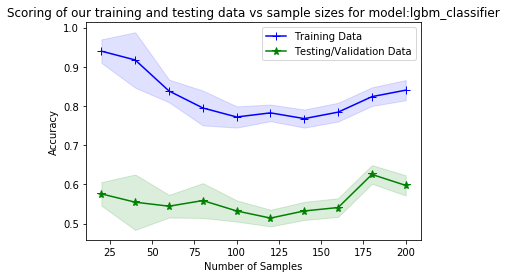

Confusion matrix, without normalization
[[11 16]
 [23 25]]


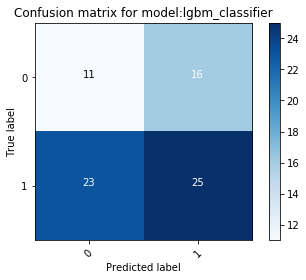

Code block 'learning_curve' took(HH:MM:SS): 0:00:02.429526
inside decision function


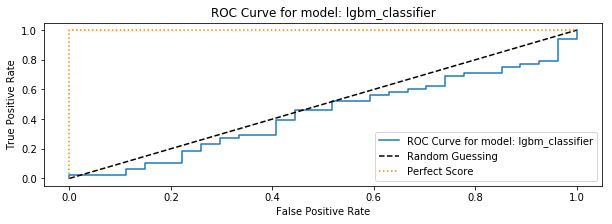

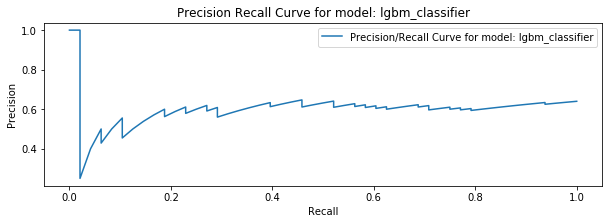

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.219337
Grid Search Best parameters  {'xgb__booster': 'gbtree', 'xgb__learning_rate': 1, 'xgb__max_depth': 6, 'xgb__n_estimators': 100, 'xgb__subsample': 0.5}
Grid Search Best score  0.6812888198757764
Code block 'training' took(HH:MM:SS): 0:07:06.784382
Code block 'testing' took(HH:MM:SS): 0:00:00.000545
F1 score 0.5163875205254516
Classification report  
               precision    recall  f1-score   support

           0       0.36      0.48      0.41        27
           1       0.64      0.52      0.57        48

   micro avg       0.51      0.51      0.51        75
   macro avg       0.50      0.50      0.49        75
weighted avg       0.54      0.51      0.52        75



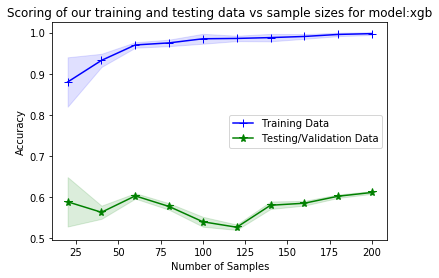

Confusion matrix, without normalization
[[13 14]
 [23 25]]


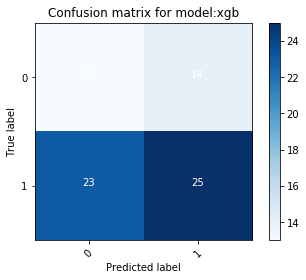

Code block 'learning_curve' took(HH:MM:SS): 0:00:01.127013
inside decision function


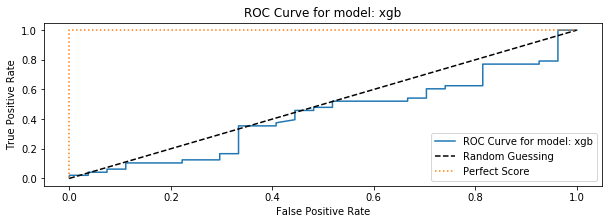

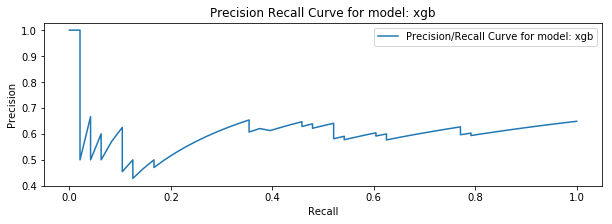

Code block 'predict_proba' took(HH:MM:SS): 0:00:00.221154
Code block 'overalltime' took(HH:MM:SS): 0:07:19.522023
439522.0233767623


In [91]:
response = execute(
        x_train_smote_auto_tsne ,
        _y_train_smt ,
        x_test_tsne,
        y_test,
        classifiers,
        classifier_names,
        classifier_param_grid,
        cv=cv,
        score=score,
        scaler=None)

In [92]:
results = panda.DataFrame(response).transpose()
results.head()
results[['f1_score',
         'f1_score_macro',
         'f1_score_micro',
         'learning_curve_time',
         'roc_auc_score',
         'testing_time',
         'training_time']]\
.sort_values(by=['roc_auc_score',],ascending=False)

,f1_score,f1_score_macro,f1_score_micro,learning_curve_time,roc_auc_score,testing_time,training_time
bernoulli,0.506667,0.506667,0.506667,354.813,0.570988,0.172942,45.0042
logisticregression,0.502629,0.506316,0.506667,335.301,0.567901,0.11776,44.9957
extra_trees,0.490353,0.470588,0.48,342.227,0.535108,0.106951,84.8361
randomforestclassifier,0.541757,0.516486,0.533333,1234.54,0.496142,1.44213,311.661
kneighborsclassifier,0.524615,0.519231,0.52,460.951,0.484568,1.19296,59.6946
gaussian_process,0.49979,0.465892,0.493333,896.31,0.466821,1.14517,172.406
lgbm_classifier,0.489387,0.461227,0.48,2429.53,0.43287,0.944355,175.73
xgb,0.516388,0.493706,0.506667,1127.01,0.424769,0.544995,426784
decisiontreeclassifier,0.383425,0.369297,0.373333,334.154,0.415895,0.104107,77.8751
perceptron,0.577436,0.57265,0.573333,395.681,0,0.26112,50.7574


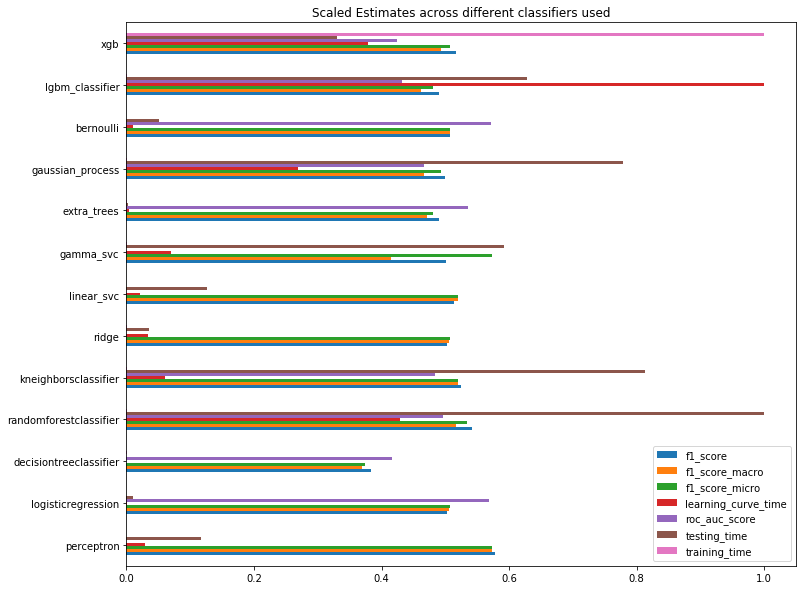

In [93]:
results['learning_curve_time'] = results['learning_curve_time'].astype('float64')
results['testing_time'] = results['testing_time'].astype('float64')
results['training_time'] = results['training_time'].astype('float64')
results['f1_score'] = results['f1_score'].astype('float64')
results['f1_score_micro'] = results['f1_score_micro'].astype('float64')
results['f1_score_macro'] = results['f1_score_macro'].astype('float64')
results['roc_auc_score'] = results['roc_auc_score'].astype('float64')
# results['roc_auc_macro'] = results['roc_auc_macro'].astype('float64')

#scaling time parameters between 0 and 1
results['learning_curve_time'] = (results['learning_curve_time']- results['learning_curve_time'].min())/(results['learning_curve_time'].max()- results['learning_curve_time'].min())
results['testing_time'] = (results['testing_time']- results['testing_time'].min())/(results['testing_time'].max()- results['testing_time'].min())
results['training_time'] = (results['training_time']- results['training_time'].min())/(results['training_time'].max()- results['training_time'].min())

results.plot(kind='barh',figsize=(12, 10))
plot.title("Scaled Estimates across different classifiers used")
plot.show()

### Conclusion:

#### 1. Extra trees classifier and Kneighborclassifier perform well undersampling SMOTE

In [94]:
x.shape, y.shape

((250, 300), (250,))

In [95]:
tsne = TSNE()

tl = TomekLinks(return_indices=True, ratio='majority')
_x_tomek, _y_tomek, id_tl = tl.fit_sample(x, y)
_x_tomek_tsne = tsne.fit_transform(scaler.fit_transform(_x_tomek))


In [97]:
extra_trees_estimator = response2.get('logisticregression',{}).get('best_estimator')
extra_trees_estimator.fit(_x_tomek_tsne,_y_tomek)

Pipeline(memory=None,
     steps=[('logisticregression', LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=1, solver='warn',
          tol=0.0001, verbose=0, warm_start=False))])

In [98]:
test_data = panda.read_csv('data/test.csv')


In [99]:
x_test_smote_tsne = tsne.fit_transform(scaler.fit_transform(test_data))

In [100]:
test_target = extra_trees_estimator.predict(x_test_smote_tsne)

In [101]:
test_target.shape

(19750,)

In [111]:
x_test_smote_tsne.shape, test_target, np.bincount(test_target)

((19750, 2),
 array([1, 1, 1, ..., 1, 1, 1], dtype=int64),
 array([ 2621, 17129], dtype=int64))

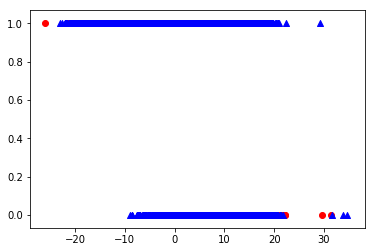

In [108]:
plot.scatter(x_test_smote_tsne[:,0], test_target, marker='o',c='red')
plot.scatter(x_test_smote_tsne[:,1], test_target,marker='^' ,c='blue')
plot.show()

In [109]:
final_submission = panda.DataFrame({'target':test_target})
final_submission['id'] = test_data['id']
final_submission[['id','target']].head() 

,id,target
0,250,1
1,251,1
2,252,1
3,253,1
4,254,1


In [112]:
final_submission[['id','target']].to_csv('sample_submission_4.csv', index=False)